# IMU Step-by-Step Analysis: ISM330DHCX Sensor Data

## Objective
Analyze raw IMU data to:
1. Characterize raw accelerometer and gyroscope data
2. Calculate roll/pitch/yaw from accelerometer, gyroscope, and sensor fusion
3. Determine noise characteristics
4. Compare with test configuration (if available)
5. Implement and compare AHRS algorithms for accurate attitude estimation

## Physical Framework
- **Coordinate System**: East(X), Down(Y), North(Z) - So not NED convention
- **Accelerometer**: Measures specific force (gravity + linear acceleration)
- **Gyroscope**: Measures angular velocity in body frame
- **Key Challenge**: Azimuth drift cannot be corrected without magnetometer

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from pathlib import Path
from typing import Optional, Tuple, List
from scipy import signal
from scipy.spatial.transform import Rotation as R
from scipy.stats import t
from dataclasses import dataclass
from enum import Enum

# Configuration for test sequences (if available)
test_configs = [
    {
        "test_name": "raw_data_output_azimuth.csv",
        "test": {
            "sensor_specs": {
                "accel_range": 2,  # g
                "gyro_range": 2000,  # dps
                "odr": 104,  # Hz
                "noise_floor": 577e-6,  # g
            },
            "test_sequence": [
                # 60-second tests with changes at t=20s
                {
                    "test_id": 0,
                    "duration": 60,
                    "change_time": 20,
                    "description": "Baseline - no movement",
                    "power_state": "on",
                    "phi_change": 0,
                    "expected_detectable": False,
                },
                {
                    "test_id": 1,
                    "duration": 60,
                    "change_time": 20,
                    "description": "5° phi rotation (power off)",
                    "power_state": "off",
                    "phi_change": 5,
                    "expected_detectable": True,
                },
                {
                    "test_id": 2,
                    "duration": 60,
                    "change_time": 20,
                    "description": "Return to baseline (power on)",
                    "power_state": "on",
                    "phi_change": 0,
                    "expected_detectable": False,
                },
                {
                    "test_id": 3,
                    "duration": 60,
                    "change_time": 20,
                    "description": "5° phi rotation (power on)",
                    "power_state": "on",
                    "phi_change": 5,
                    "expected_detectable": True,
                },
                # 30-second tests with changes at t=15s
                {
                    "test_id": 4,
                    "duration": 30,
                    "change_time": 15,
                    "description": "10° phi rotation (power on)",
                    "power_state": "on",
                    "phi_change": 10,
                    "expected_detectable": True,
                },
                {
                    "test_id": 5,
                    "duration": 30,
                    "change_time": 15,
                    "description": "10° phi rotation (power off)",
                    "power_state": "off",
                    "phi_change": 10,
                    "expected_detectable": True,
                },
                {
                    "test_id": 6,
                    "duration": 30,
                    "change_time": 15,
                    "description": "15° phi rotation (power off)",
                    "power_state": "off",
                    "phi_change": 15,
                    "expected_detectable": True,
                },
                {
                    "test_id": 7,
                    "duration": 30,
                    "change_time": 15,
                    "description": "15° phi rotation (power on)",
                    "power_state": "on",
                    "phi_change": 15,
                    "expected_detectable": True,
                },
                {
                    "test_id": 8,
                    "duration": 30,
                    "change_time": 15,
                    "description": "5° phi rotation (power off)",
                    "power_state": "off",
                    "phi_change": 5,
                    "expected_detectable": True,
                },
                {
                    "test_id": 9,
                    "duration": 30,
                    "change_time": 15,
                    "description": "5° phi rotation (power on)",
                    "power_state": "on",
                    "phi_change": 5,
                    "expected_detectable": True,
                },
                # Sequential power state tests
                {
                    "test_id": 10,
                    "duration": 30,
                    "change_time": 15,
                    "description": "4° phi rotation (off→on)",
                    "power_state": "off_then_on",
                    "phi_change": 4,
                    "expected_detectable": True,
                },
                {
                    "test_id": 11,
                    "duration": 30,
                    "change_time": 15,
                    "description": "3° phi rotation (off→on)",
                    "power_state": "off_then_on",
                    "phi_change": 3,
                    "expected_detectable": False,  # Near theoretical limit
                },
                {
                    "test_id": 12,
                    "duration": 30,
                    "change_time": 15,
                    "description": "2° phi rotation (off→on)",
                    "power_state": "off_then_on",
                    "phi_change": 2,
                    "expected_detectable": False,  # Below theoretical limit
                },
            ],
        },
    },
    {
        "test_name": "raw_data_output_altitude.csv",
        "test": {
            "sensor_specs": {
                "accel_range": 2,  # g
                "gyro_range": 2000,  # dps
                "odr": 104,  # Hz
                "noise_floor": 577e-6,  # g
            },
            "initial_conditions": {
                "imu_offset": 0.3,  # degrees
                "theta_start": 0.3,  # degrees (altitude)
                "phi_start": 0,  # degrees (azimuth)
                "psi_start": 0.0,  # degrees (zenith)
            },
            "test_sequence": [
                # 60-second tests with changes at t=20s
                {
                    "test_id": 0,
                    "duration": 60,
                    "change_time": 20,
                    "description": "Baseline - no movement",
                    "power_state": "on",
                    "theta_change": 0,
                    "expected_detectable": False,
                },
                {
                    "test_id": 1,
                    "duration": 60,
                    "change_time": 20,
                    "description": "5° theta rotation (power off)",
                    "power_state": "off",
                    "theta_change": 5,
                    "expected_detectable": True,
                },
                {
                    "test_id": 2,
                    "duration": 60,
                    "change_time": 20,
                    "description": "4.7° theta rotation (power on)",
                    "power_state": "on",
                    "theta_change": 4.7,
                    "expected_detectable": True,
                },
                # 30-second tests with changes at t=15s
                {
                    "test_id": 3,
                    "duration": 30,
                    "change_time": 15,
                    "description": "10.2° theta rotation (power on)",
                    "power_state": "on",
                    "theta_change": 10.2,
                    "expected_detectable": True,
                },
                {
                    "test_id": 4,
                    "duration": 30,
                    "change_time": 15,
                    "description": "10° theta return to 0 (power off)",
                    "power_state": "off",
                    "theta_change": -10,  # back to 0 from previous 10.2°
                    "expected_detectable": True,
                },
                {
                    "test_id": 5,
                    "duration": 30,
                    "change_time": 15,
                    "description": "15° theta rotation (power off)",
                    "power_state": "off",
                    "theta_change": 15,  # from 0 to 15°
                    "expected_detectable": True,
                },
                {
                    "test_id": 6,
                    "duration": 30,
                    "change_time": 15,
                    "description": "15° theta return to 0 (power on)",
                    "power_state": "on",
                    "theta_change": -15,  # back to 0 from previous 15°
                    "expected_detectable": True,
                },
                {
                    "test_id": 7,
                    "duration": 30,
                    "change_time": 15,
                    "description": "5° theta rotation (power off)",
                    "power_state": "off",
                    "theta_change": 5,  # from 0 to 5°
                    "expected_detectable": True,
                },
                {
                    "test_id": 8,
                    "duration": 30,
                    "change_time": 15,
                    "description": "5° theta return to 0 (power on)",
                    "power_state": "on",
                    "theta_change": -5,  # back to 0 from previous 5°
                    "expected_detectable": True,
                },
                # Sequential power state tests
                {
                    "test_id": 9,
                    "duration": 30,
                    "change_time": 15,
                    "description": "4° theta rotation (off→on)",
                    "power_state": "off_then_on",
                    "theta_change": 4,
                    "expected_detectable": True,
                },
                {
                    "test_id": 10,
                    "duration": 30,
                    "change_time": 15,
                    "description": "3° theta rotation (off→on)",
                    "power_state": "off_then_on",
                    "theta_change": 3,
                    "expected_detectable": False,  # Near theoretical limit
                },
                {
                    "test_id": 11,
                    "duration": 30,
                    "change_time": 15,
                    "description": "1.2° theta rotation (off→on)",
                    "power_state": "off_then_on",
                    "theta_change": 1.2,
                    "expected_detectable": False,  # Below theoretical limit
                },
            ],
        },
    },
]

# Helper functions
def wrap_angle_deg(angle: float) -> float:
    """Wrap angle to [-180, 180) range"""
    return (angle + 180.0) % 360.0 - 180.0

def set_sampling_rate(timestamps: np.ndarray, sampling_rate: int = 104) -> np.ndarray:
    current_s: float = timestamps[0]
    updated_timestamps: List[float] = []
    for i in range(1, len(timestamps)):
        # Check if a gap larger than 10 seconds exists meaning a restart happened and we should reset the current time
        if timestamps[i] + 10 < timestamps[i - 1]:
            current_s = timestamps[i]
        updated_timestamps.append(current_s)
        current_s += 1.0 / sampling_rate
    updated_timestamps.append(current_s)
    return np.array(updated_timestamps)


class ChangeType(Enum):
    AZIMUTH = "azimuth"  # phi change
    ALTITUDE = "altitude"  # theta change
    COMBINED = "combined"  # both angles

@dataclass
class AngleChangeEvent:
    """Represents a detected angle change event"""
    timestamp: float
    start_idx: int
    end_idx: int
    change_type: ChangeType
    delta_phi: float  # Azimuth change in degrees
    delta_theta: float  # Altitude change in degrees
    confidence: float  # Statistical confidence [0,1]
    duration: float  # Time duration of the change
    stable_before: Tuple[float, float]  # (phi_mean, theta_mean) before change
    stable_after: Tuple[float, float]   # (phi_mean, theta_mean) after change

class MultiAngleDetector:
    """
    Change detection system for multiple angle changes within test sequences
    Uses statistical change point detection with configurable sensitivity
    """
    
    def __init__(self, 
                 window_size: float = 5.0,  # Stabilization window in seconds
                 min_change_deg: float = 1.0,  # Minimum detectable change
                 confidence_threshold: float = 0.95,  # Statistical confidence
                 sampling_rate: float = 104.0):
        self.window_size = window_size
        self.min_change_deg = min_change_deg
        self.confidence_threshold = confidence_threshold
        self.fs = sampling_rate
        self.window_samples = int(window_size * sampling_rate)
    
    def calculate_horizontal_angles(self, accel_data: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """
        Calculate phi (azimuth) and theta (altitude) from accelerometer data
        Using consistent coordinate system: East(X), Down(Y), North(Z)

        
        Args:
            accel_data: Nx3 accelerometer data in g [ax, ay, az]
            
        Returns:
            phi: Azimuth angles in degrees (rotation around vertical axis)
            theta: Altitude angles in degrees (elevation angle)

        """
        ax, ay, az = accel_data[:, 0], accel_data[:, 1], accel_data[:, 2]
        
        # Azimuth (phi) - rotation around vertical axis (Y-axis in this frame)
        phi = np.degrees(np.arctan2(ax, az))
        
        # Altitude (theta) - elevation angle from horizontal plane
        theta = np.degrees(np.arctan2(-ay, np.sqrt(ax**2 + az**2)))
        
        return phi, theta
    
    def detect_change_points(self, phi: np.ndarray, theta: np.ndarray, 
                           timestamps: np.ndarray) -> List[int]:
        """
        Detect change points using CUSUM (Cumulative Sum) algorithm
        
        Args:
            phi: Azimuth angle series
            theta: Altitude angle series  
            timestamps: Time series
            
        Returns:
            List of change point indices
        """
        n = len(phi)
        change_points = []
        
        # Combined signal for change detection (weighted by expected sensitivity)
        combined_signal = np.sqrt(phi**2 + theta**2)
        
        # CUSUM parameters
        threshold = self.min_change_deg * 2  # Detection threshold
        drift = self.min_change_deg * 0.5    # Expected drift
        
        # Forward and backward CUSUM
        cusum_pos = np.zeros(n)
        cusum_neg = np.zeros(n)
        
        for i in range(1, n):
            cusum_pos[i] = max(0, cusum_pos[i-1] + (combined_signal[i] - combined_signal[i-1]) - drift)
            cusum_neg[i] = max(0, cusum_neg[i-1] - (combined_signal[i] - combined_signal[i-1]) - drift)
        
        # Detect threshold crossings
        for i in range(self.window_samples, n - self.window_samples):
            if cusum_pos[i] > threshold or cusum_neg[i] > threshold:
                # Avoid duplicate detections
                if not change_points or (i - change_points[-1]) > self.window_samples:
                    change_points.append(i)
        
        return change_points
    
    def validate_change_event(self, phi: np.ndarray, theta: np.ndarray, 
                            change_idx: int) -> Optional[AngleChangeEvent]:
        """
        Validate and characterize a detected change point
        
        Args:
            phi: Azimuth angle series
            theta: Altitude angle series
            change_idx: Index of potential change point
            
        Returns:
            AngleChangeEvent if valid, None otherwise
        """
        n = len(phi)
        half_window = self.window_samples // 2
        
        # Define before and after windows
        before_start = max(0, change_idx - self.window_samples)
        before_end = change_idx - half_window
        after_start = change_idx + half_window  
        after_end = min(n, change_idx + self.window_samples)
        
        # Ensure sufficient data
        if (before_end - before_start < half_window or 
            after_end - after_start < half_window):
            return None
        
        # Calculate stable region statistics
        phi_before = phi[before_start:before_end]
        phi_after = phi[after_start:after_end]
        theta_before = theta[before_start:before_end]
        theta_after = theta[after_start:after_end]
        
        phi_before_mean = np.mean(phi_before)
        phi_after_mean = np.mean(phi_after)
        theta_before_mean = np.mean(theta_before)
        theta_after_mean = np.mean(theta_after)
        
        # Calculate changes
        delta_phi = self._wrap_angle(phi_after_mean - phi_before_mean)
        delta_theta = theta_after_mean - theta_before_mean
        
        # Statistical significance test (t-test)
        phi_t_stat, phi_p_value = self._t_test_independent(phi_before, phi_after)
        theta_t_stat, theta_p_value = self._t_test_independent(theta_before, theta_after)
        
        # Combined confidence
        confidence = 1 - max(phi_p_value, theta_p_value)
        
        # Determine change type and significance
        phi_significant = abs(delta_phi) > self.min_change_deg and phi_p_value < (1 - self.confidence_threshold)
        theta_significant = abs(delta_theta) > self.min_change_deg and theta_p_value < (1 - self.confidence_threshold)
        
        if not (phi_significant or theta_significant):
            return None
        
        # Determine change type
        if phi_significant and theta_significant:
            change_type = ChangeType.COMBINED
        elif phi_significant:
            change_type = ChangeType.AZIMUTH
        else:
            change_type = ChangeType.ALTITUDE
        
        return AngleChangeEvent(
            timestamp=change_idx / self.fs,
            start_idx=before_start,
            end_idx=after_end,
            change_type=change_type,
            delta_phi=delta_phi,
            delta_theta=delta_theta,
            confidence=confidence,
            duration=(after_end - before_start) / self.fs,
            stable_before=(phi_before_mean, theta_before_mean),
            stable_after=(phi_after_mean, theta_after_mean)
        )
    
    def analyze_test_sequence(self, accel_data: np.ndarray, timestamps: np.ndarray, 
                            test_config: dict = None) -> List[AngleChangeEvent]:
        """
        Analyze a complete test sequence for multiple angle changes
        
        Args:
            accel_data: Nx3 accelerometer data in g
            timestamps: Time series
            test_config: Optional test configuration for validation
            
        Returns:
            List of detected angle change events
        """
        # Calculate horizontal angles
        phi, theta = self.calculate_horizontal_angles(accel_data)
        
        # Detect change points
        change_indices = self.detect_change_points(phi, theta, timestamps)
        
        # Validate each change point
        validated_events = []
        for change_idx in change_indices:
            event = self.validate_change_event(phi, theta, change_idx)
            if event is not None:
                event.timestamp = timestamps[change_idx]
                validated_events.append(event)
        
        return validated_events
    
    def _wrap_angle(self, angle: float) -> float:
        """Wrap angle to [-180, 180) range"""
        return (angle + 180.0) % 360.0 - 180.0
    
    def _t_test_independent(self, sample1: np.ndarray, sample2: np.ndarray) -> Tuple[float, float]:
        """Perform independent t-test between two samples"""
        n1, n2 = len(sample1), len(sample2)
        mean1, mean2 = np.mean(sample1), np.mean(sample2)
        var1, var2 = np.var(sample1, ddof=1), np.var(sample2, ddof=1)
        
        # Pooled variance
        pooled_var = ((n1 - 1) * var1 + (n2 - 1) * var2) / (n1 + n2 - 2)
        
        # T-statistic
        t_stat = (mean1 - mean2) / np.sqrt(pooled_var * (1/n1 + 1/n2))
        
        # Degrees of freedom
        df = n1 + n2 - 2
        
        # Two-tailed p-value
        p_value = 2 * (1 - t.cdf(abs(t_stat), df))
        
        return t_stat, p_value

def visualize_angle_changes(accel_data: np.ndarray, timestamps: np.ndarray, 
                          events: List[AngleChangeEvent], test_id: str = ""):
    """
    Visualize detected angle changes with statistical annotations
    """
    detector = MultiAngleDetector()
    phi, theta = detector.calculate_horizontal_angles(accel_data)
    
    fig, axes = plt.subplots(4, 1, figsize=(15, 12))
    
    # Raw accelerometer data
    ax = axes[0]
    ax.plot(timestamps, accel_data[:, 0], label='Accel X', alpha=0.7)
    ax.plot(timestamps, accel_data[:, 1], label='Accel Y', alpha=0.7)
    ax.plot(timestamps, accel_data[:, 2], label='Accel Z', alpha=0.7)
    ax.set_ylabel('Acceleration (g)')
    ax.set_title(f'Test {test_id} - Raw Accelerometer Data')
    ax.legend()
    ax.grid(alpha=0.3)
    
    # Azimuth angle
    ax = axes[1]
    ax.plot(timestamps, phi, 'b-', linewidth=2, label='Azimuth φ')
    for event in events:
        if event.change_type in [ChangeType.AZIMUTH, ChangeType.COMBINED]:
            ax.axvline(event.timestamp, color='red', alpha=0.7, linestyle='--')
            ax.annotate(f'Δφ={event.delta_phi:.1f}°', 
                       xy=(event.timestamp, phi[int(event.timestamp * detector.fs)]),
                       xytext=(10, 10), textcoords='offset points',
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7),
                       fontsize=8)
    ax.set_ylabel('Azimuth φ (deg)')
    ax.legend()
    ax.grid(alpha=0.3)
    
    # Altitude angle  
    ax = axes[2]
    ax.plot(timestamps, theta, 'g-', linewidth=2, label='Altitude θ')
    for event in events:
        if event.change_type in [ChangeType.ALTITUDE, ChangeType.COMBINED]:
            ax.axvline(event.timestamp, color='red', alpha=0.7, linestyle='--')
            ax.annotate(f'Δθ={event.delta_theta:.1f}°',
                       xy=(event.timestamp, theta[int(event.timestamp * detector.fs)]),
                       xytext=(10, -10), textcoords='offset points', 
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgreen', alpha=0.7),
                       fontsize=8)
    ax.set_ylabel('Altitude θ (deg)')
    ax.legend()
    ax.grid(alpha=0.3)
    
    # Combined magnitude for change detection
    ax = axes[3]
    combined = np.sqrt(phi**2 + theta**2)
    ax.plot(timestamps, combined, 'purple', linewidth=2, label='Combined |angle|')
    for event in events:
        ax.axvline(event.timestamp, color='red', alpha=0.7, linestyle='--')
        ax.annotate(f'C={event.confidence:.2f}',
                   xy=(event.timestamp, combined[int(event.timestamp * detector.fs)]),
                   xytext=(10, 5), textcoords='offset points',
                   bbox=dict(boxstyle='round,pad=0.3', facecolor='orange', alpha=0.7), 
                   fontsize=8)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Combined Angle (deg)')
    ax.legend()
    ax.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print event summary
    if events:
        print(f"\n--- Detected Events for Test {test_id} ---")
        print(f"{'Time':<8} {'Type':<10} {'Δφ (deg)':<10} {'Δθ (deg)':<10} {'Confidence':<12}")
        print("-" * 60)
        for event in events:
            print(f"{event.timestamp:<8.1f} {event.change_type.value:<10} "
                  f"{event.delta_phi:<10.1f} {event.delta_theta:<10.1f} {event.confidence:<12.3f}")
    else:
        print(f"\nNo significant angle changes detected in Test {test_id}")

def compare_with_expected_changes(events: List[AngleChangeEvent], 
                                expected_changes: List[dict]) -> dict:
    """
    Compare detected events with expected test configuration
    
    Args:
        events: List of detected events
        expected_changes: List of expected change dictionaries
        
    Returns:
        Comparison statistics
    """
    results = {
        'detected_count': len(events),
        'expected_count': len(expected_changes),
        'matches': [],
        'false_positives': [],
        'missed_detections': []
    }
    
    # Match detected events with expected changes
    matched_expected = set()
    
    for event in events:
        best_match = None
        min_time_diff = float('inf')
        
        for i, expected in enumerate(expected_changes):
            if i in matched_expected:
                continue
                
            time_diff = abs(event.timestamp - expected.get('time', 0))
            if time_diff < min_time_diff:
                min_time_diff = time_diff
                best_match = (i, expected)
        
        if best_match and min_time_diff < 10.0:  # Within 10 seconds
            idx, expected = best_match
            matched_expected.add(idx)
            
            match_quality = {
                'event': event,
                'expected': expected,
                'time_error': min_time_diff,
                'phi_error': abs(event.delta_phi - expected.get('delta_phi', 0)),
                'theta_error': abs(event.delta_theta - expected.get('delta_theta', 0))
            }
            results['matches'].append(match_quality)
        else:
            results['false_positives'].append(event)
    
    # Find missed detections
    for i, expected in enumerate(expected_changes):
        if i not in matched_expected:
            results['missed_detections'].append(expected)
    
    return results


## 1. Data Loading and Segmentation

Load raw CSV data and segment into test periods if test configuration is available.
Otherwise treat as single continuous test.

In [18]:
file_paths = ['raw_data_output_altitude.csv', 'raw_data_output_azimuth.csv']
sampling_rate = 104  # Hz
fs = sampling_rate
is_edn = True

In [19]:
def load_raw_data(file_path, sampling_rate, is_edn):
    is_edn = True
    df = pd.read_csv(file_path)
    print(f"Loaded {file_path} with {len(df)} samples")
    # Verify required columns
    required_cols = ["timestamp", "accel_x", "accel_y", "accel_z", "gyro_x", "gyro_y", "gyro_z"]
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        raise ValueError(f"Missing columns: {missing_cols}")

    # Convert to numeric
    for col in required_cols[1:]:
        df[col] = pd.to_numeric(df[col], errors="coerce")
    # Drop rows with NaN values in required columns
    df = df.dropna(subset=required_cols)

    if is_edn:
        # Convert axis from EDN to standard ENU
        df["accel_y"], df["accel_z"] = -df["accel_y"], -df["accel_z"]
        df["gyro_y"], df["gyro_z"] = -df["gyro_y"], -df["gyro_z"]   

    print(f"Data loaded: {len(df)} samples")
    print(f"Time range: {df['timestamp'].min():.3f} to {df['timestamp'].max():.3f} seconds")

    df["timestamp"] = set_sampling_rate(df["timestamp"].to_numpy())
    print(f"Updated time range: {df['timestamp'].min():.3f} to {df['timestamp'].max():.3f} seconds")
    return df

dfs = {}
for file_path in file_paths:
    dfs[file_path] = load_raw_data(file_path, sampling_rate, is_edn)

Loaded raw_data_output_altitude.csv with 55617 samples
Data loaded: 55615 samples
Time range: 0.743 to 64.700 seconds
Updated time range: 0.743 to 68.695 seconds
Loaded raw_data_output_azimuth.csv with 57348 samples
Data loaded: 57345 samples
Time range: 0.743 to 61.900 seconds
Updated time range: 0.743 to 65.156 seconds


## 2. Test Segmentation (if applicable)

Detect gaps in timestamp data to segment into individual tests.
Map segments to test configuration if available.

In [20]:
def segmentation_gaps(df, test_config):
    # Detect time gaps for segmentation
    gap_threshold = 5.0  # seconds
    timestamps = df["timestamp"].values
    gaps = np.where(np.abs(np.diff(timestamps)) > gap_threshold)[0]

    # Create segment boundaries
    segment_bounds = []
    start = 0
    for gap_idx in gaps:
        segment_bounds.append((start, gap_idx + 1))
        start = gap_idx + 1
    segment_bounds.append((start, len(df)))

    print(f"Found {len(segment_bounds)} segments:")
    for i, (start, end) in enumerate(segment_bounds):
        duration = df.iloc[end-1]['timestamp'] - df.iloc[start]['timestamp']
        print(f"  Segment {i}: samples {start}-{end-1}, duration {duration:.1f}s")

    # Map to test configuration if available
    segments = []
    if len(segment_bounds) == len(test_config.get('test_sequence', [])):
        print("Mapping segments to test configuration...")
        for i, (start, end) in enumerate(segment_bounds):
            test_meta = test_config['test_sequence'][i].copy()
            segment_data = df.iloc[start:end].copy()
            segments.append({
                'test_id': test_meta['test_id'],
                'data': segment_data,
                'config': test_meta,
                'start_idx': start,
                'end_idx': end
            })
    else:
        print("No test configuration mapping - treating as single test")
        segments = [{'test_id': 0, 'data': df, 'config': {}, 'start_idx': 0, 'end_idx': len(df)}]
    return segments


In [21]:
segmented = {}
for test_config in test_configs:
    file_path = test_config['test_name']
    config = test_config['test']
    print(f"\nSegmenting data from {file_path}...")
    df = dfs[file_path]
    segments = segmentation_gaps(df, config)
    segmented[file_path] = segments


Segmenting data from raw_data_output_azimuth.csv...
Found 13 segments:
  Segment 0: samples 0-6658, duration 64.0s
  Segment 1: samples 6659-13358, duration 64.4s
  Segment 2: samples 13359-19962, duration 63.5s
  Segment 3: samples 19963-26462, duration 62.5s
  Segment 4: samples 26463-29802, duration 32.1s
  Segment 5: samples 29803-33100, duration 31.7s
  Segment 6: samples 33101-36360, duration 31.3s
  Segment 7: samples 36361-39647, duration 31.6s
  Segment 8: samples 39648-42947, duration 31.7s
  Segment 9: samples 42948-46651, duration 35.6s
  Segment 10: samples 46652-49931, duration 31.5s
  Segment 11: samples 49932-53231, duration 31.7s
  Segment 12: samples 53232-57344, duration 39.5s
Mapping segments to test configuration...

Segmenting data from raw_data_output_altitude.csv...
Found 12 segments:
  Segment 0: samples 0-7067, duration 68.0s
  Segment 1: samples 7068-14047, duration 67.1s
  Segment 2: samples 14048-21042, duration 67.3s
  Segment 3: samples 21043-24876, dura

## 3. Raw Sensor Data Analysis

**Physical Basis**: 
- Accelerometer measures specific force: a_measured = a_linear + g
- Gyroscope measures angular velocity: ω_measured = ω_true + bias + noise
- Units: accelerometer in mg (millig), gyroscope in mdps (milli-degrees per second)

In [22]:
def analyze_raw_sensors(data: pd.DataFrame, title: str = ""):
    """Analyze raw accelerometer and gyroscope data"""
    # Convert units
    accel_g = np.column_stack([data['accel_x'], data['accel_y'], data['accel_z']]) / 1000.0  # mg to g
    gyro_dps = np.column_stack([data['gyro_x'], data['gyro_y'], data['gyro_z']]) / 1000.0  # mdps to dps
    
    # Calculate magnitudes
    accel_mag = np.linalg.norm(accel_g, axis=1)
    gyro_mag = np.linalg.norm(gyro_dps, axis=1)
    
    # Statistics
    accel_mean = np.mean(accel_g, axis=0)
    accel_std = np.std(accel_g, axis=0)
    gyro_mean = np.mean(gyro_dps, axis=0)
    gyro_std = np.std(gyro_dps, axis=0)
    
    print(f"\n{title} Raw Sensor Analysis:")
    print(f"Accelerometer (g): mean={accel_mean}, std={accel_std}")
    print(f"Gyroscope (dps): mean={gyro_mean}, std={gyro_std}")
    print(f"Gravity magnitude: {np.mean(accel_mag):.3f}g ± {np.std(accel_mag):.4f}g")
    print(f"Angular velocity RMS: {np.sqrt(np.mean(gyro_mag**2)):.3f} dps")


    return {
        'accel_g': accel_g, 'gyro_dps': gyro_dps,
        'accel_mag': accel_mag, 'gyro_mag': gyro_mag,
        'accel_mean': accel_mean, 'accel_std': accel_std,
        'gyro_mean': gyro_mean, 'gyro_std': gyro_std
    }

# Analyze each segment
test_sensor_analyses = {}
for file_path, segments in segmented.items():
    test_sensor_analyses[file_path] = []
    for segment in segments:
        analysis = analyze_raw_sensors(segment['data'], f"{file_path} - Test {segment['test_id']}")
        test_sensor_analyses[file_path].append(analysis)


raw_data_output_azimuth.csv - Test 0 Raw Sensor Analysis:
Accelerometer (g): mean=[ 0.08974801 -0.94724313  0.21907749], std=[0.00102126 0.00058941 0.00131529]
Gyroscope (dps): mean=[0.39589578 0.79663763 0.56222856], std=[0.6660629  0.91622159 1.02779646]
Gravity magnitude: 0.976g ± 0.0006g
Angular velocity RMS: 1.857 dps

raw_data_output_azimuth.csv - Test 1 Raw Sensor Analysis:
Accelerometer (g): mean=[ 0.10071806 -0.94520866  0.22245746], std=[0.00079066 0.00054804 0.00104545]
Gyroscope (dps): mean=[0.40548806 0.79141791 0.56920448], std=[0.28238634 0.41556833 0.34625762]
Gravity magnitude: 0.976g ± 0.0006g
Angular velocity RMS: 1.219 dps

raw_data_output_azimuth.csv - Test 2 Raw Sensor Analysis:
Accelerometer (g): mean=[ 0.10150924 -0.94520715  0.22242762], std=[0.00116496 0.00061065 0.00104258]
Gyroscope (dps): mean=[0.4142126  0.79353119 0.56733495], std=[0.29555592 0.43438276 0.37169446]
Gravity magnitude: 0.976g ± 0.0006g
Angular velocity RMS: 1.240 dps

raw_data_output_azimu

## 4. Attitude Calculation from Accelerometer

**Mathematical Framework**:
- Roll: φ = atan2(a_y, a_z) 
- Pitch: θ = atan2(-a_x, √(a_y² + a_z²))
- Yaw: Cannot be determined from accelerometer alone (requires magnetometer or integration)

**Limitations**: Only valid when linear acceleration ≈ 0


Calculating attitudes for segments in raw_data_output_azimuth.csv...


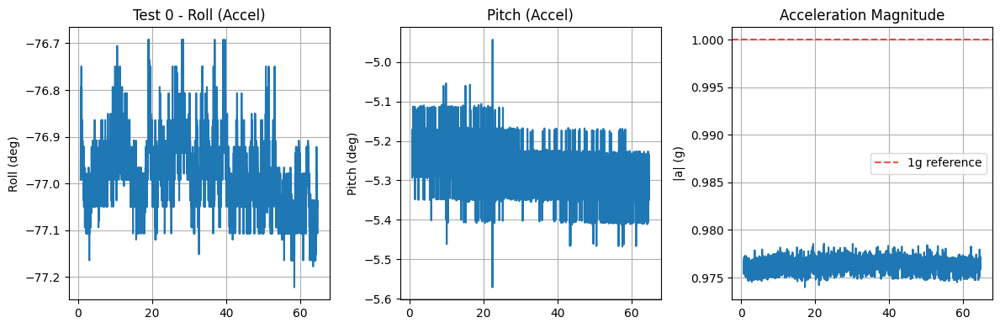

Test 0 - Accel attitude stats:
  Roll: -76.98 ± 0.08 deg
  Pitch: -5.27 ± 0.06 deg


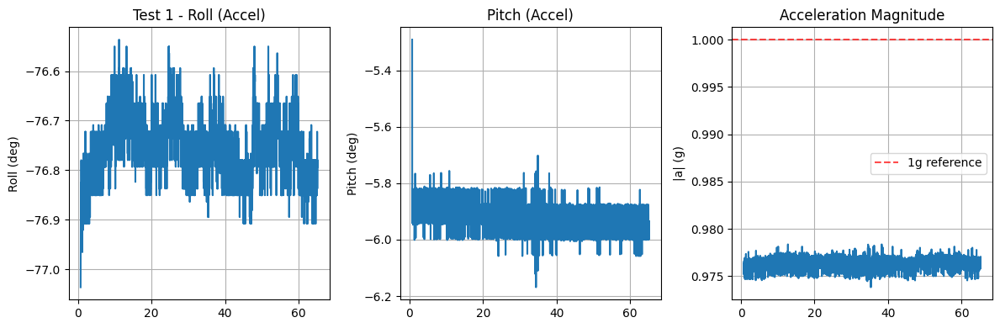

Test 1 - Accel attitude stats:
  Roll: -76.76 ± 0.06 deg
  Pitch: -5.92 ± 0.05 deg


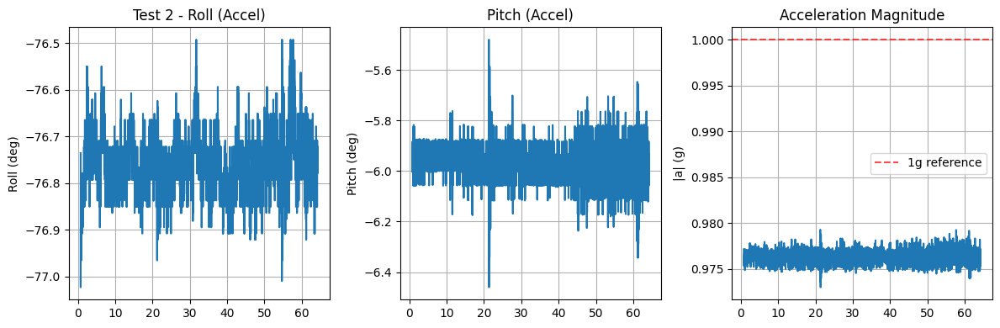

Test 2 - Accel attitude stats:
  Roll: -76.76 ± 0.06 deg
  Pitch: -5.97 ± 0.07 deg


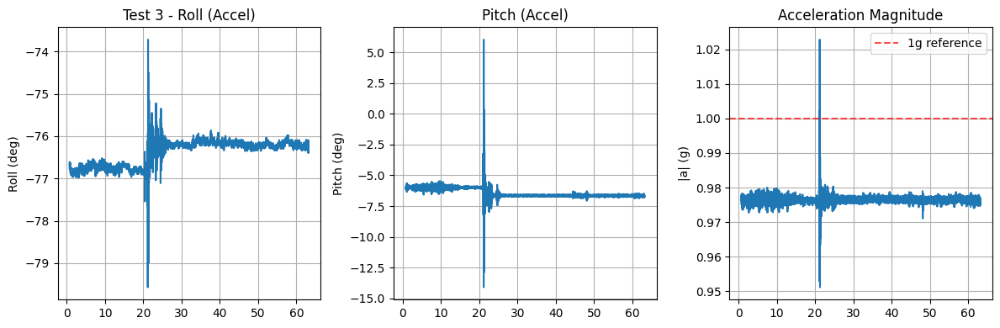

Test 3 - Accel attitude stats:
  Roll: -76.38 ± 0.31 deg
  Pitch: -6.43 ± 0.43 deg


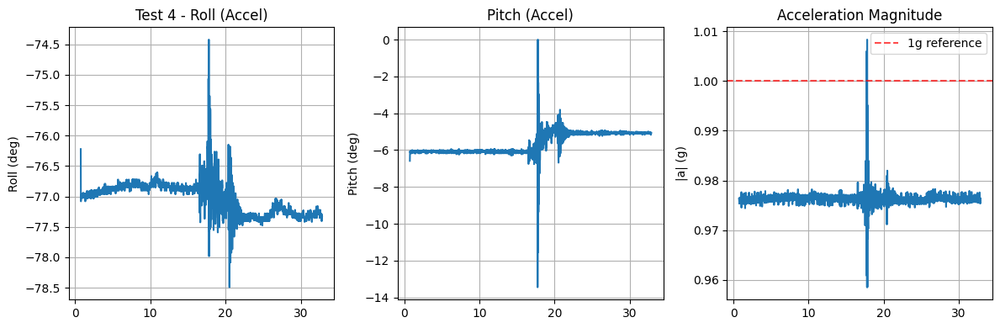

Test 4 - Accel attitude stats:
  Roll: -77.03 ± 0.27 deg
  Pitch: -5.62 ± 0.59 deg


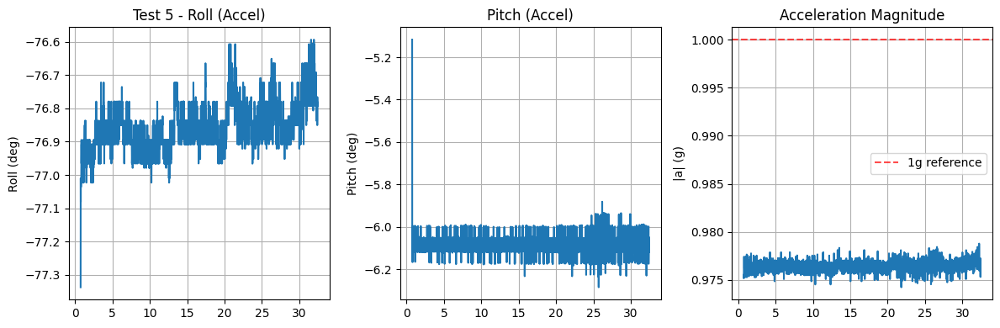

Test 5 - Accel attitude stats:
  Roll: -76.85 ± 0.07 deg
  Pitch: -6.08 ± 0.05 deg


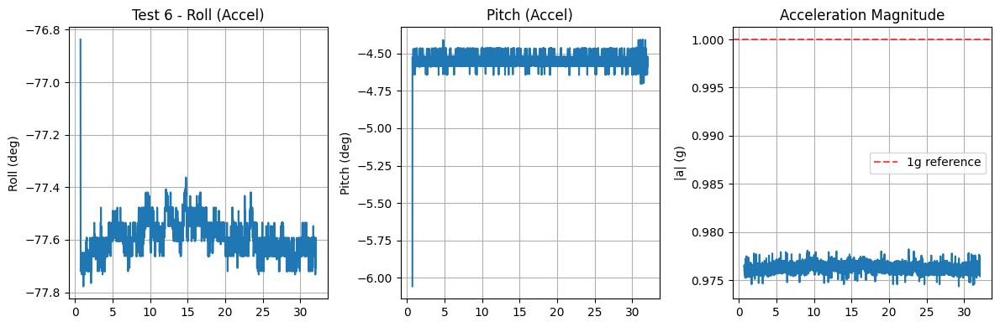

Test 6 - Accel attitude stats:
  Roll: -77.59 ± 0.06 deg
  Pitch: -4.54 ± 0.05 deg


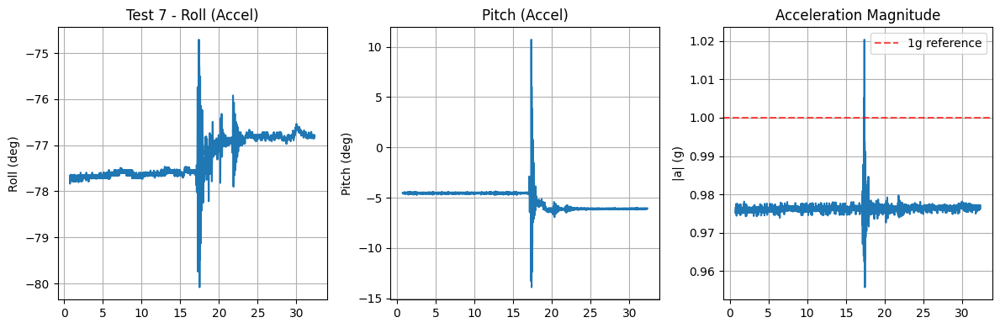

Test 7 - Accel attitude stats:
  Roll: -77.28 ± 0.44 deg
  Pitch: -5.25 ± 0.95 deg


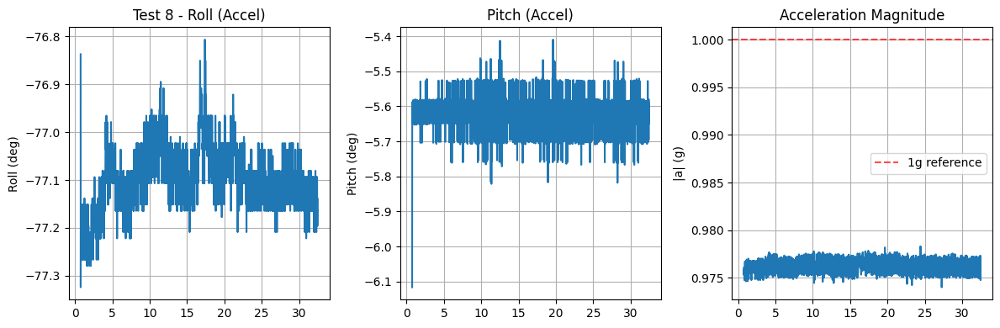

Test 8 - Accel attitude stats:
  Roll: -77.10 ± 0.06 deg
  Pitch: -5.62 ± 0.05 deg


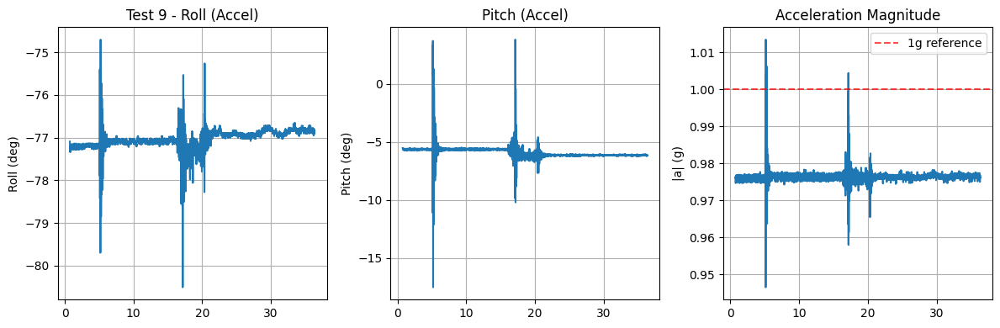

Test 9 - Accel attitude stats:
  Roll: -77.04 ± 0.26 deg
  Pitch: -5.91 ± 0.64 deg


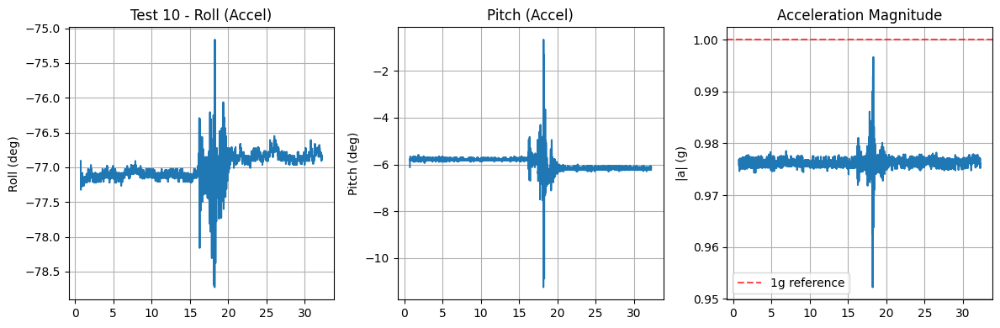

Test 10 - Accel attitude stats:
  Roll: -77.00 ± 0.22 deg
  Pitch: -5.95 ± 0.34 deg


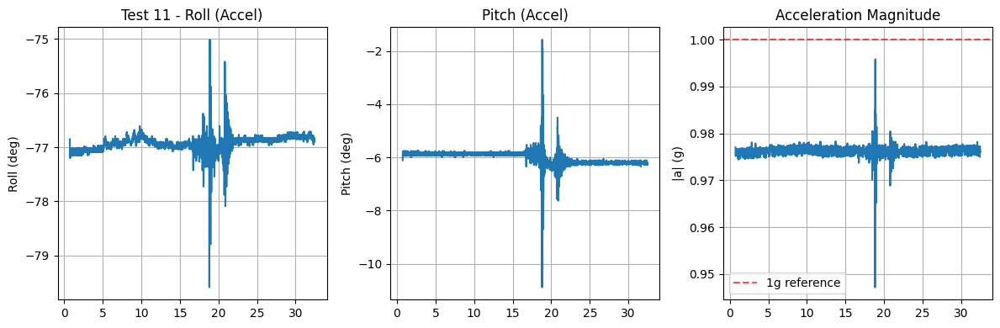

Test 11 - Accel attitude stats:
  Roll: -76.93 ± 0.18 deg
  Pitch: -6.02 ± 0.30 deg


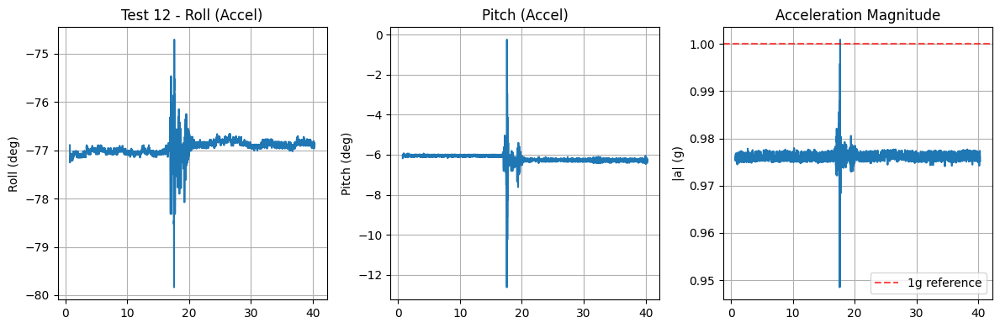

Test 12 - Accel attitude stats:
  Roll: -76.95 ± 0.19 deg
  Pitch: -6.18 ± 0.24 deg

Calculating attitudes for segments in raw_data_output_altitude.csv...


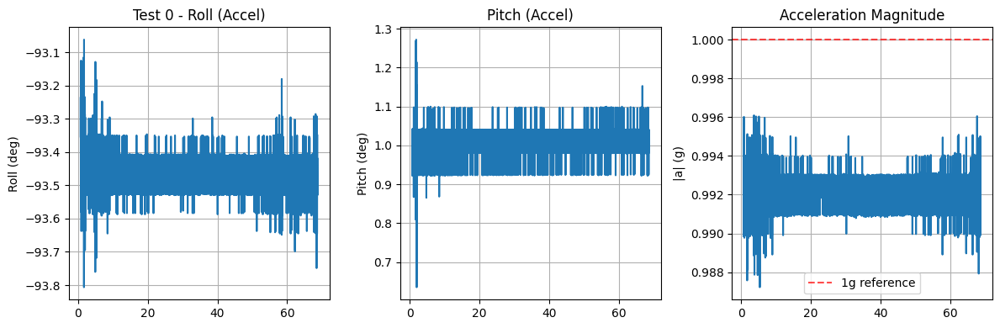

Test 0 - Accel attitude stats:
  Roll: -93.47 ± 0.05 deg
  Pitch: 1.00 ± 0.04 deg


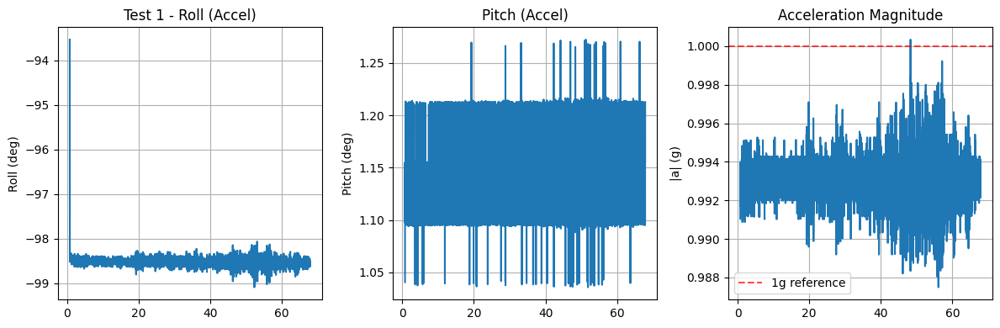

Test 1 - Accel attitude stats:
  Roll: -98.52 ± 0.10 deg
  Pitch: 1.15 ± 0.04 deg


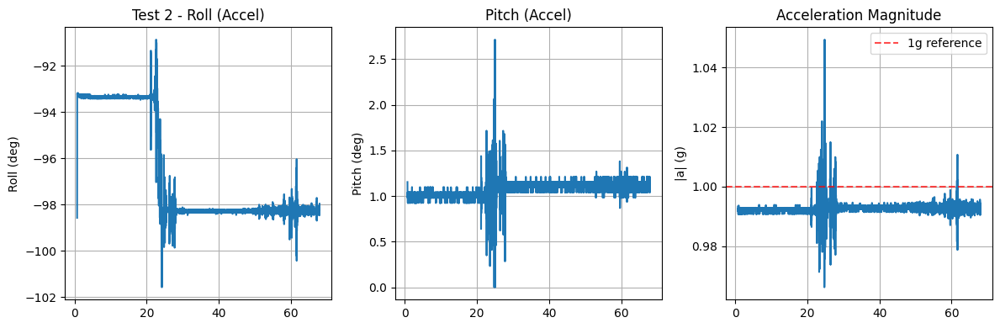

Test 2 - Accel attitude stats:
  Roll: -96.63 ± 2.34 deg
  Pitch: 1.08 ± 0.10 deg


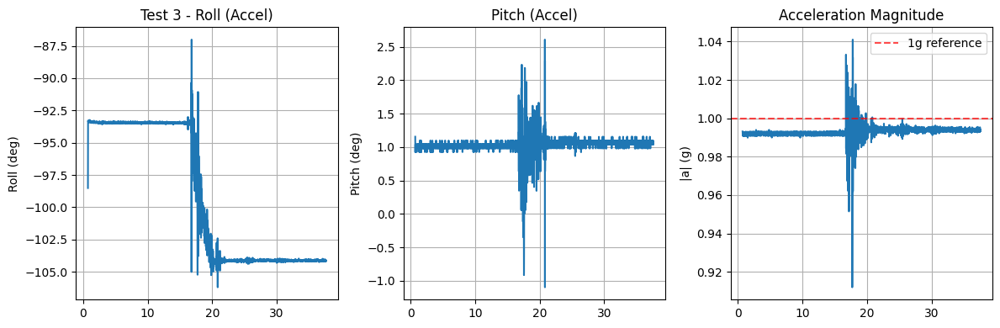

Test 3 - Accel attitude stats:
  Roll: -99.10 ± 5.20 deg
  Pitch: 1.03 ± 0.15 deg


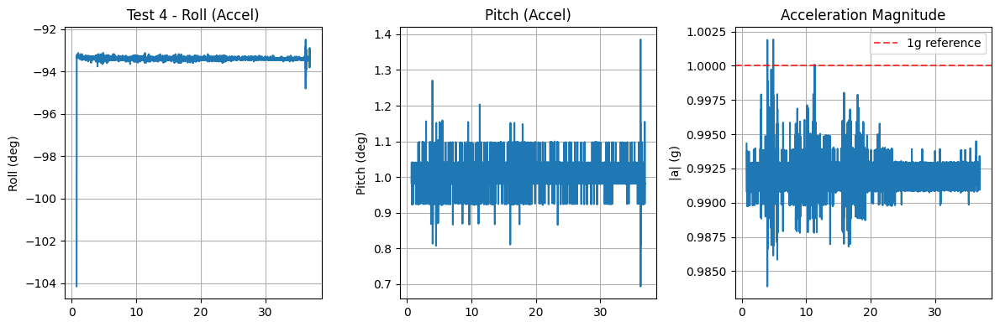

Test 4 - Accel attitude stats:
  Roll: -93.39 ± 0.19 deg
  Pitch: 1.01 ± 0.04 deg


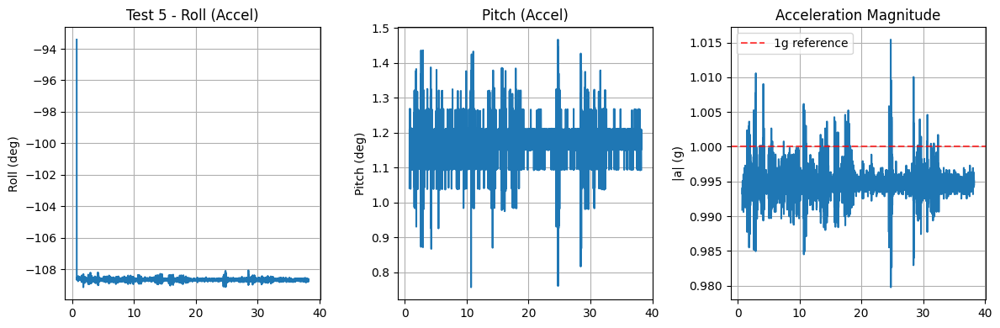

Test 5 - Accel attitude stats:
  Roll: -108.66 ± 0.26 deg
  Pitch: 1.17 ± 0.06 deg


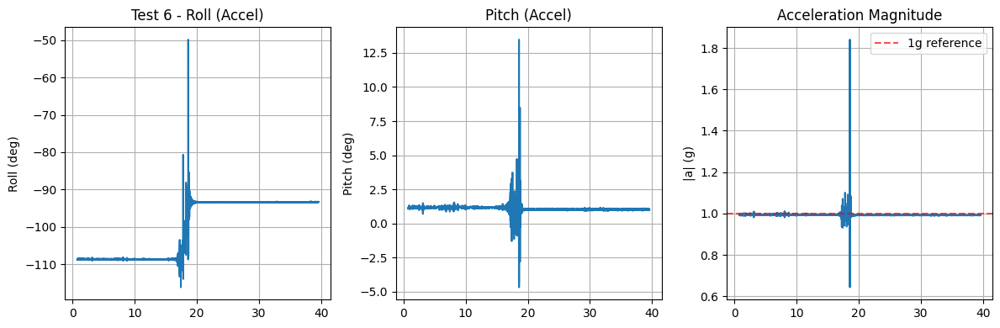

Test 6 - Accel attitude stats:
  Roll: -100.22 ± 7.60 deg
  Pitch: 1.08 ± 0.35 deg


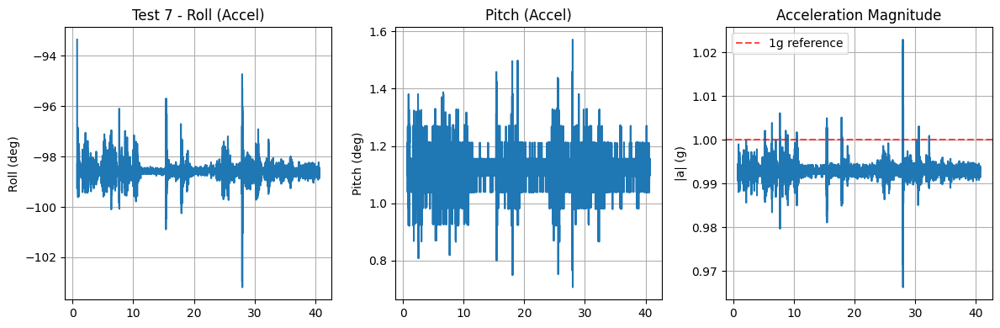

Test 7 - Accel attitude stats:
  Roll: -98.58 ± 0.35 deg
  Pitch: 1.12 ± 0.07 deg


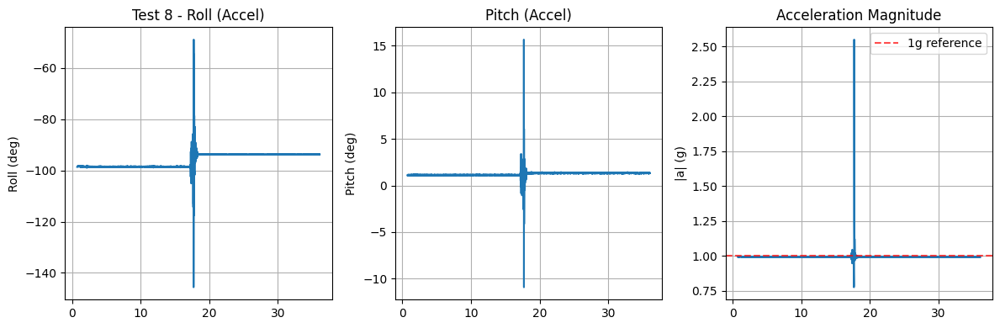

Test 8 - Accel attitude stats:
  Roll: -96.08 ± 2.96 deg
  Pitch: 1.23 ± 0.39 deg


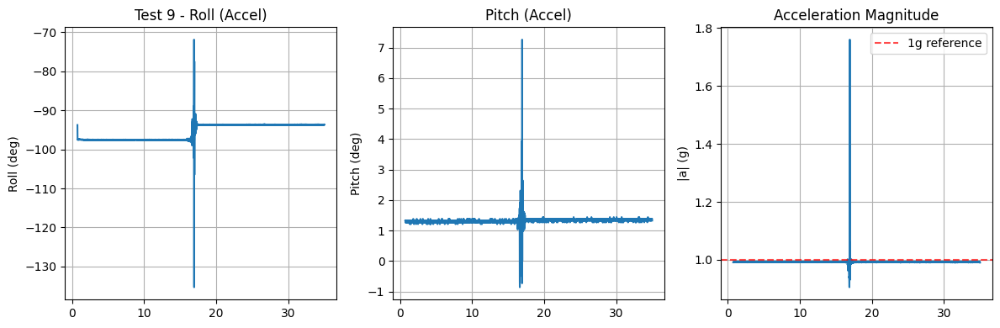

Test 9 - Accel attitude stats:
  Roll: -95.52 ± 2.13 deg
  Pitch: 1.32 ± 0.16 deg


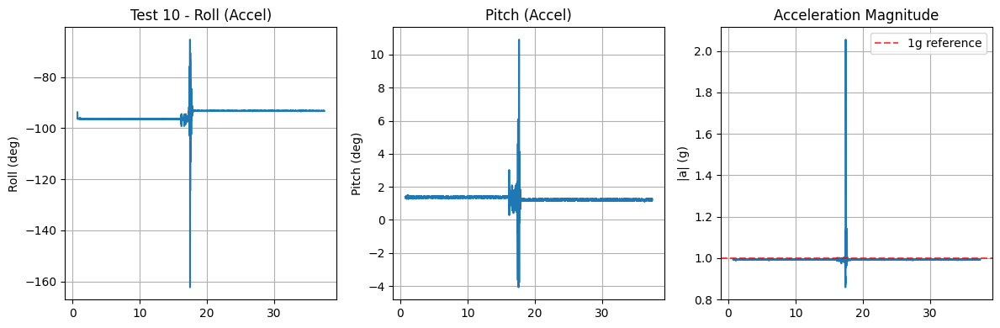

Test 10 - Accel attitude stats:
  Roll: -94.65 ± 2.19 deg
  Pitch: 1.28 ± 0.31 deg


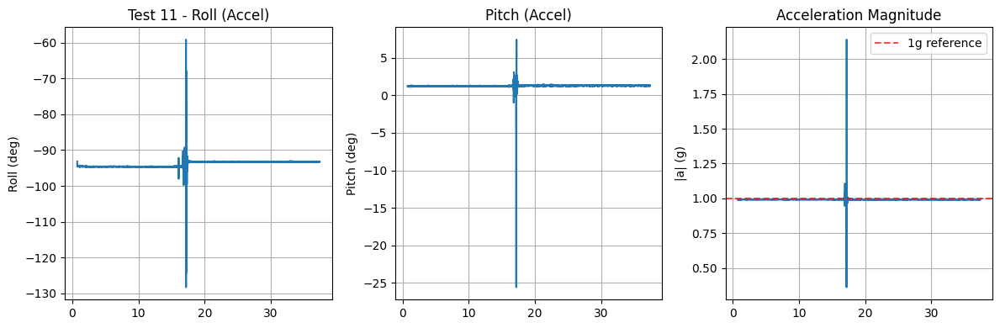

Test 11 - Accel attitude stats:
  Roll: -93.88 ± 1.31 deg
  Pitch: 1.25 ± 0.49 deg


In [ ]:
def accel_to_attitude(accel_g: np.ndarray) -> np.ndarray:
    """Calculate roll and pitch from accelerometer data
        Using consistent coordinate system: East(X), Down(Y), North(Z)

    Args:
        accel_g: Nx3 array of accelerometer data in g [ax, ay, az]

    Returns:
        Nx3 array of [roll, pitch, yaw] in degrees (yaw=0)
        Note: roll=phi (azimuth), pitch=theta (altitude) in this context

    """
    ax, ay, az = accel_g[:, 0], accel_g[:, 1], accel_g[:, 2]
    
    # Roll (phi/azimuth) and pitch (theta/altitude) from accelerometer
    # Consistent with MultiAngleDetector.calculate_horizontal_angles()
    roll = np.arctan2(ax, az)  # Azimuth around vertical axis
    pitch = np.arctan2(-ay, np.sqrt(ax**2 + az**2))  # Altitude/elevation
    yaw = np.zeros_like(roll)  # Cannot determine from accelerometer alone
    
    return np.column_stack([np.degrees(roll), np.degrees(pitch), np.degrees(yaw)])

for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    print(f"\nCalculating attitudes for segments in {file_path}...")
    # Calculate accelerometer-based attitudes for all segments
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        attitude_accel = accel_to_attitude(analysis['accel_g'])
        
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 3, 1)
        plt.plot(segment['data']['timestamp'], attitude_accel[:, 0])
        plt.title(f'Test {segment["test_id"]} - Roll (Accel)')
        plt.ylabel('Roll (deg)')
        plt.grid(True)
        
        plt.subplot(1, 3, 2)
        plt.plot(segment['data']['timestamp'], attitude_accel[:, 1])
        plt.title('Pitch (Accel)')
        plt.ylabel('Pitch (deg)')
        plt.grid(True)
        
        plt.subplot(1, 3, 3)
        plt.plot(segment['data']['timestamp'], analysis['accel_mag'])
        plt.axhline(1.0, color='r', linestyle='--', alpha=0.7, label='1g reference')
        plt.title('Acceleration Magnitude')
        plt.ylabel('|a| (g)')
        plt.legend()
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()
        
        print(f"Test {segment['test_id']} - Accel attitude stats:")
        print(f"  Roll: {np.mean(attitude_accel[:, 0]):.2f} ± {np.std(attitude_accel[:, 0]):.2f} deg")
        print(f"  Pitch: {np.mean(attitude_accel[:, 1]):.2f} ± {np.std(attitude_accel[:, 1]):.2f} deg")


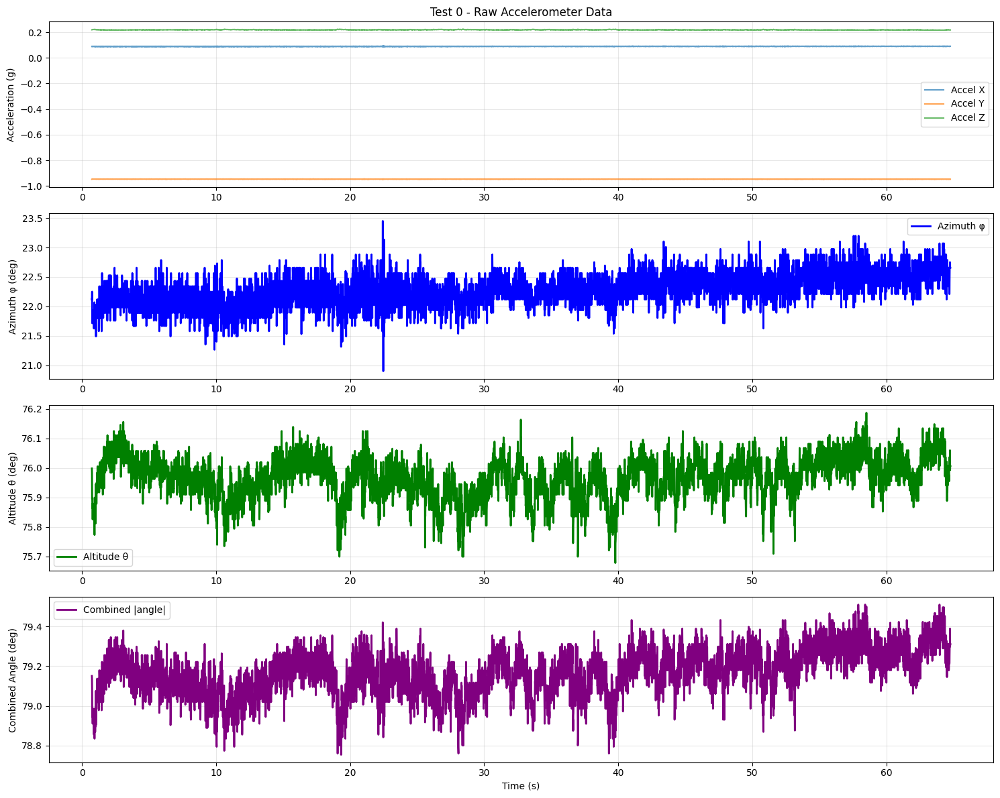


No significant angle changes detected in Test 0


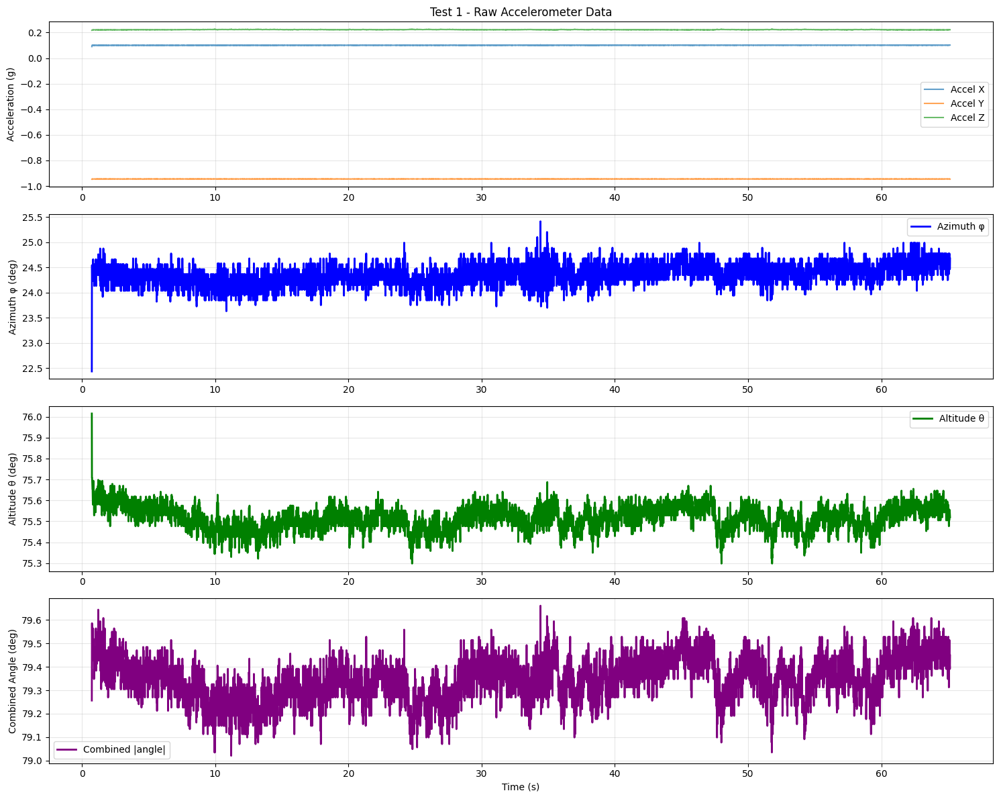


No significant angle changes detected in Test 1


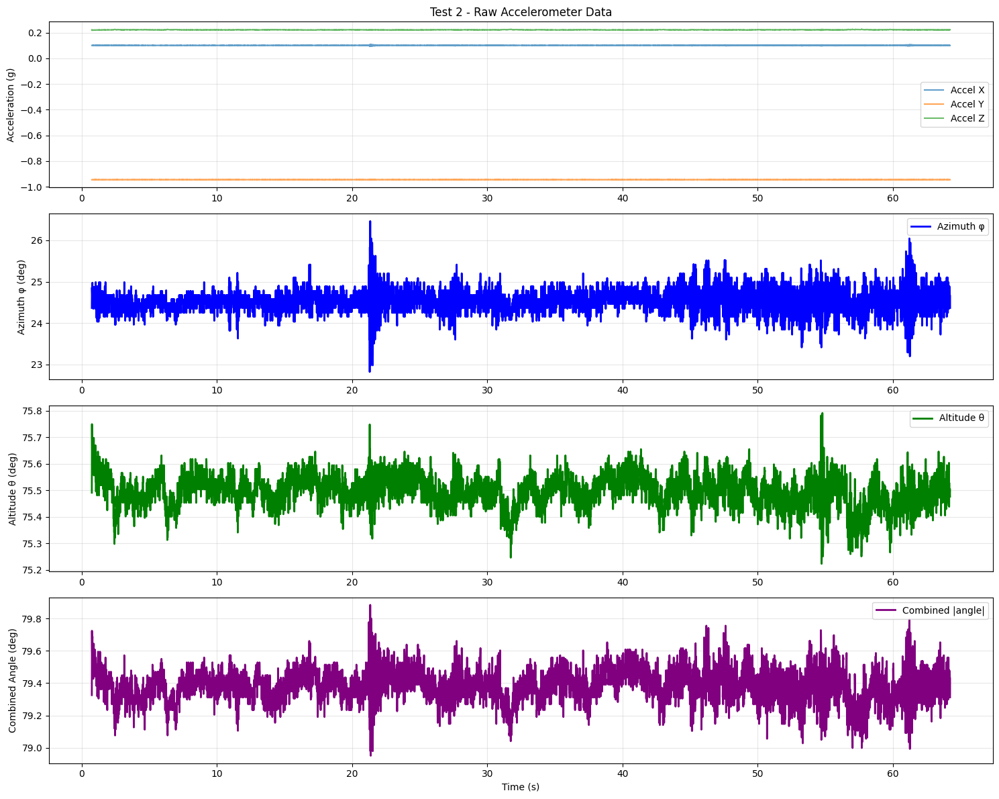


No significant angle changes detected in Test 2


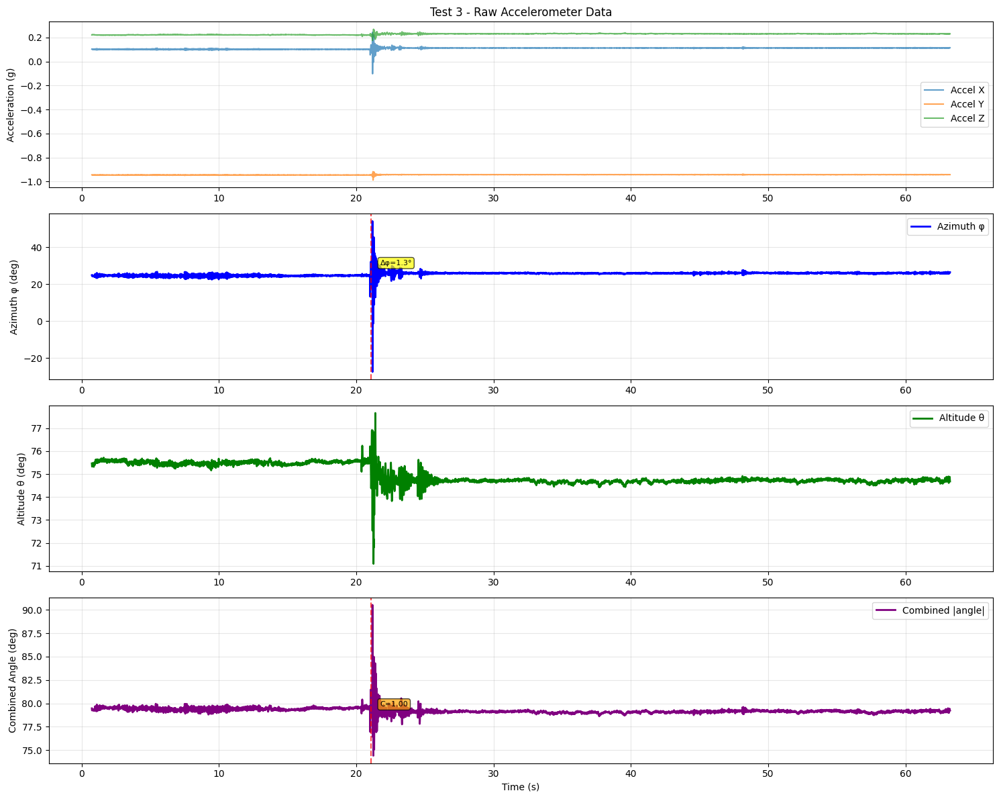


--- Detected Events for Test 3 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
21.1     azimuth    1.3        -0.8       1.000       


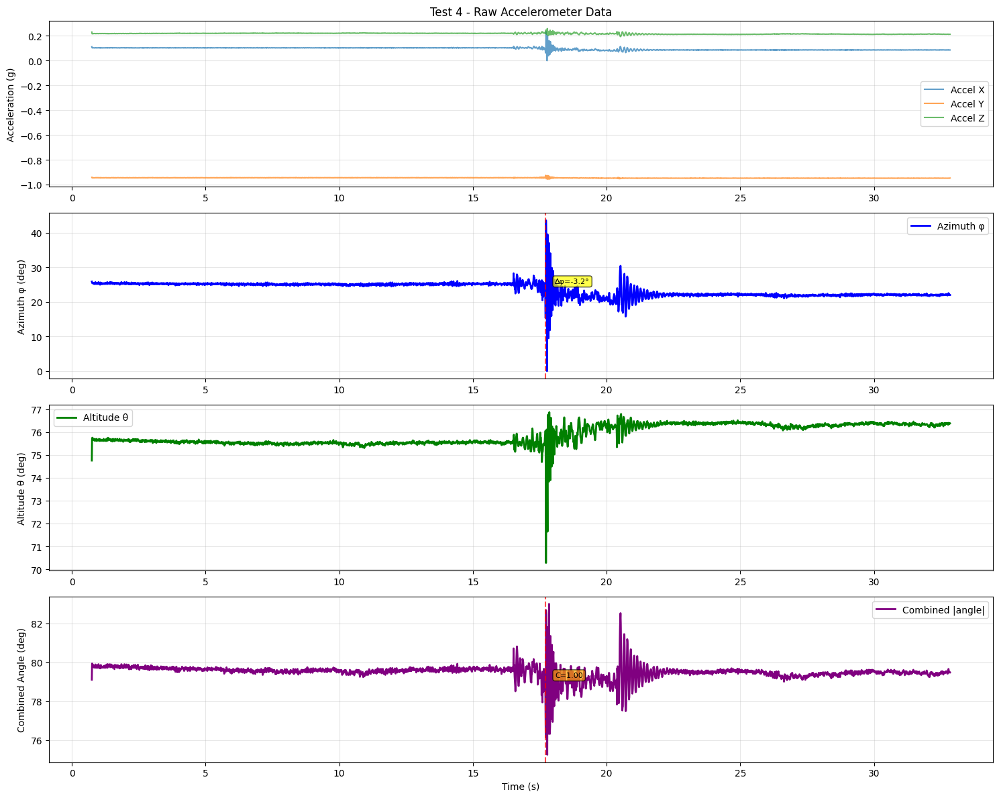


--- Detected Events for Test 4 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.7     azimuth    -3.2       0.8        1.000       


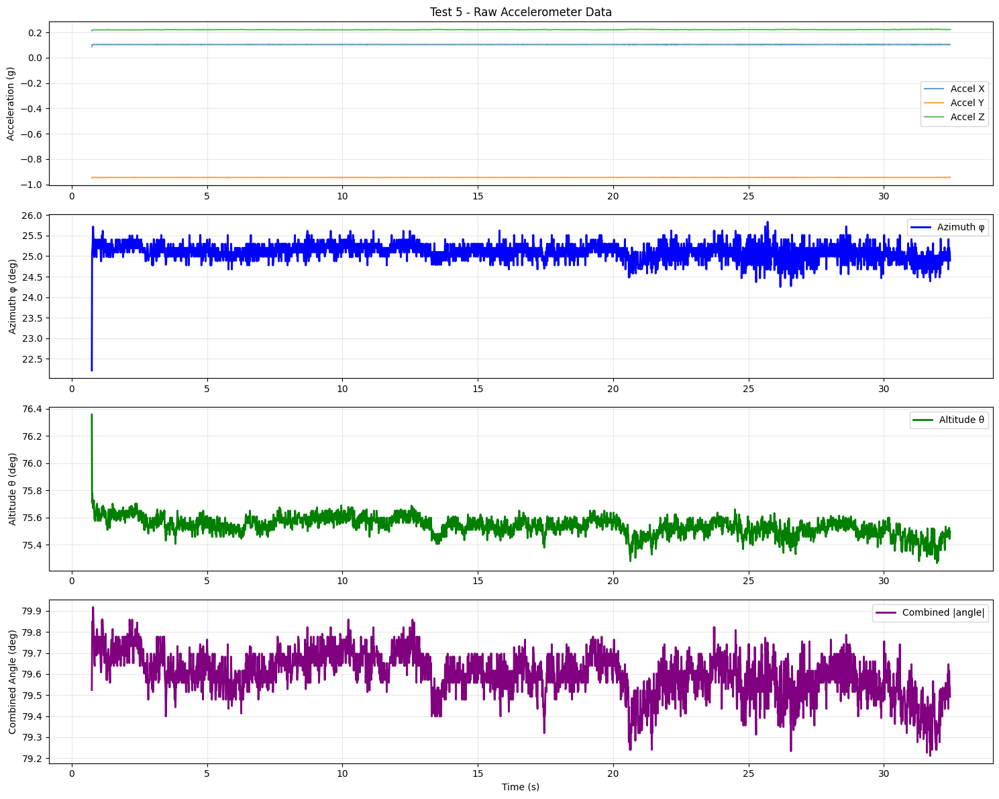


No significant angle changes detected in Test 5


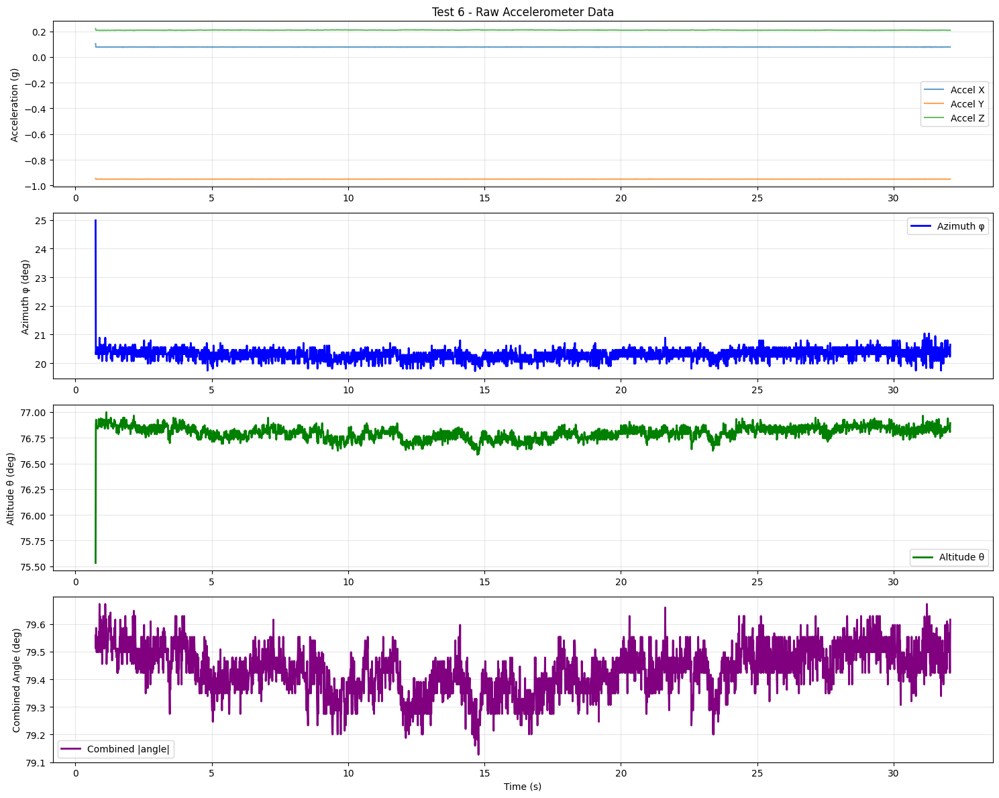


No significant angle changes detected in Test 6


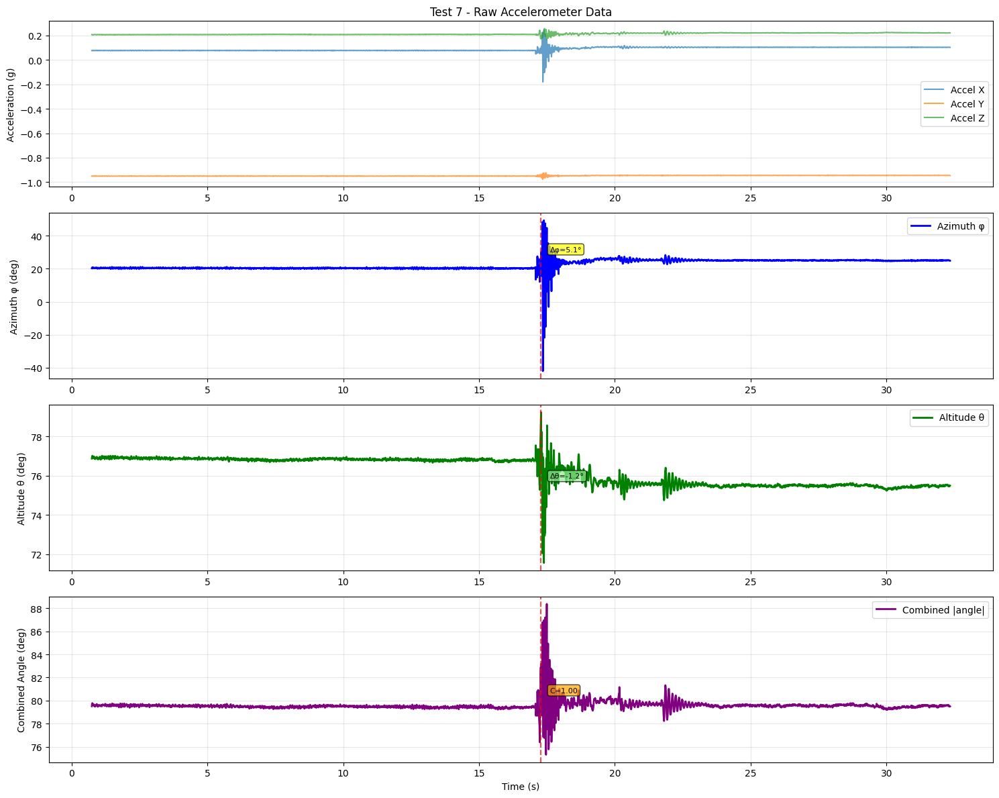


--- Detected Events for Test 7 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.3     combined   5.1        -1.2       1.000       


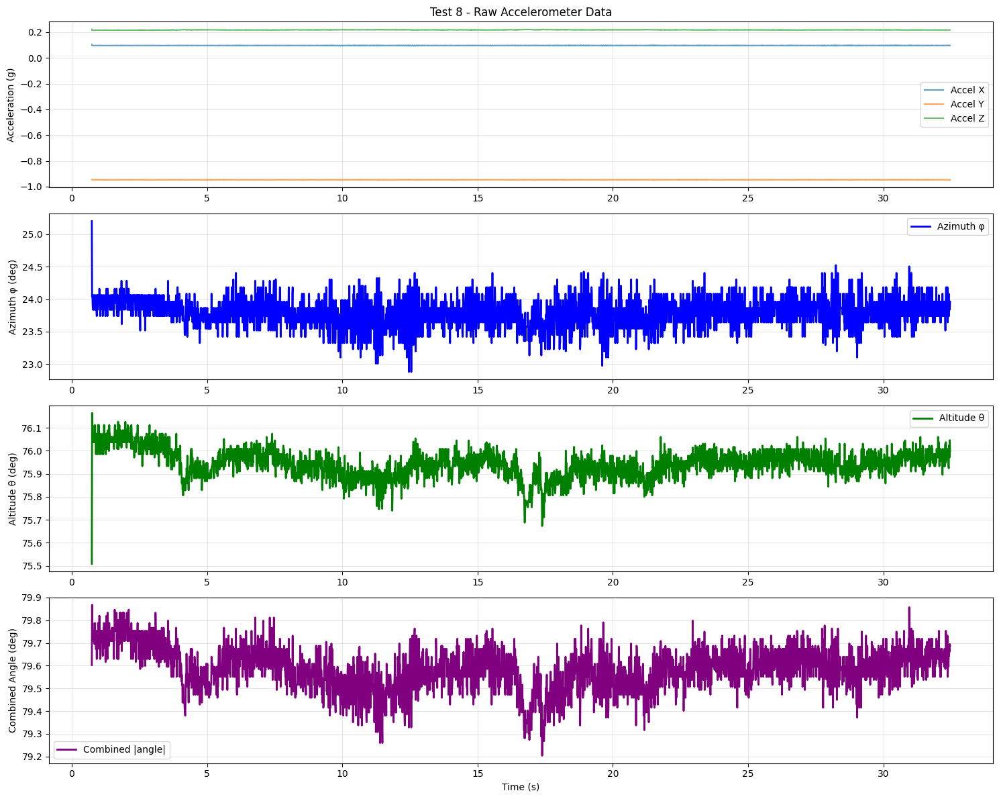


No significant angle changes detected in Test 8


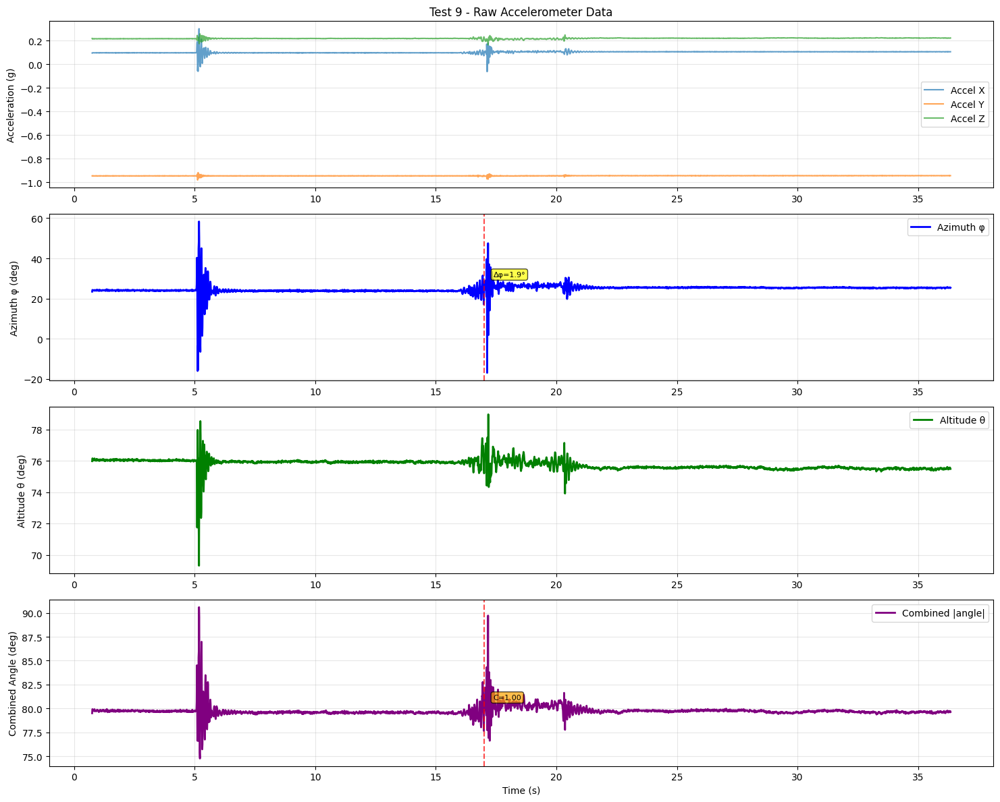


--- Detected Events for Test 9 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.0     azimuth    1.9        -0.3       1.000       


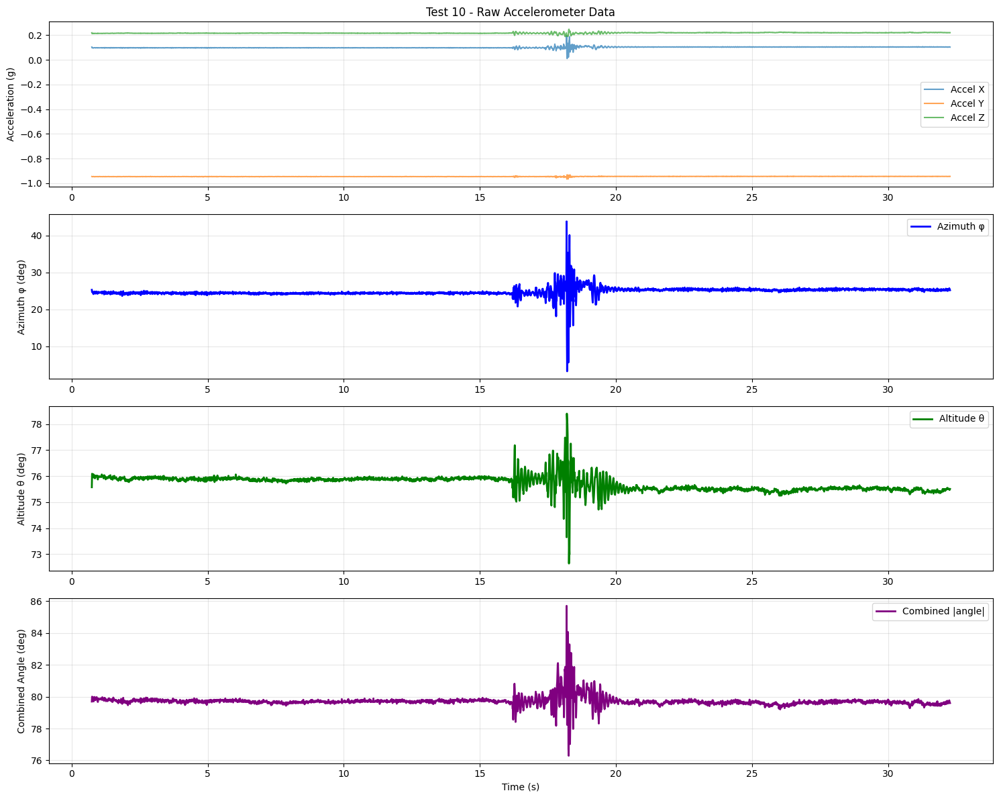


No significant angle changes detected in Test 10


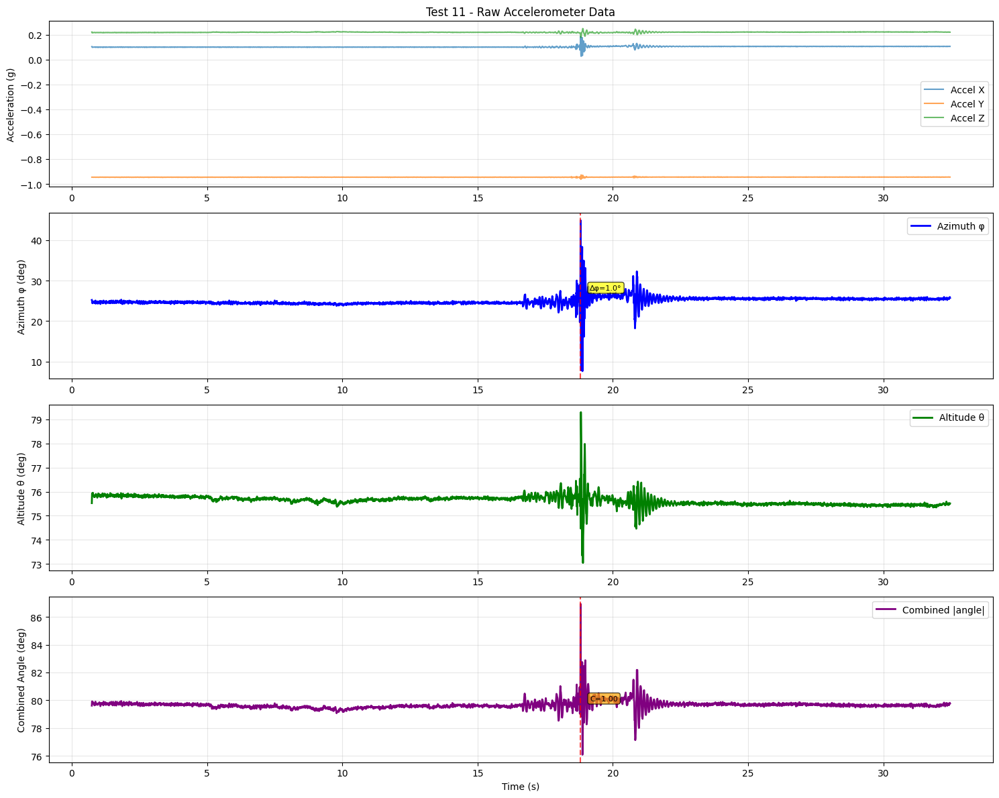


--- Detected Events for Test 11 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
18.8     azimuth    1.0        -0.2       1.000       


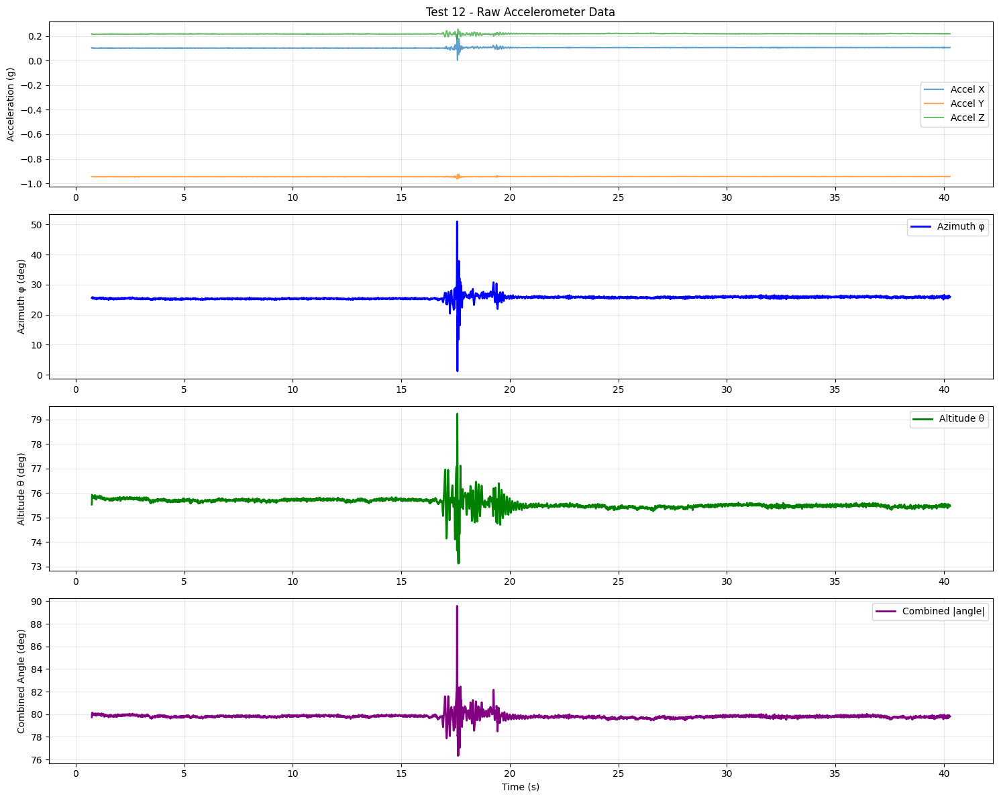


No significant angle changes detected in Test 12


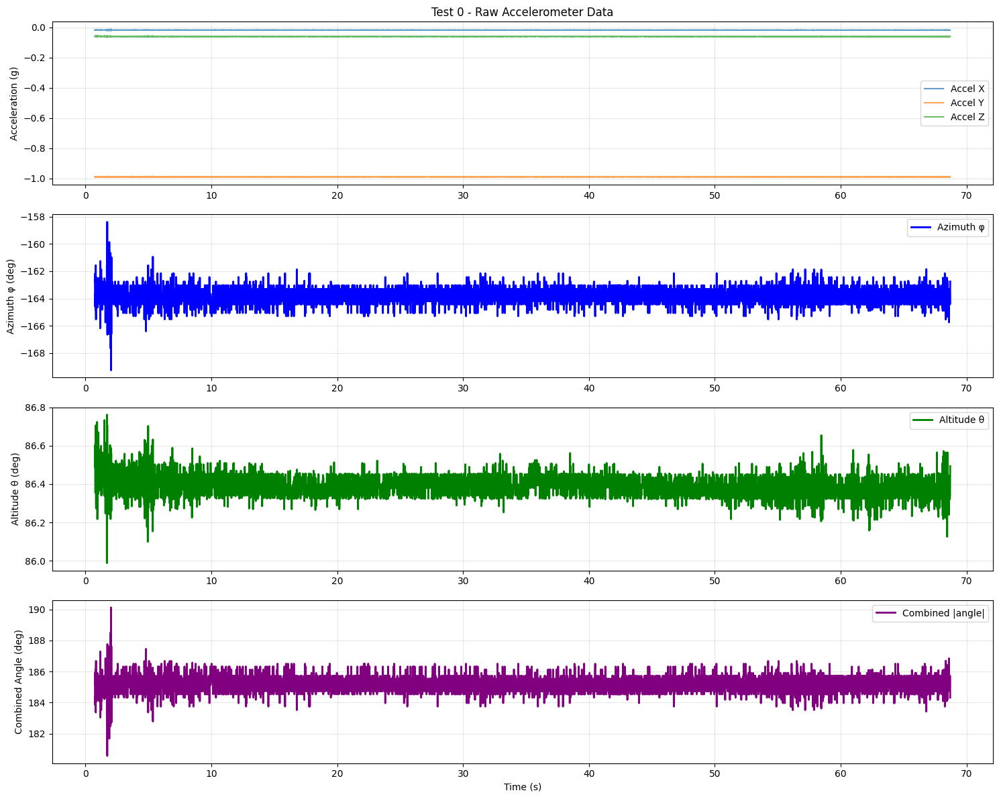


No significant angle changes detected in Test 0


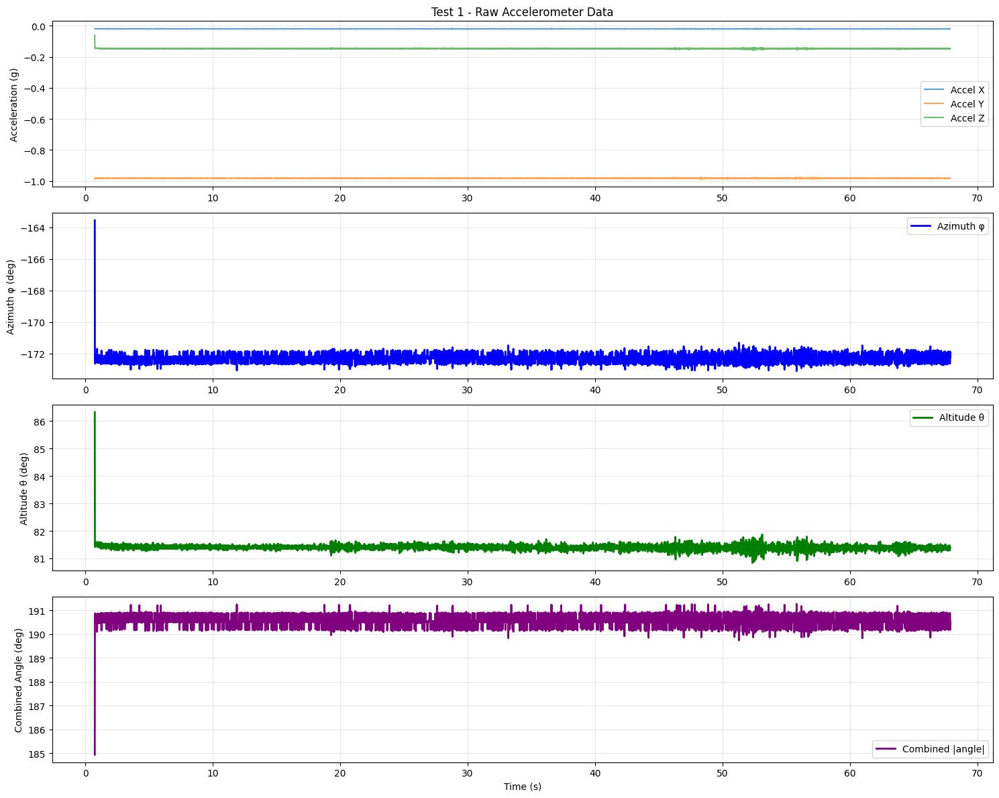


No significant angle changes detected in Test 1


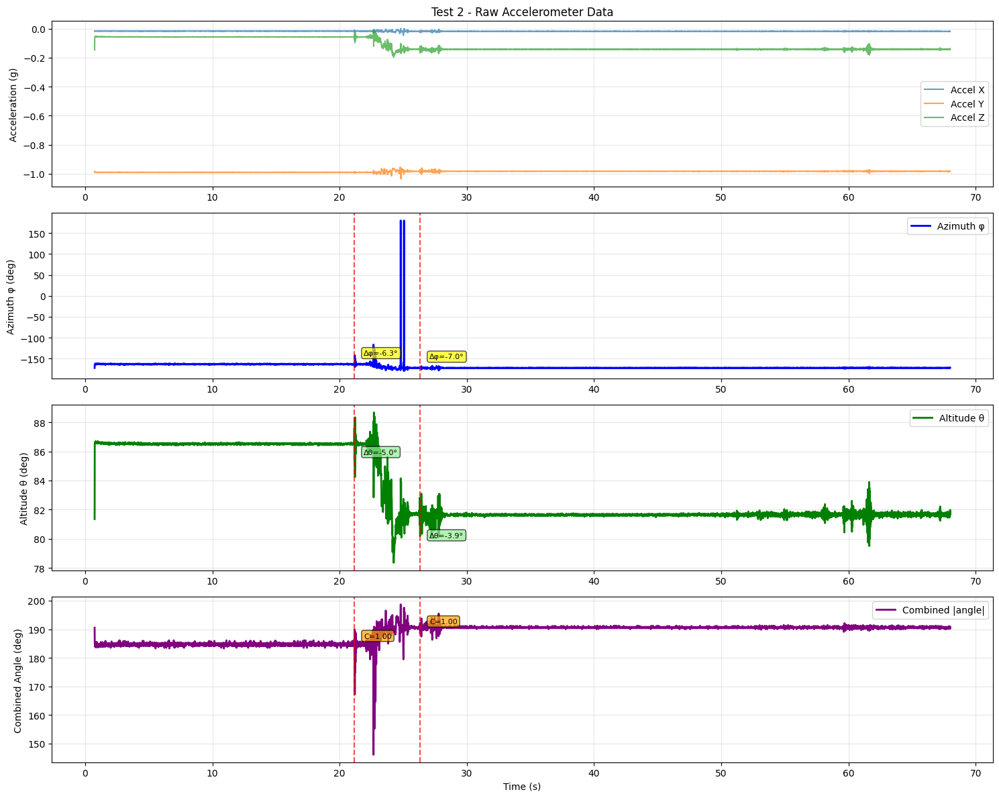


--- Detected Events for Test 2 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
21.2     combined   -6.3       -5.0       0.999       
26.3     combined   -7.0       -3.9       1.000       


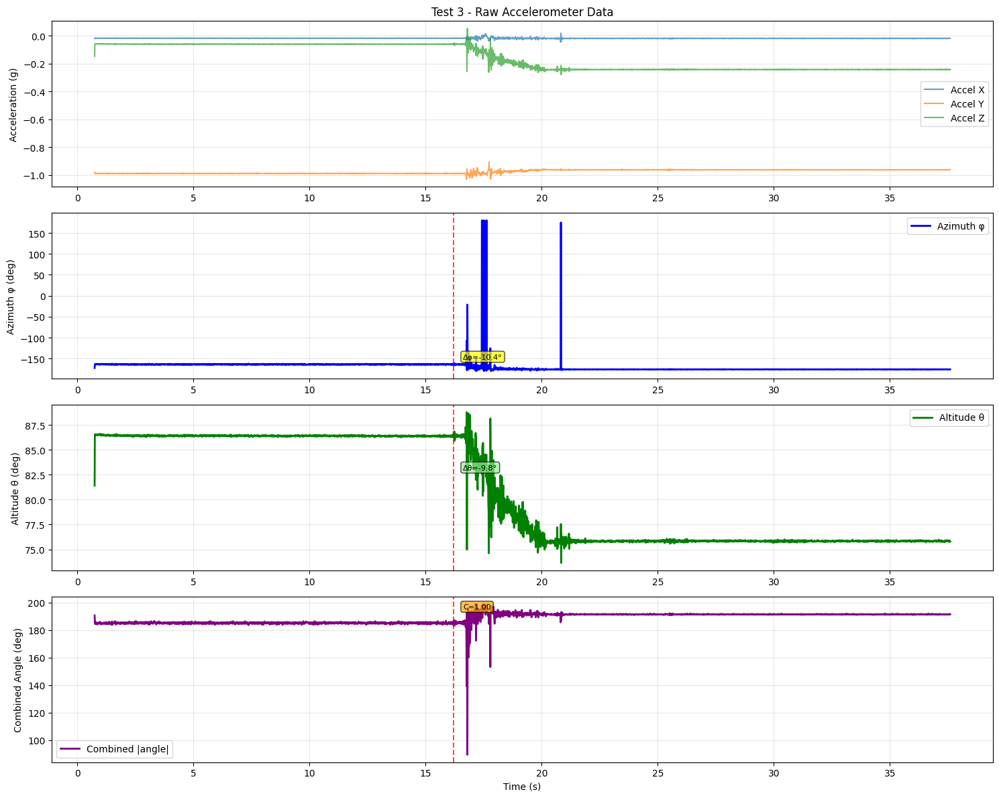


--- Detected Events for Test 3 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.2     combined   -10.4      -9.8       1.000       


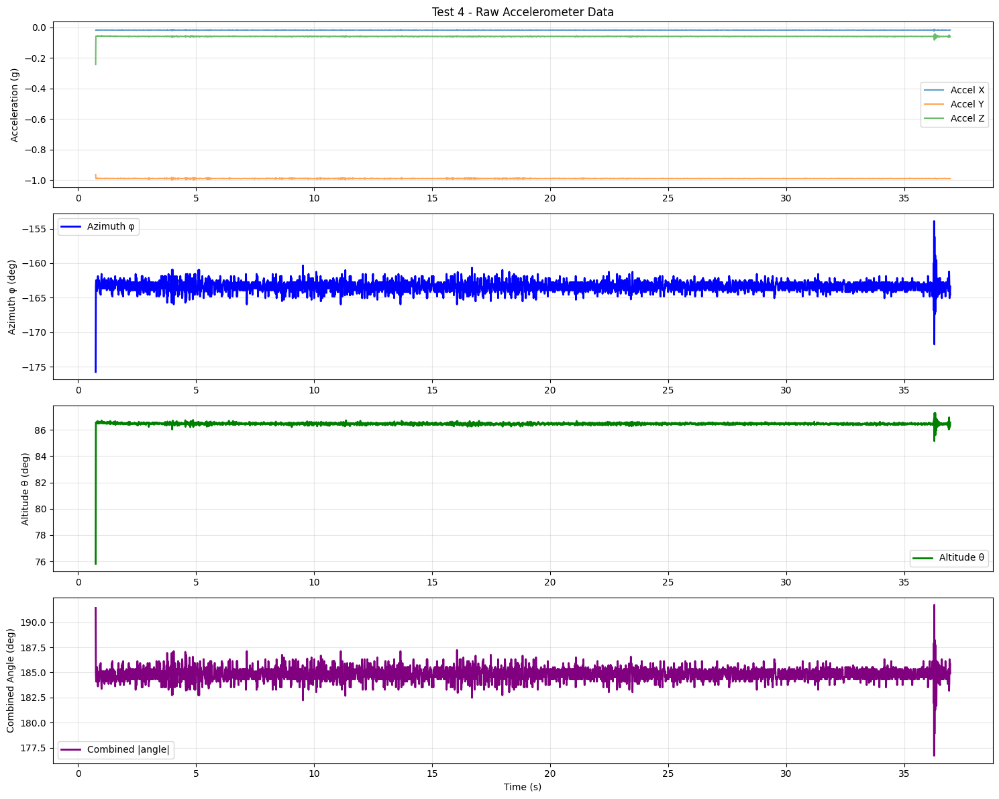


No significant angle changes detected in Test 4


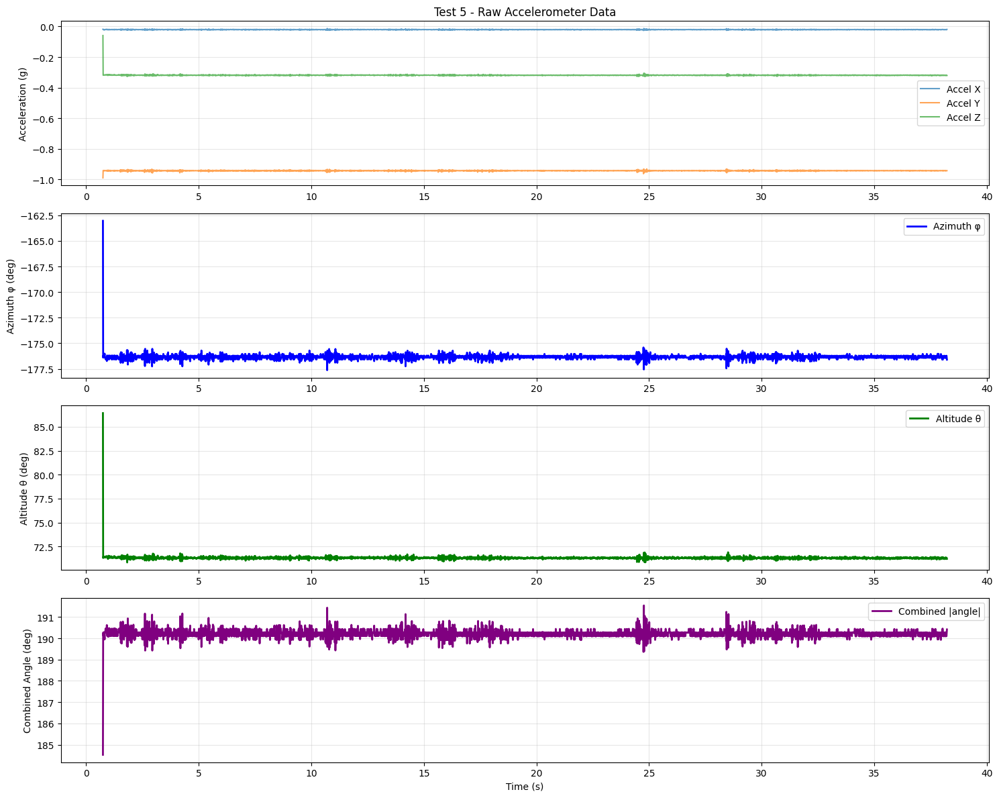


No significant angle changes detected in Test 5


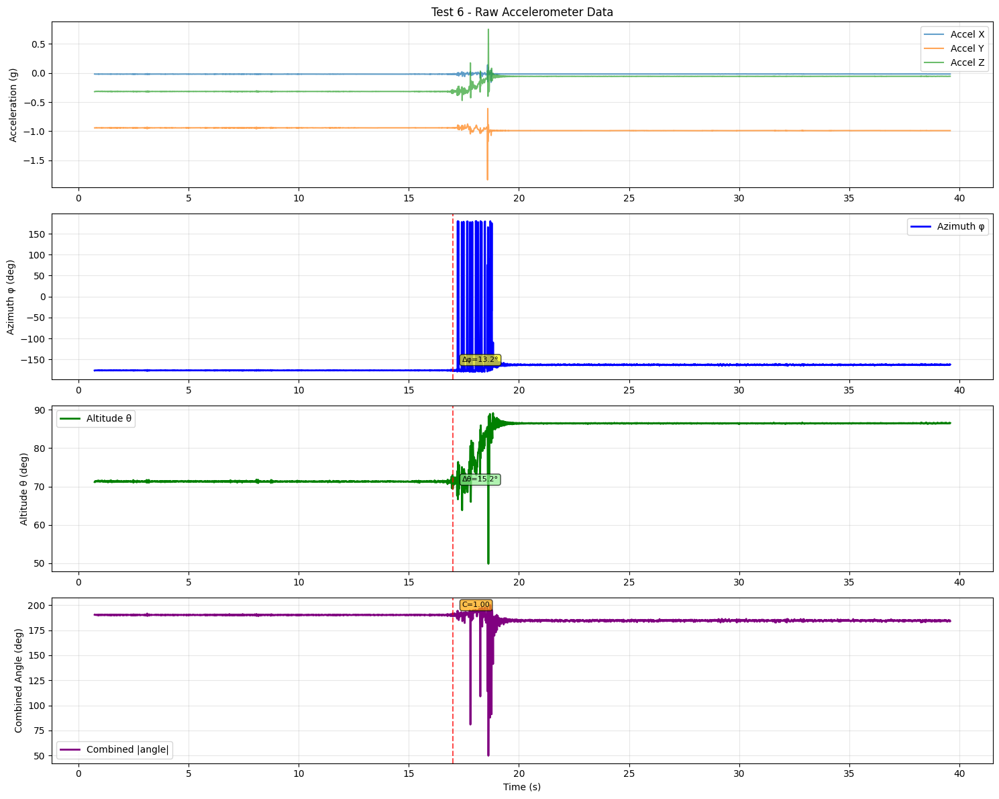


--- Detected Events for Test 6 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.0     combined   13.2       15.2       1.000       


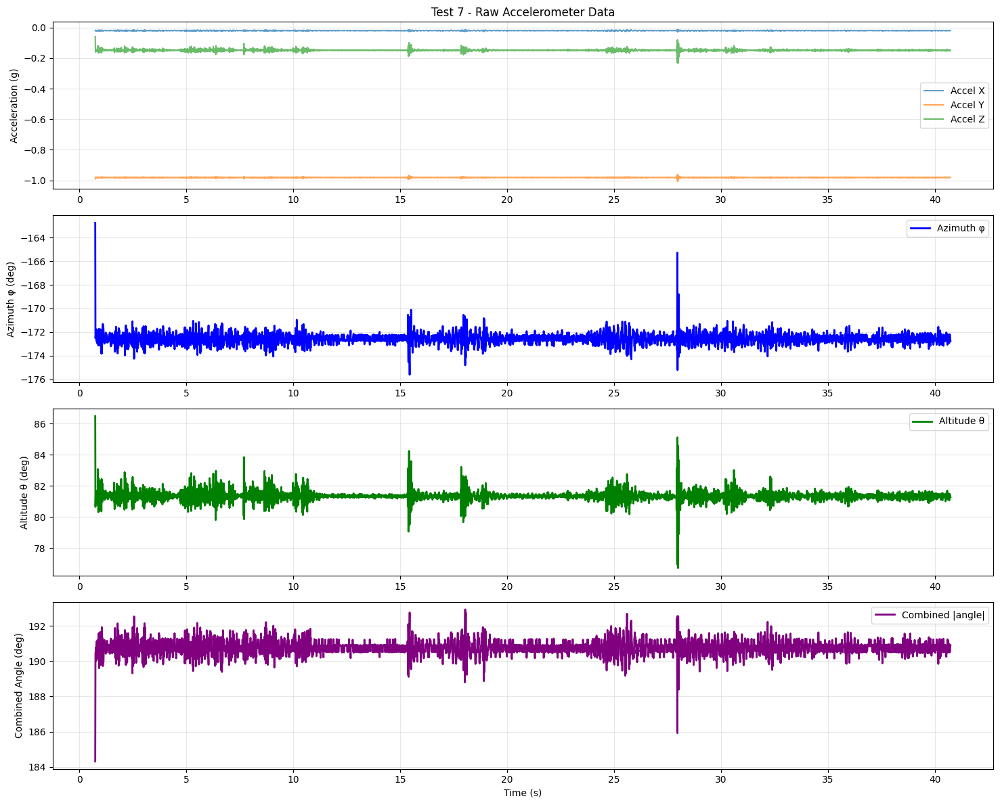


No significant angle changes detected in Test 7


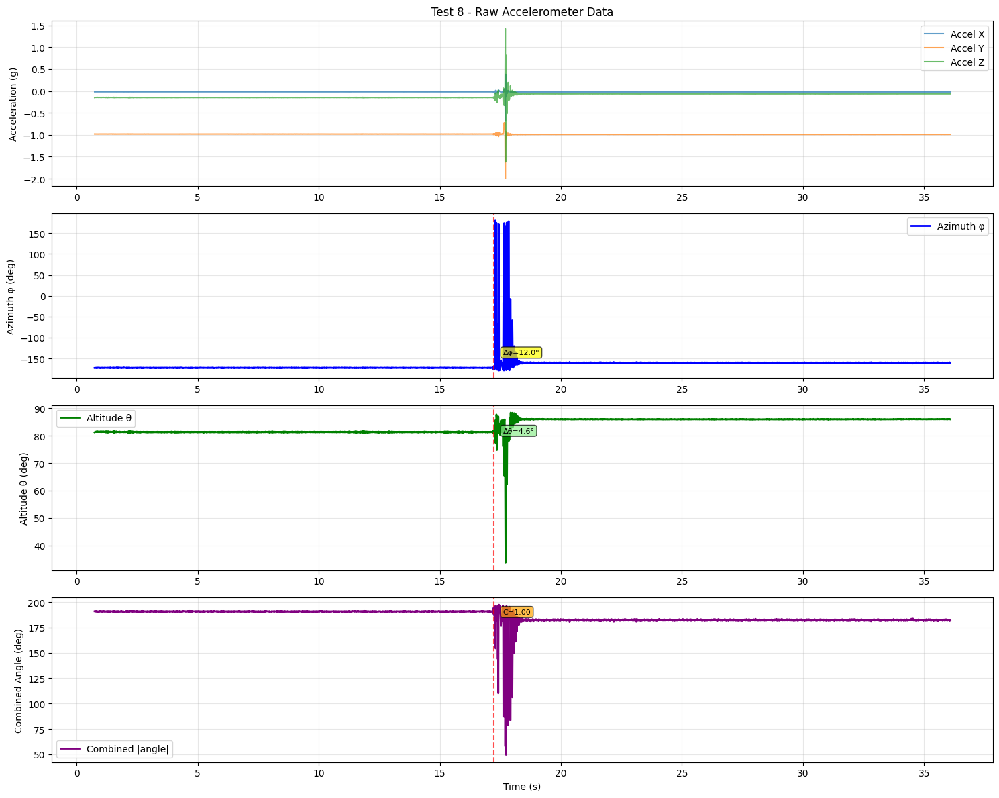


--- Detected Events for Test 8 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.2     combined   12.0       4.6        1.000       


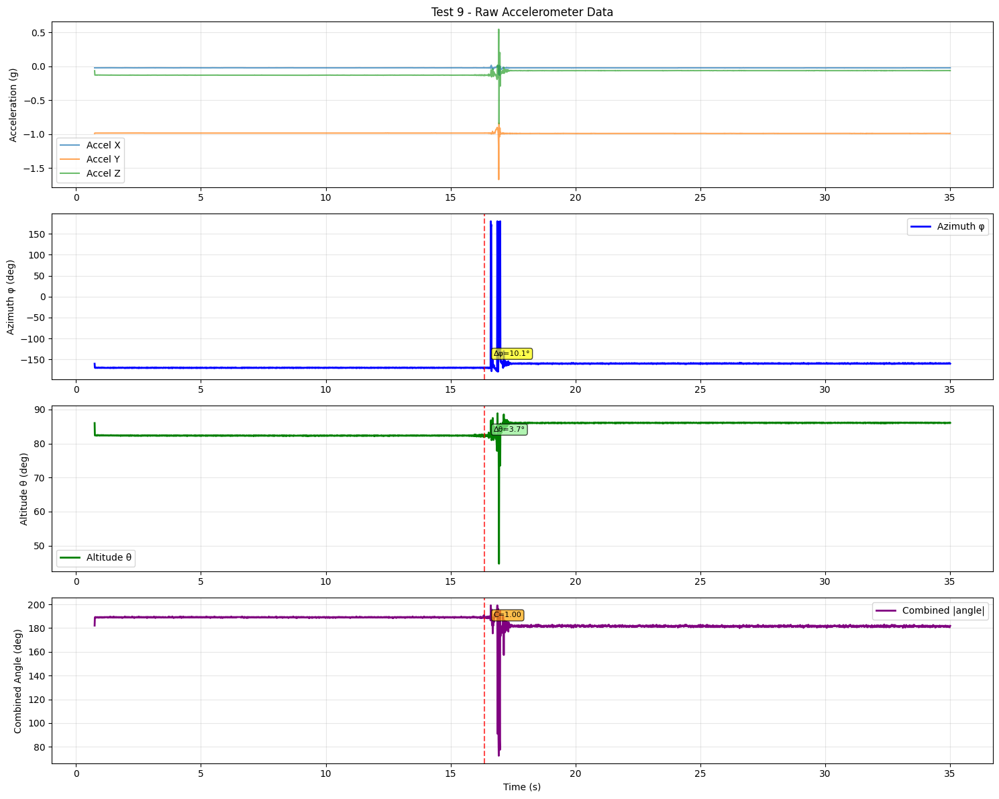


--- Detected Events for Test 9 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.3     combined   10.1       3.7        1.000       


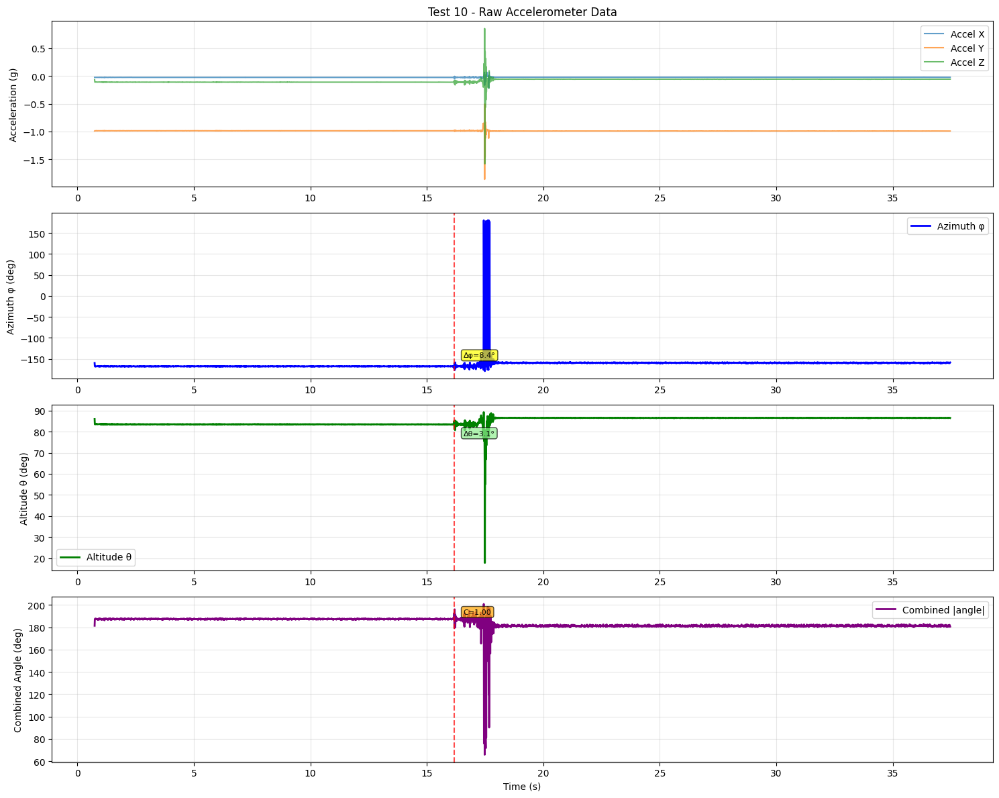


--- Detected Events for Test 10 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.2     combined   8.4        3.1        1.000       


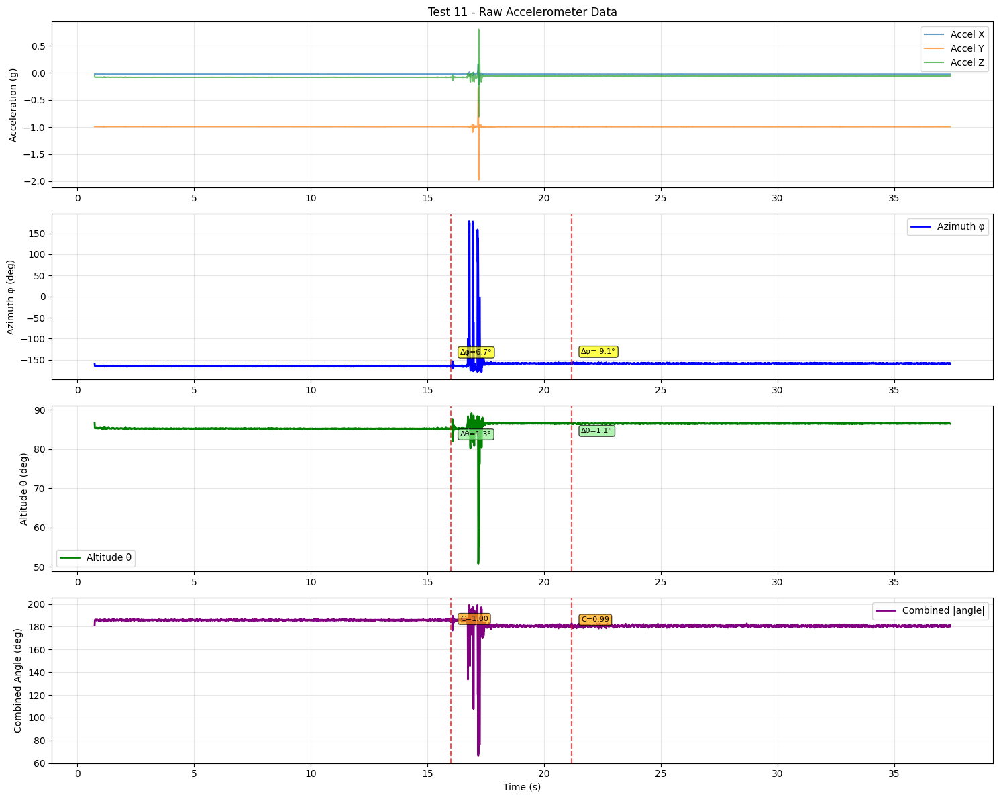


--- Detected Events for Test 11 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.0     combined   6.7        1.3        1.000       
21.2     combined   -9.1       1.1        0.992       


In [24]:
def analyze_all_segments_with_multi_angle_detection(segmented_data: dict, 
                                                   sensor_analyses: dict) -> dict:
    """
    Replace the existing power_off_correlations approach with general multi-angle detection
    """
    detector = MultiAngleDetector(
        window_size=5.0,
        min_change_deg=1.0, 
        confidence_threshold=0.95
    )
    
    all_results = {}
    
    for file_path, segments in segmented_data.items():
        file_results = []
        analyses = sensor_analyses[file_path]
        
        for i, (segment, analysis) in enumerate(zip(segments, analyses)):
            test_id = segment.get('test_id', i)
            timestamps = segment['data']['timestamp'].values
            
            # Detect angle changes in this segment
            events = detector.analyze_test_sequence(analysis['accel_g'], timestamps)
            
            # Visualize results
            visualize_angle_changes(analysis['accel_g'], timestamps, events, str(test_id))
            
            # Compare with expected if configuration exists
            expected_changes = segment.get('config', {}).get('expected_changes', [])
            comparison = compare_with_expected_changes(events, expected_changes)
            
            segment_result = {
                'test_id': test_id,
                'detected_events': events,
                'comparison': comparison,
                'segment_config': segment.get('config', {})
            }
            file_results.append(segment_result)
        
        all_results[file_path] = file_results
    
    return all_results
all_results = analyze_all_segments_with_multi_angle_detection(segmented, test_sensor_analyses)


Summary for raw_data_output_azimuth.csv:
Test 0: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0
Test 1: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0
Test 2: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0
Test 3: Expected=0, Detected=1, Matches=0, False Positives=1, Missed=0
Test 4: Expected=0, Detected=1, Matches=0, False Positives=1, Missed=0
Test 5: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0
Test 6: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0
Test 7: Expected=0, Detected=1, Matches=0, False Positives=1, Missed=0
Test 8: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0
Test 9: Expected=0, Detected=1, Matches=0, False Positives=1, Missed=0
Test 10: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0
Test 11: Expected=0, Detected=1, Matches=0, False Positives=1, Missed=0
Test 12: Expected=0, Detected=0, Matches=0, False Positives=0, Missed=0

Summary for raw_data_output_alt

C:\Users\mfocka\AppData\Local\Temp\ipykernel_25352\322240129.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + labels)
C:\Users\mfocka\AppData\Local\Temp\ipykernel_25352\322240129.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + labels)


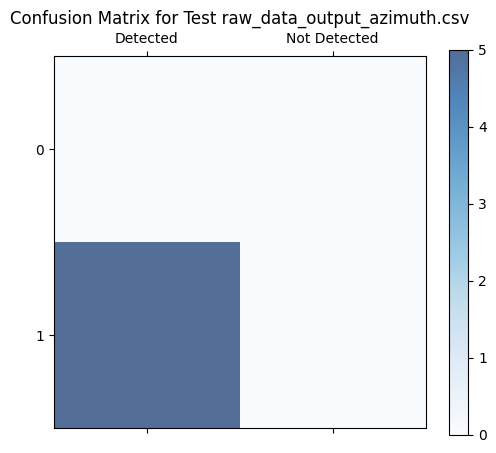

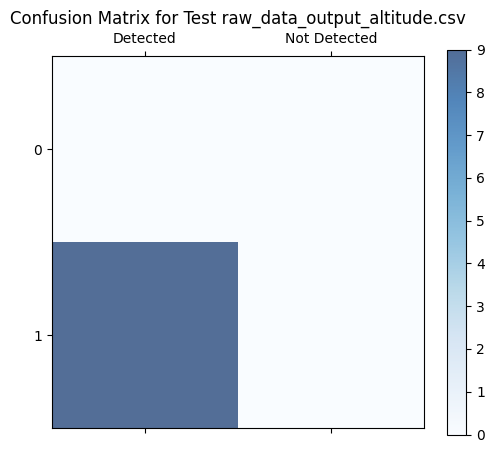

In [ ]:
# TODO: fix the code below - is logically not valid for getting a confusion matrix per file
for file_path, results in all_results.items():
    print(f"\nSummary for {file_path}:")
    total_expected_count = 0
    total_detected_count = 0
    total_false_positives = 0
    total_missed_detections = 0
    total_matches = 0
    for result in results:
        test_id = result['test_id']
        comparison = result['comparison']
        expected_count = comparison['expected_count']
        detected_count = comparison['detected_count']
        matches = len(comparison['matches'])
        false_positives = len(comparison['false_positives'])
        missed_detections = len(comparison['missed_detections'])
        
        print(f"Test {test_id}: Expected={expected_count}, Detected={detected_count}, "
              f"Matches={matches}, False Positives={false_positives}, Missed={missed_detections}")
        total_expected_count += expected_count
        total_detected_count += detected_count
        total_false_positives += false_positives
        total_missed_detections += missed_detections
        total_matches += matches
    # creating confusion matrix plot
    labels = ['Expected', 'Not Expected']
    row_labels = ['Detected', 'Not Detected']
    cm = np.array([[total_matches, total_missed_detections],
                    [total_false_positives, max(0, total_expected_count - total_matches - total_missed_detections)]])
    fig, ax = plt.subplots(figsize=(6, 5))
    cax = ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.7)
    plt.title(f'Confusion Matrix for {file_path}')
    fig.colorbar(cax)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + row_labels)
    ax.set_xlabel('Ground Truth')
    ax.set_ylabel('Predicted')
    plt.show()



=== MULTI-ANGLE CHANGE DETECTION ANALYSIS ===


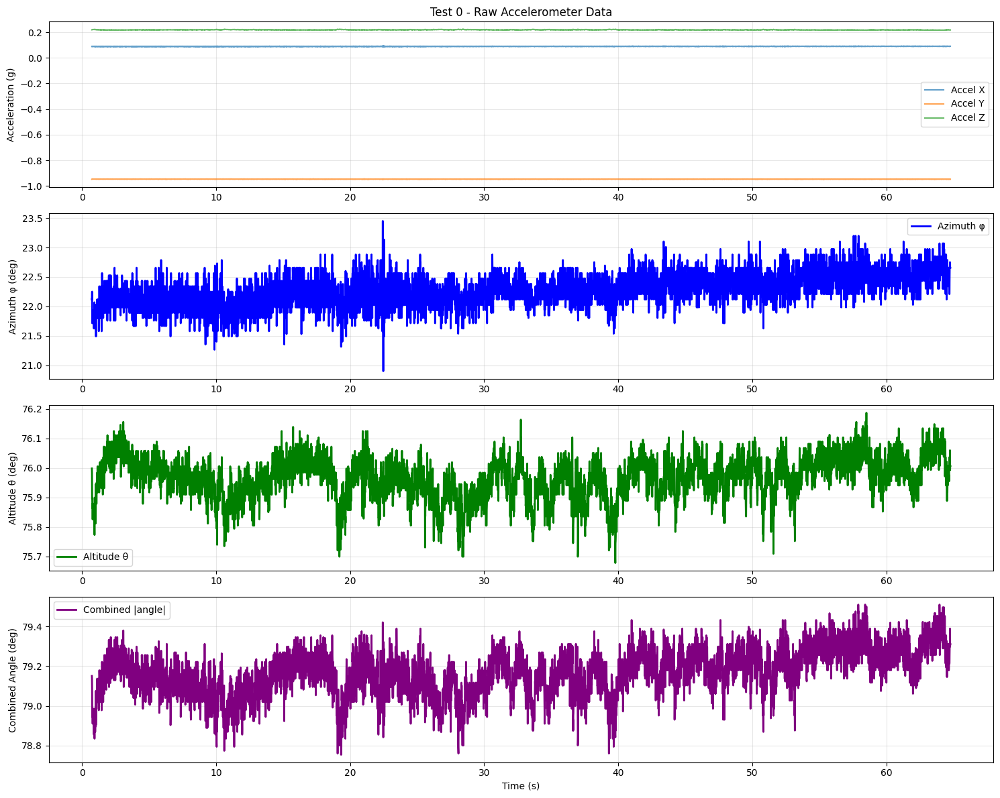


No significant angle changes detected in Test 0


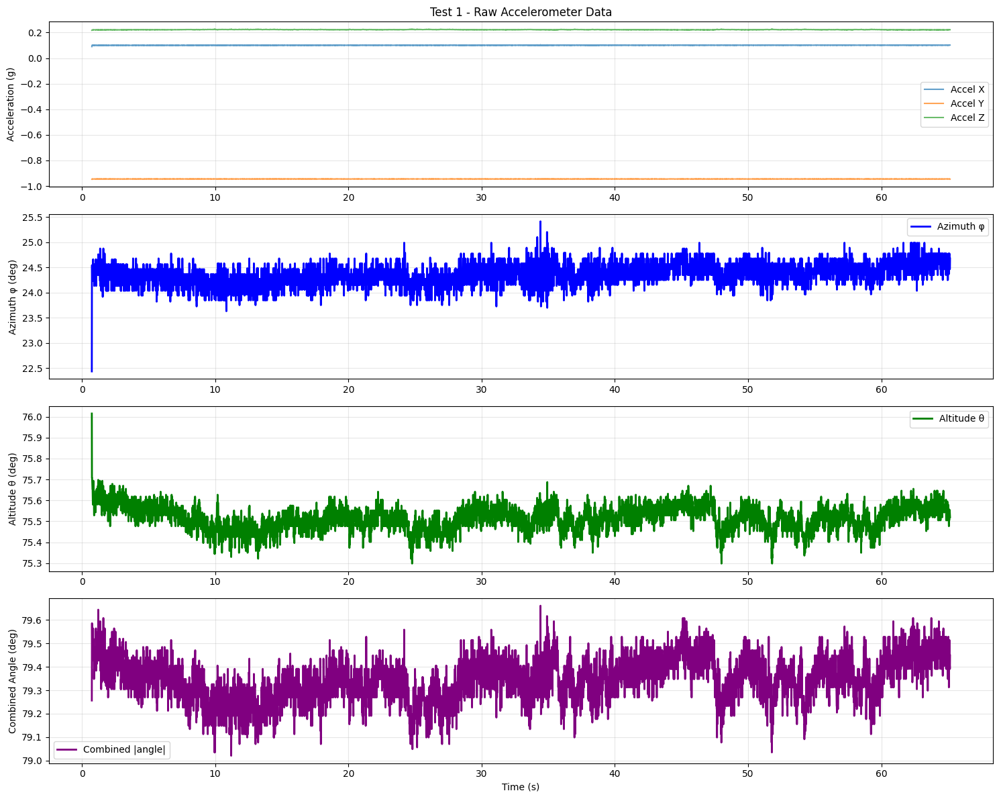


No significant angle changes detected in Test 1


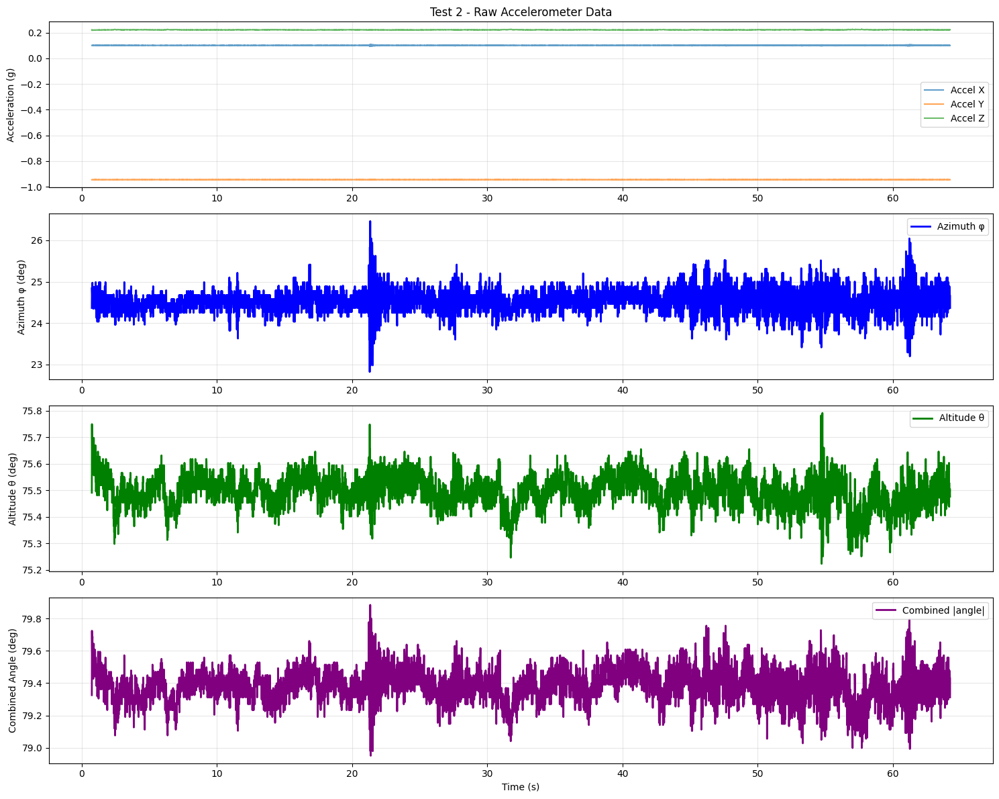


No significant angle changes detected in Test 2


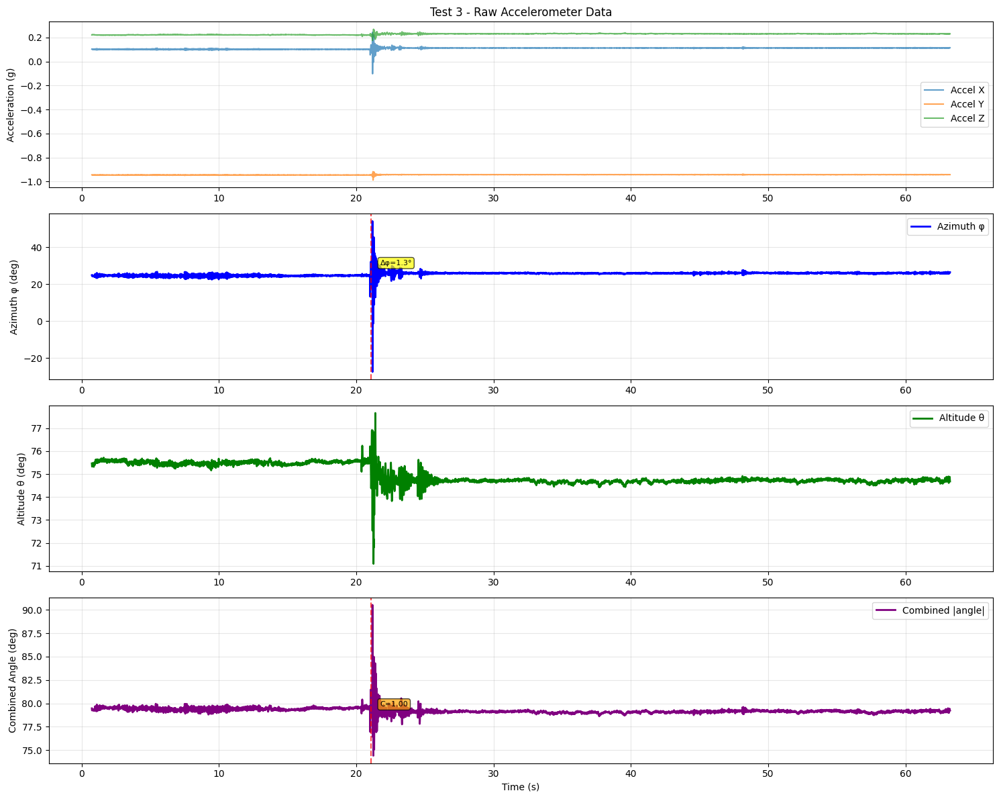


--- Detected Events for Test 3 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
21.1     azimuth    1.3        -0.8       1.000       


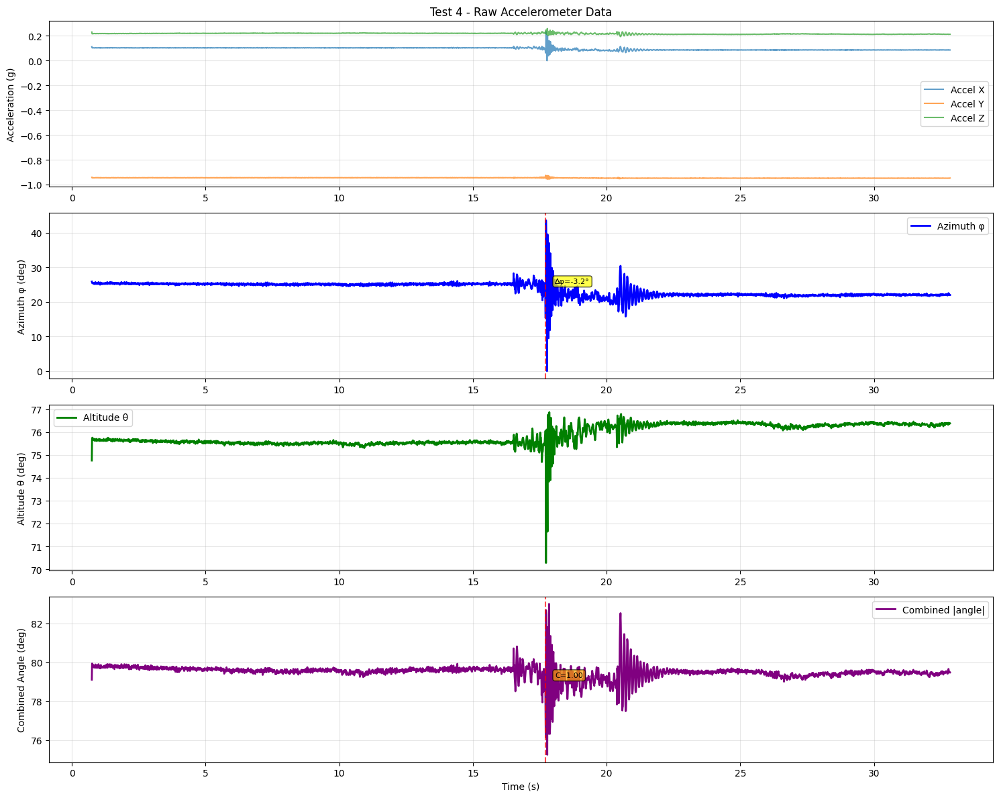


--- Detected Events for Test 4 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.7     azimuth    -3.2       0.8        1.000       


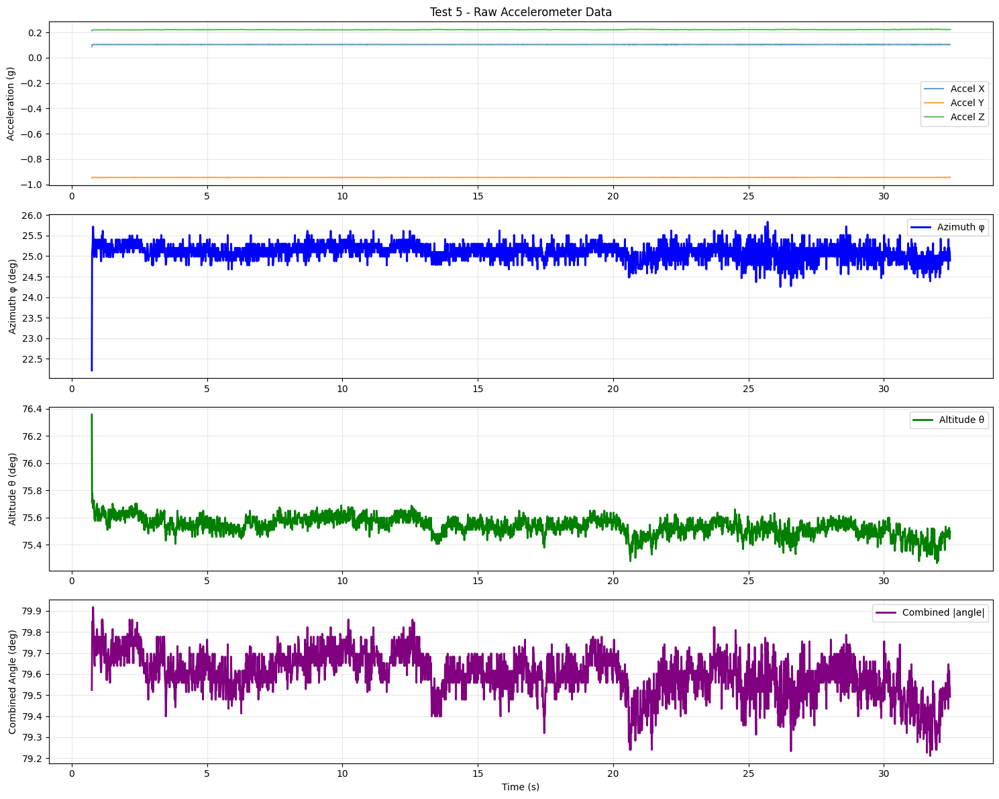


No significant angle changes detected in Test 5


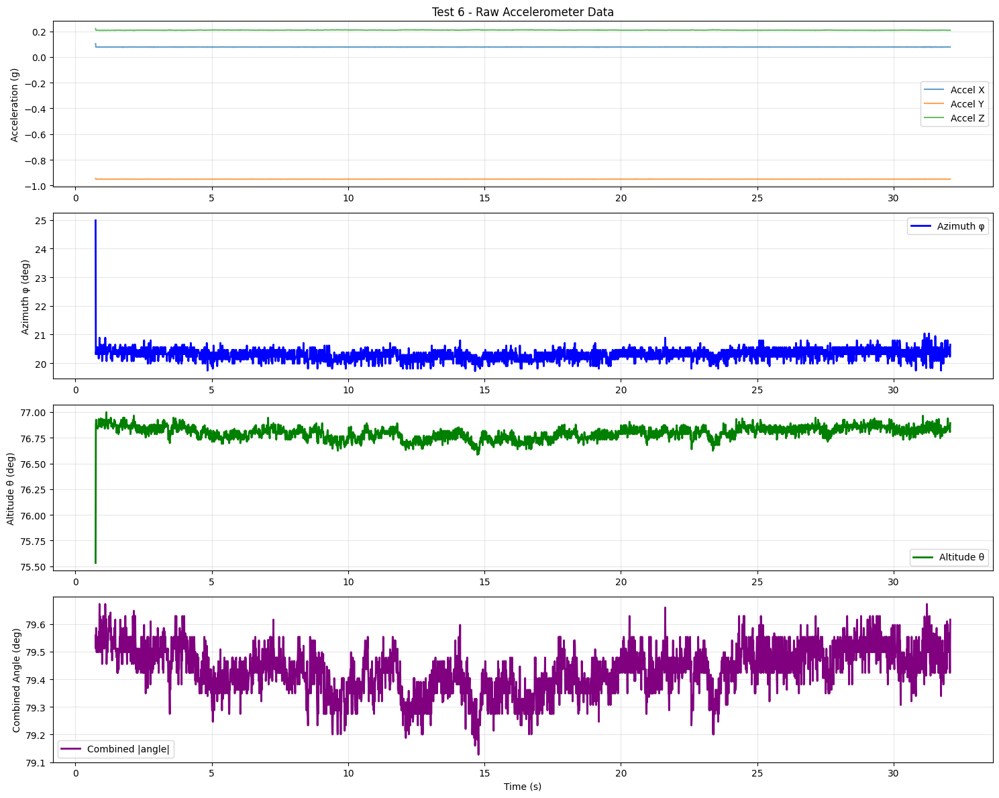


No significant angle changes detected in Test 6


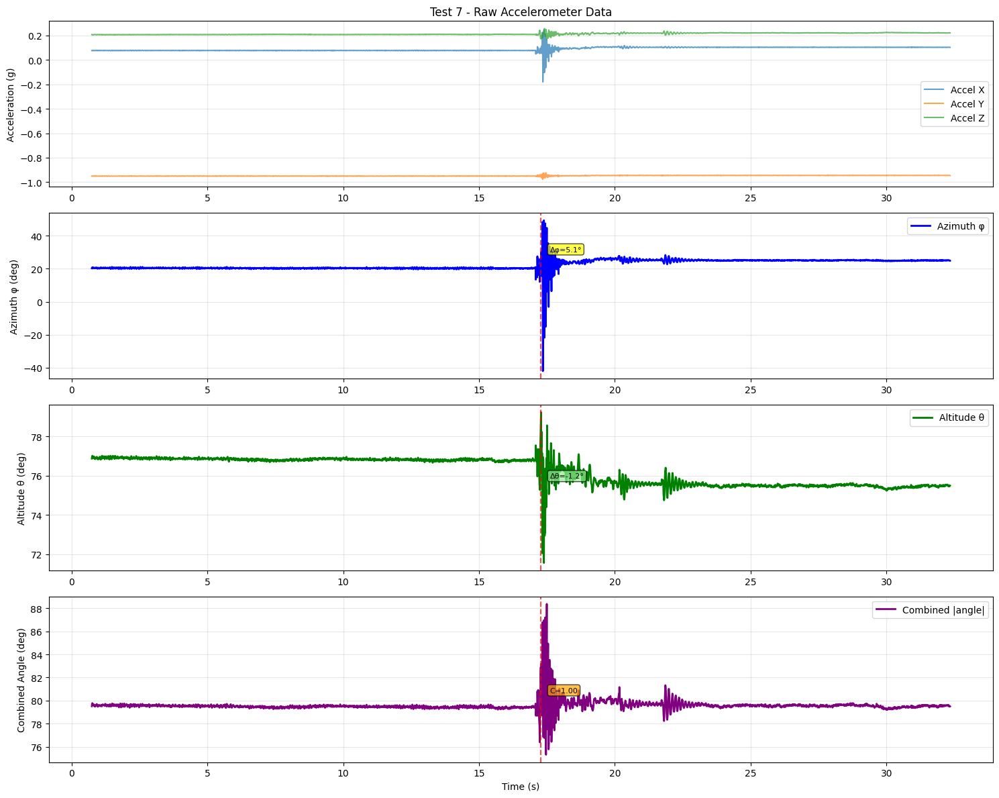


--- Detected Events for Test 7 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.3     combined   5.1        -1.2       1.000       


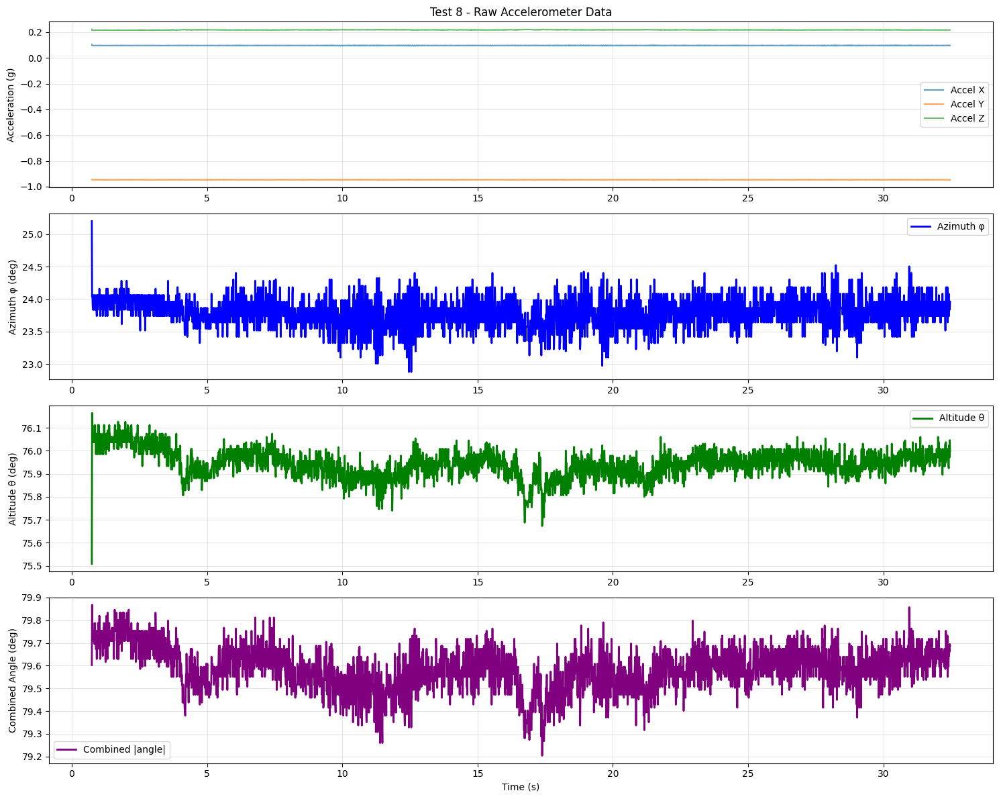


No significant angle changes detected in Test 8


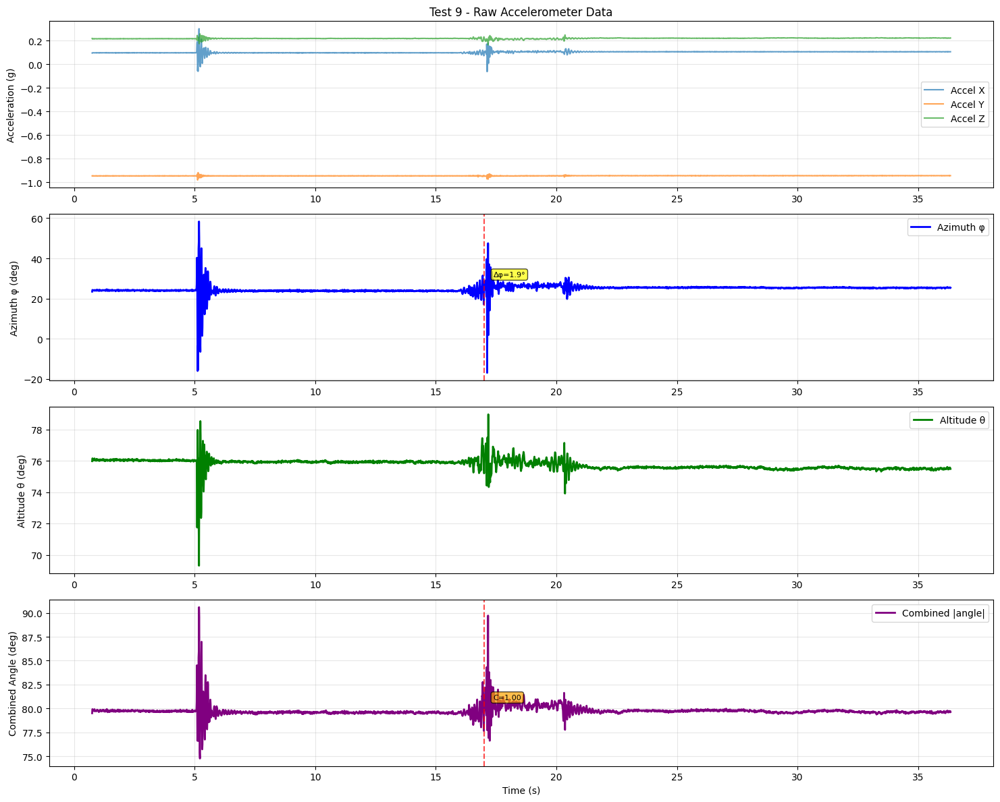


--- Detected Events for Test 9 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.0     azimuth    1.9        -0.3       1.000       


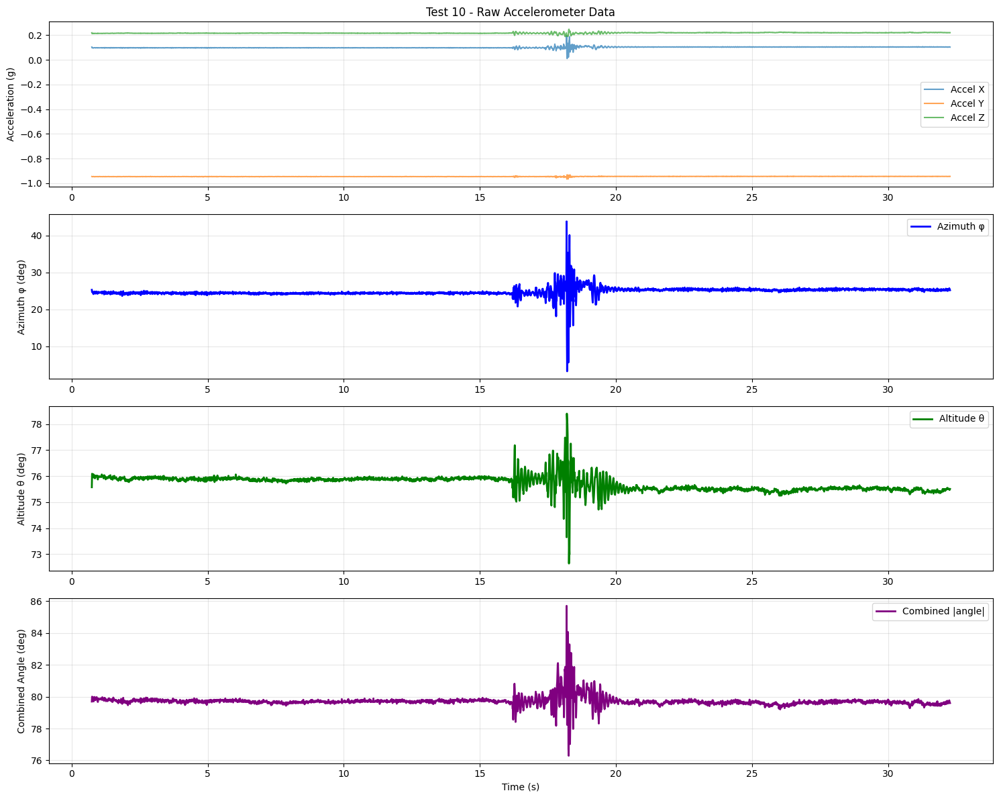


No significant angle changes detected in Test 10


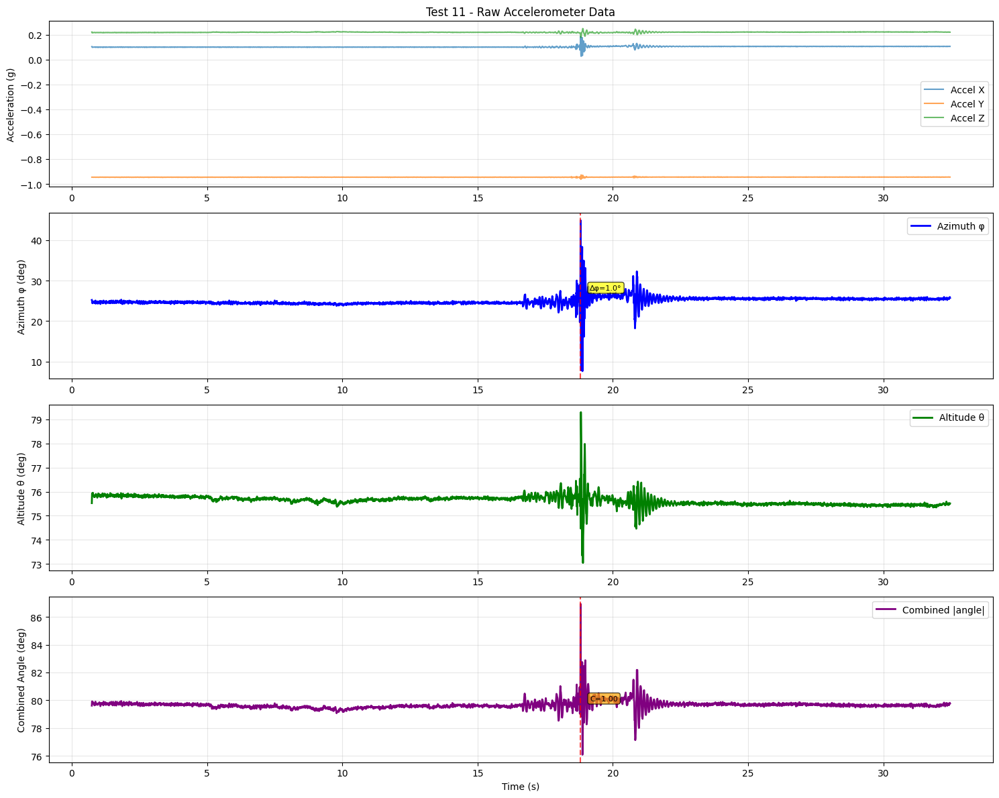


--- Detected Events for Test 11 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
18.8     azimuth    1.0        -0.2       1.000       


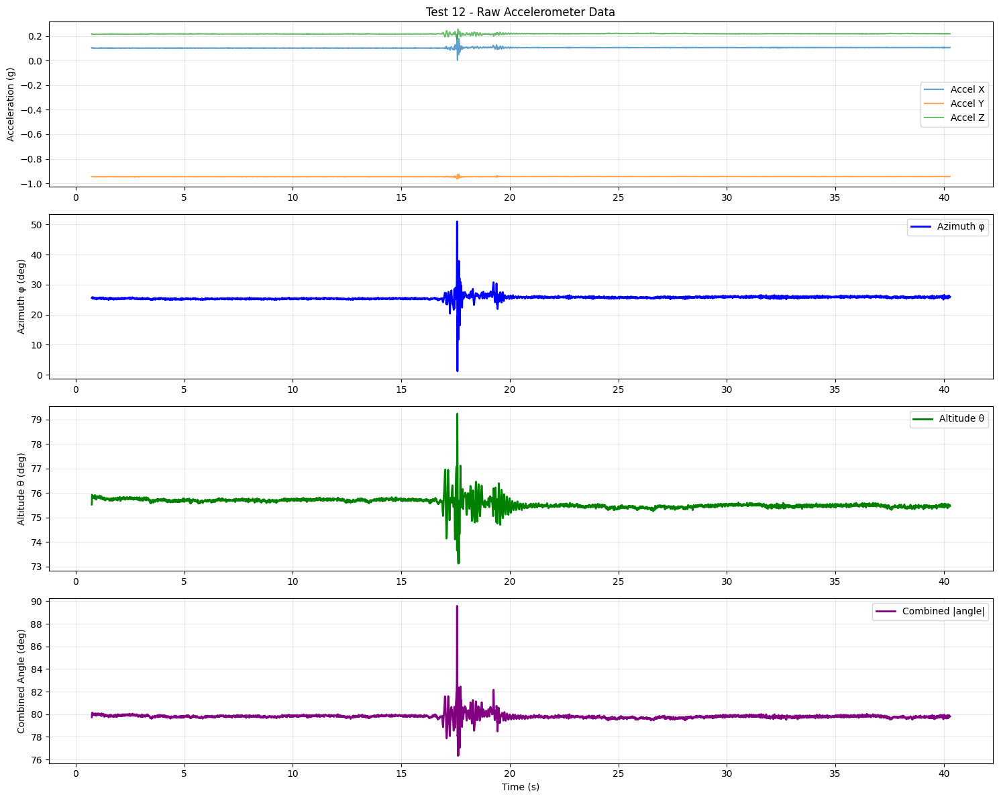


No significant angle changes detected in Test 12


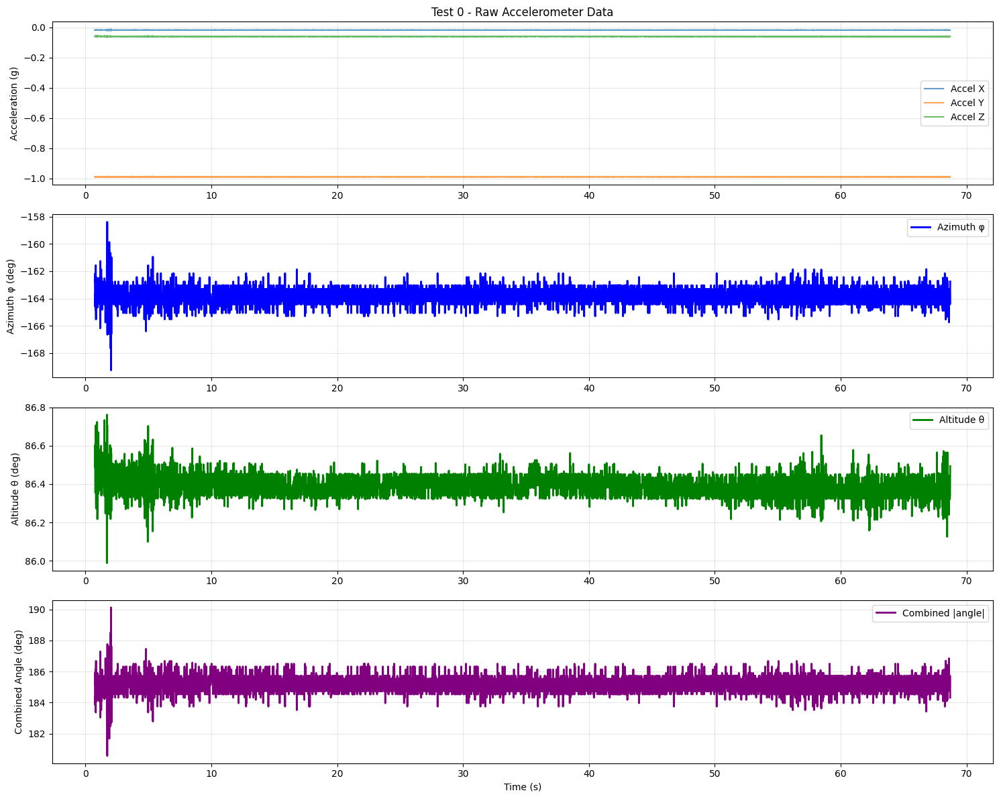


No significant angle changes detected in Test 0


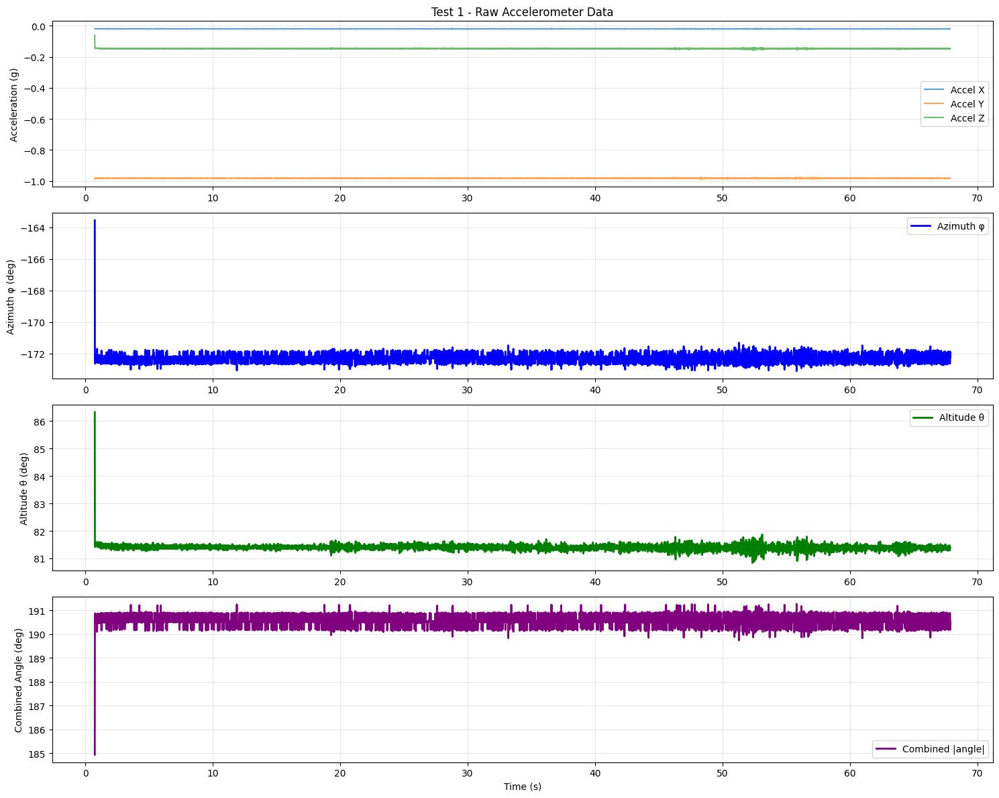


No significant angle changes detected in Test 1


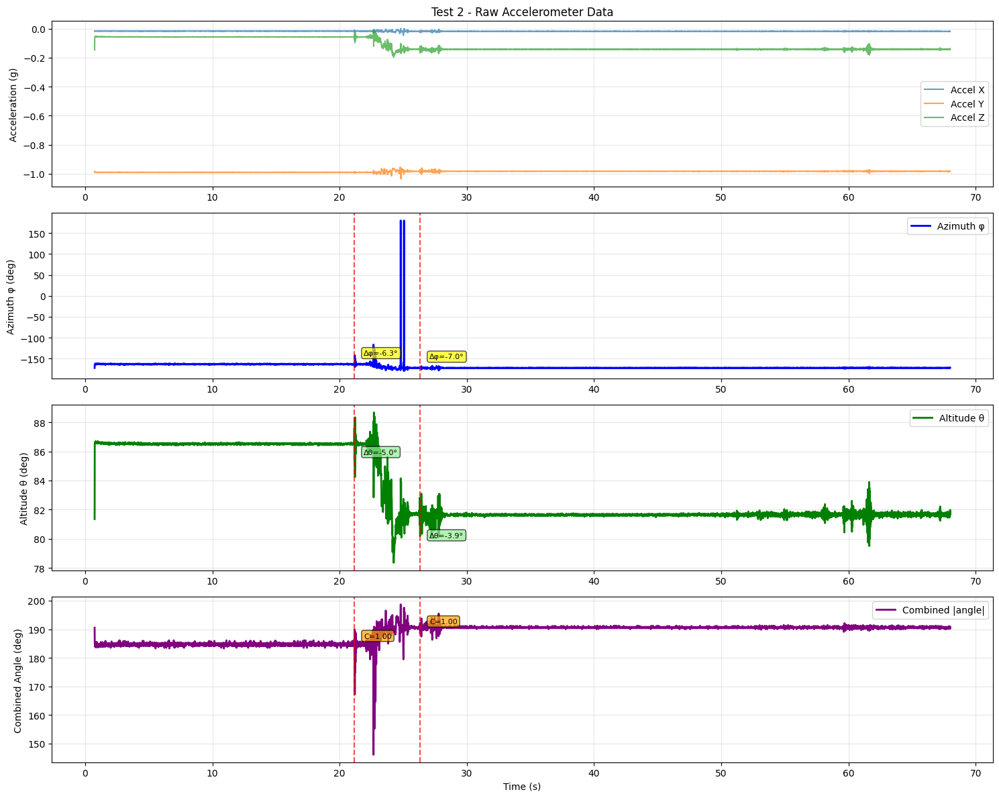


--- Detected Events for Test 2 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
21.2     combined   -6.3       -5.0       0.999       
26.3     combined   -7.0       -3.9       1.000       


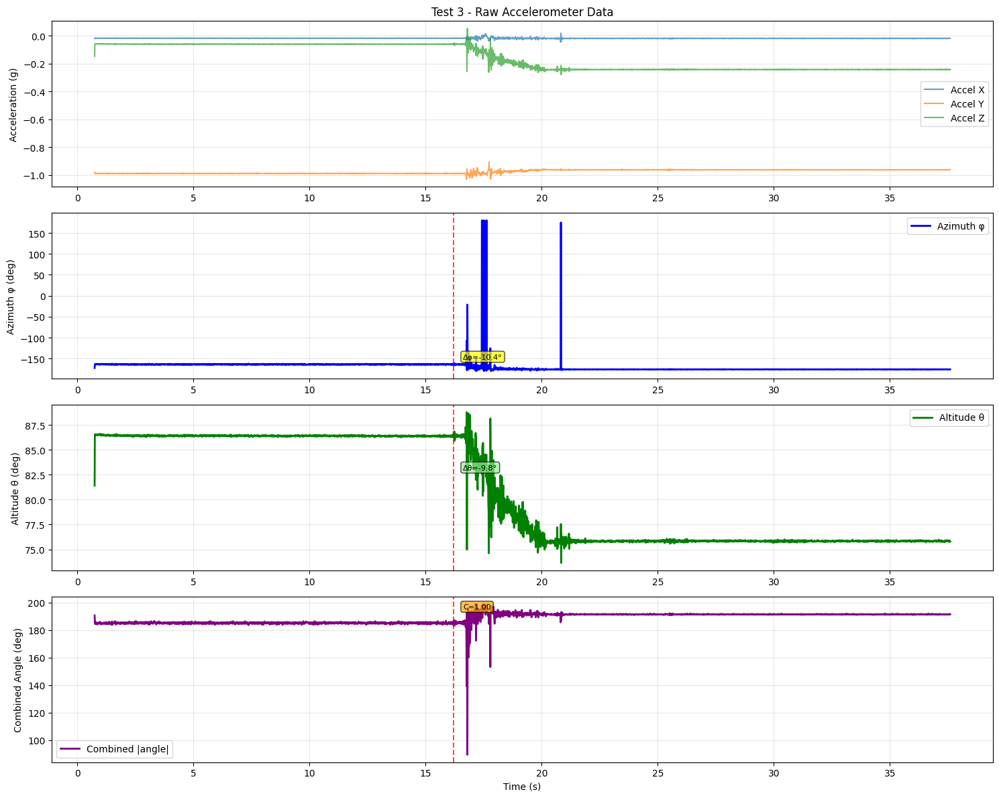


--- Detected Events for Test 3 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.2     combined   -10.4      -9.8       1.000       


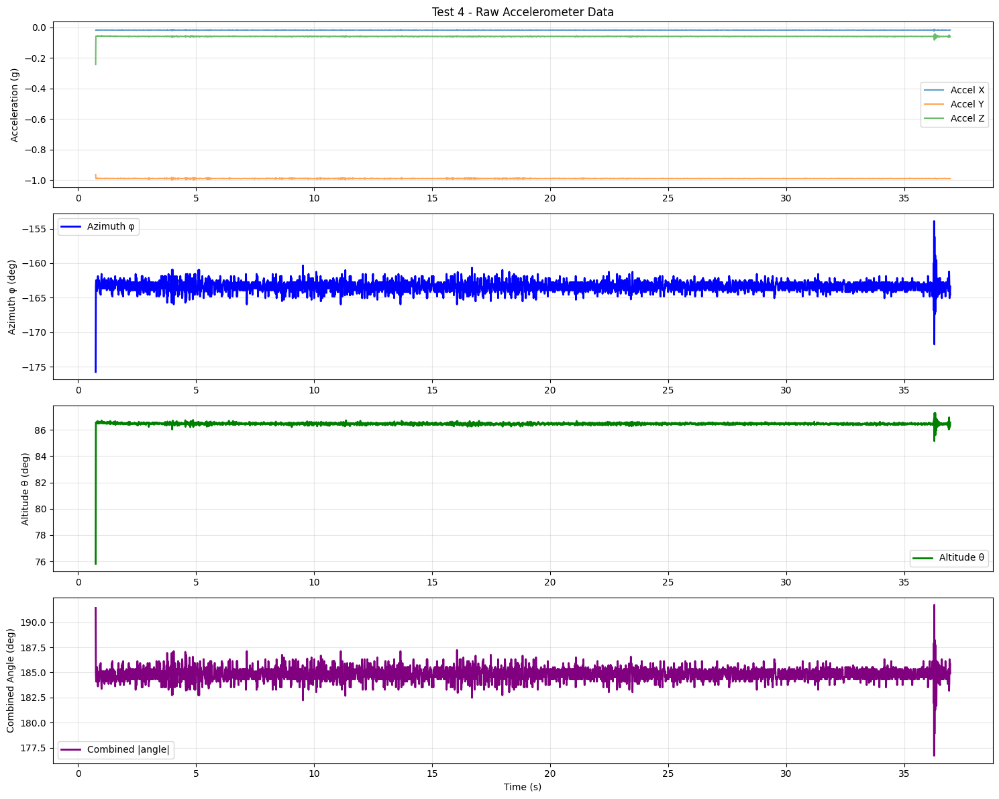


No significant angle changes detected in Test 4


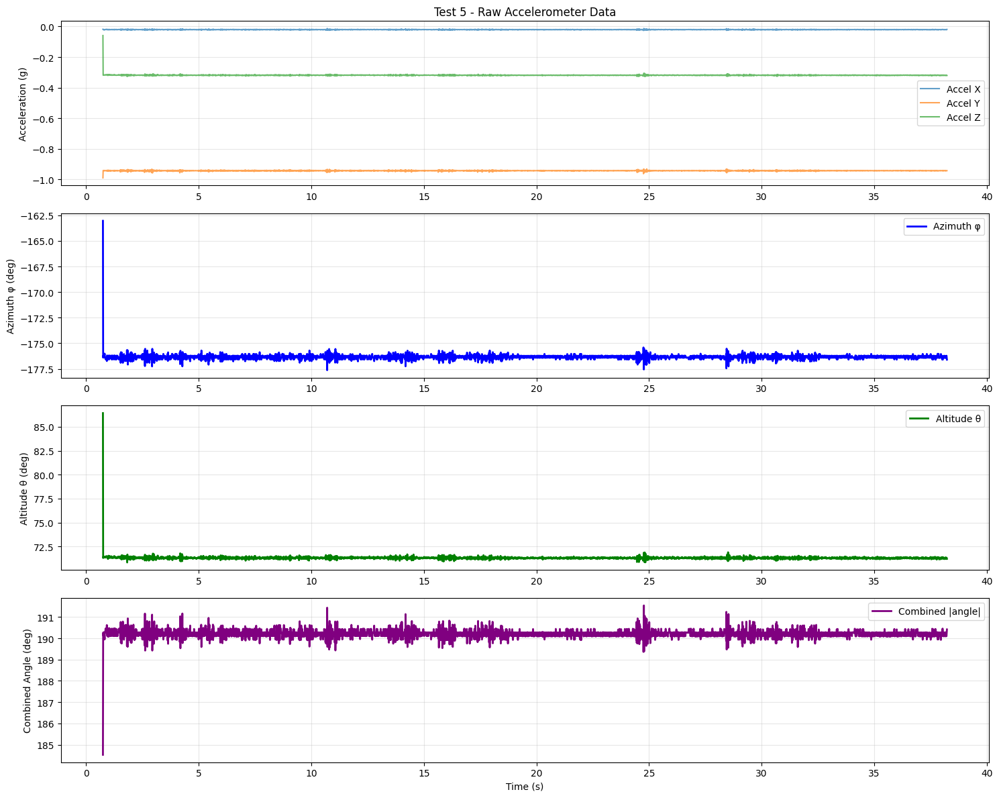


No significant angle changes detected in Test 5


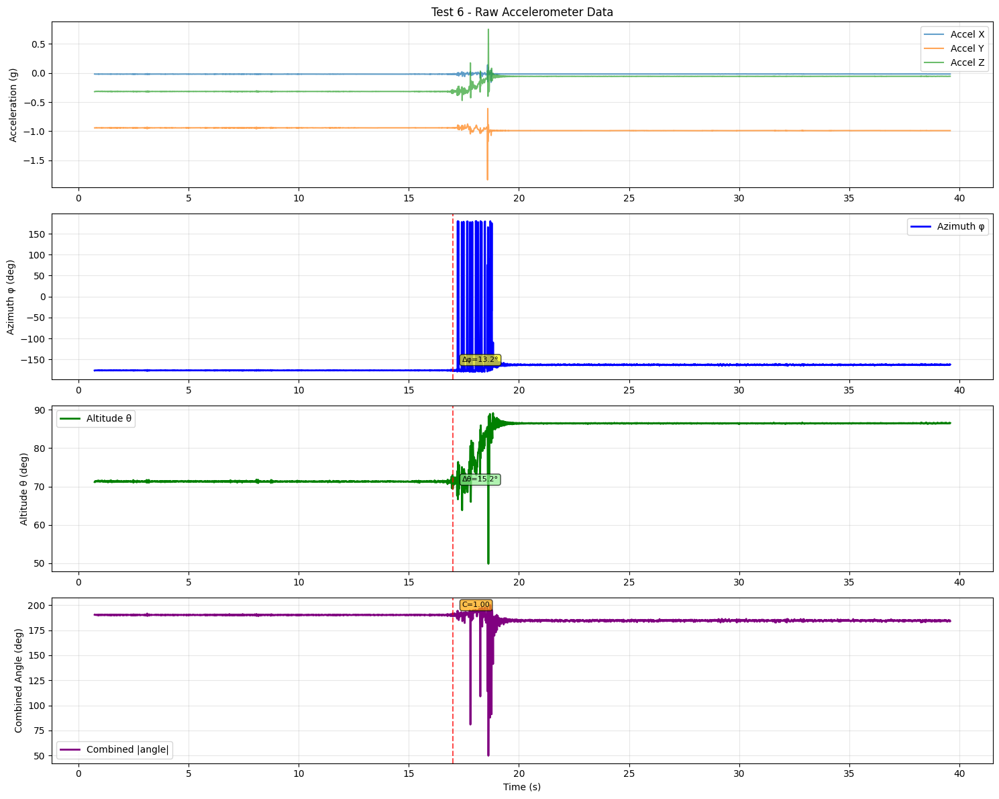


--- Detected Events for Test 6 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.0     combined   13.2       15.2       1.000       


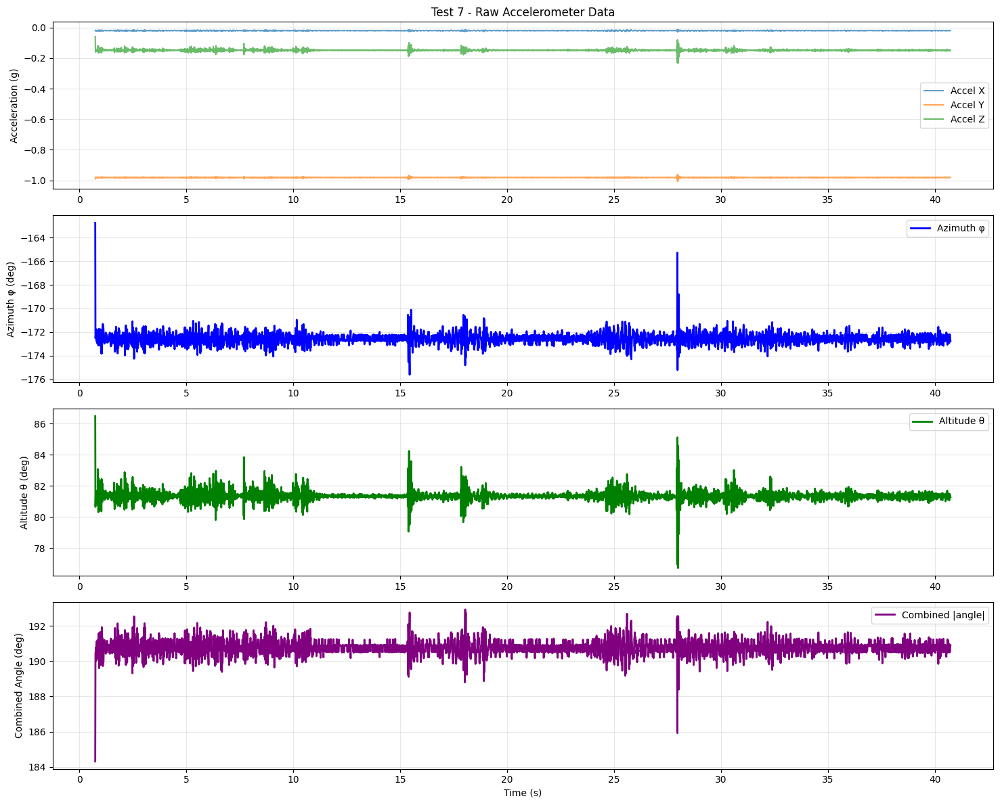


No significant angle changes detected in Test 7


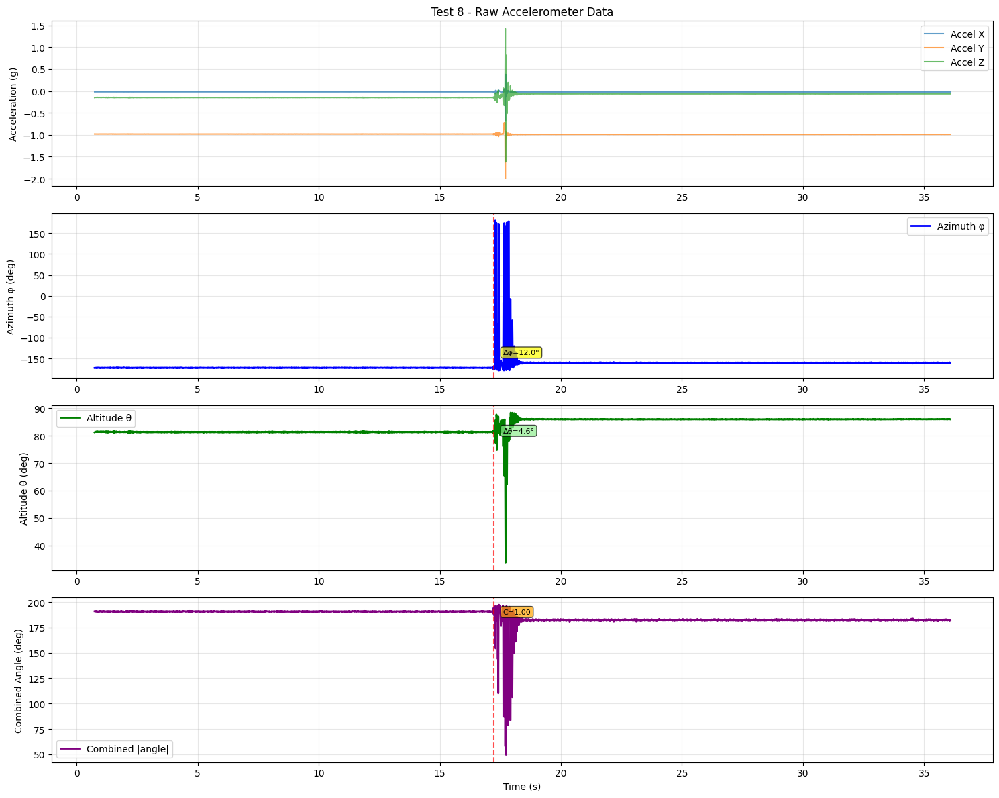


--- Detected Events for Test 8 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
17.2     combined   12.0       4.6        1.000       


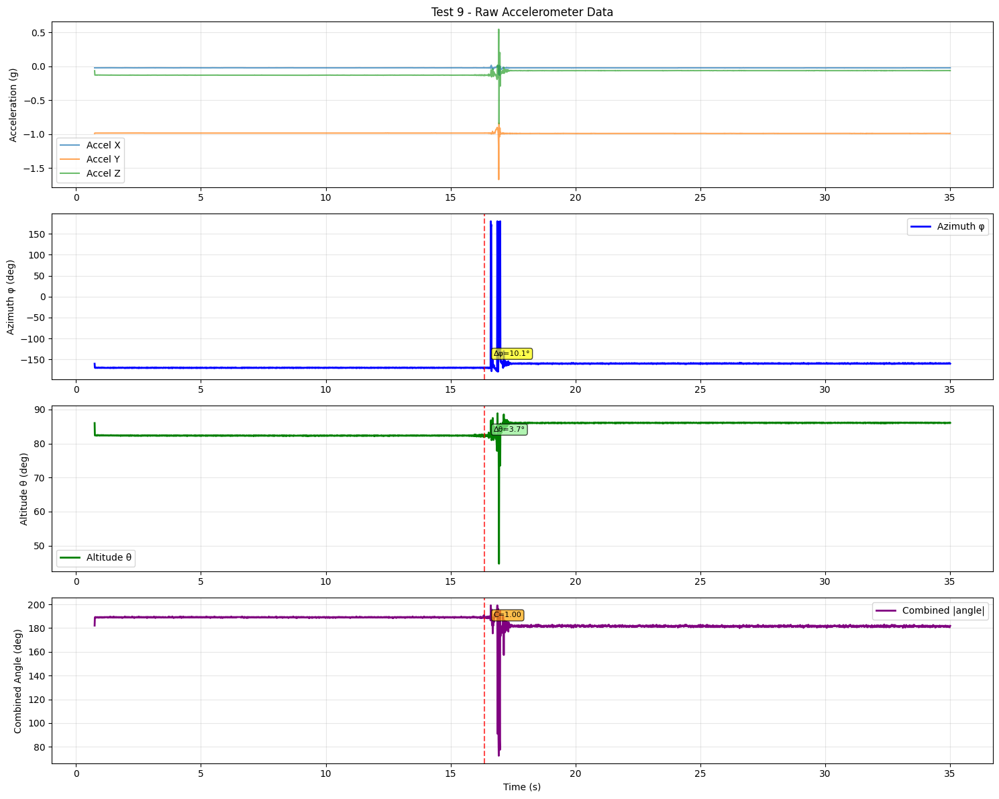


--- Detected Events for Test 9 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.3     combined   10.1       3.7        1.000       


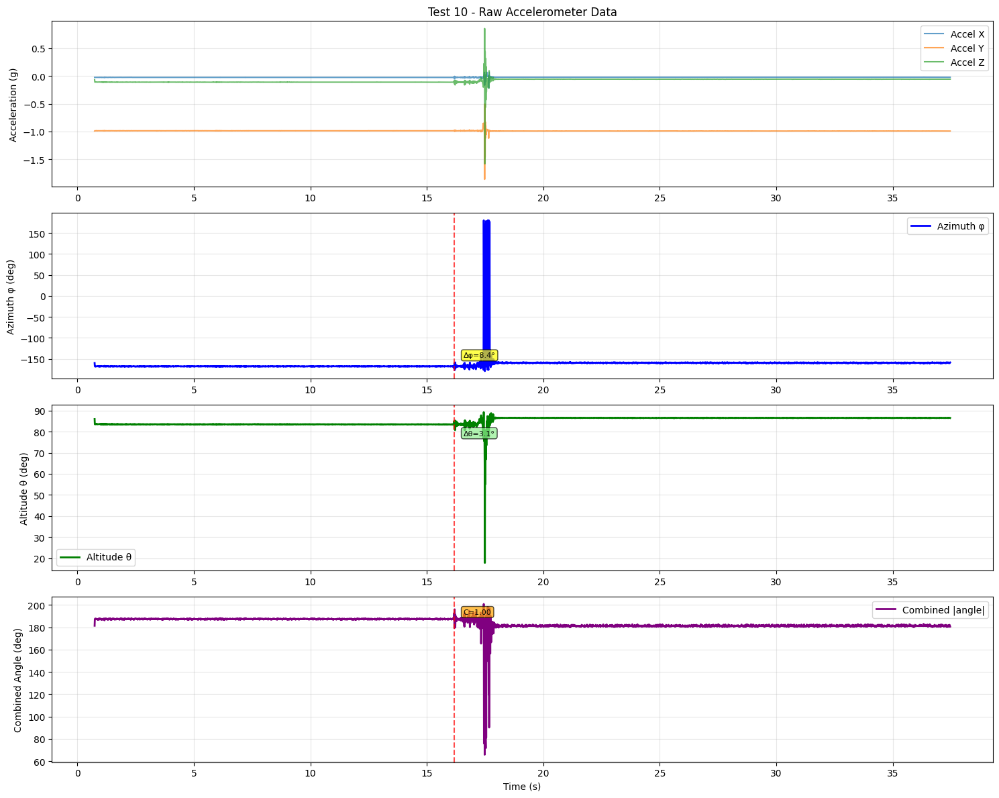


--- Detected Events for Test 10 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.2     combined   8.4        3.1        1.000       


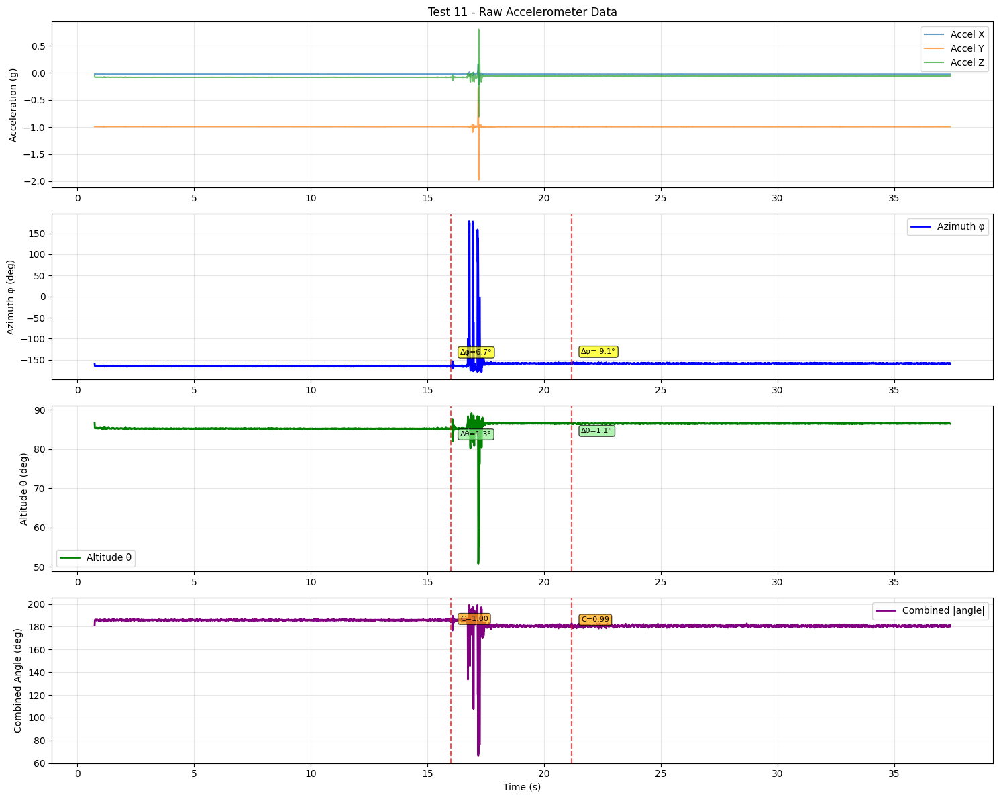


--- Detected Events for Test 11 ---
Time     Type       Δφ (deg)   Δθ (deg)   Confidence  
------------------------------------------------------------
16.0     combined   6.7        1.3        1.000       
21.2     combined   -9.1       1.1        0.992       

Detected 25 angle change events across all tests

raw_data_output_azimuth.csv:
  Test 0: 0 events, 0 matches, 0 false positives
  Test 1: 0 events, 0 matches, 0 false positives
  Test 2: 0 events, 0 matches, 0 false positives
  Test 3: 1 events, 0 matches, 1 false positives
  Test 4: 1 events, 0 matches, 1 false positives
  Test 5: 0 events, 0 matches, 0 false positives
  Test 6: 0 events, 0 matches, 0 false positives
  Test 7: 1 events, 0 matches, 1 false positives
  Test 8: 0 events, 0 matches, 0 false positives
  Test 9: 1 events, 0 matches, 1 false positives
  Test 10: 0 events, 0 matches, 0 false positives
  Test 11: 1 events, 0 matches, 1 false positives
  Test 12: 0 events, 0 matches, 0 false positives

raw_data_output_

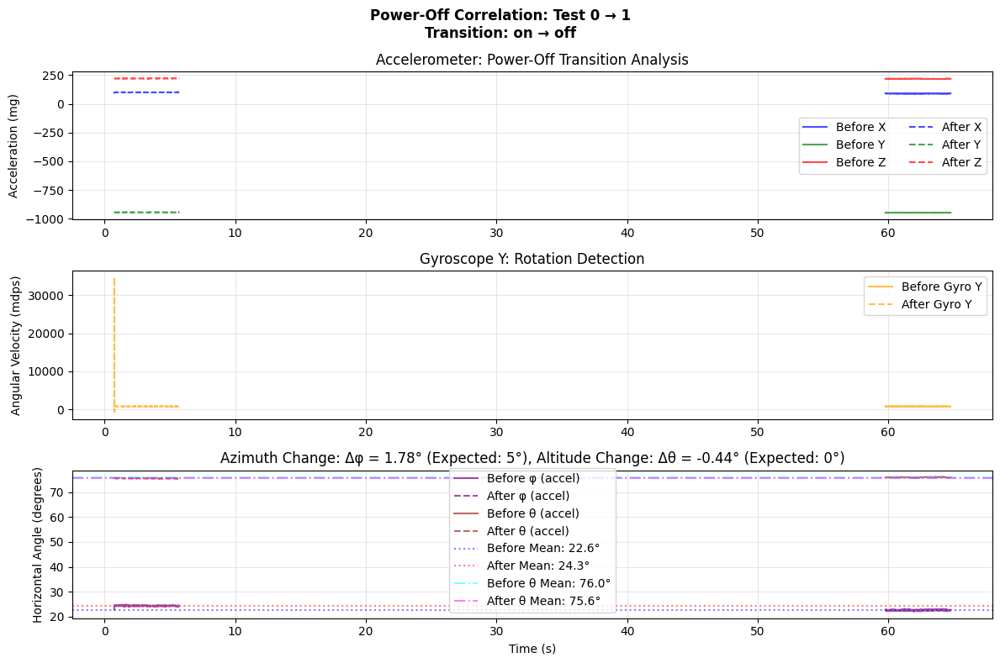

KeyError: 'error_deg'

In [ ]:
#################################################
# TODO: code below has to be fixed to work with the new multi-angle detection approach. It should take notes from the tools and the cell above. We want to make sure that power-off transitions are analyzed correctly.
# A quick view of the tooling in the cell above:
print("=== MULTI-ANGLE CHANGE DETECTION ANALYSIS ===")

# Run the new multi-angle detection system
all_change_results = analyze_all_segments_with_multi_angle_detection(segmented, test_sensor_analyses)

# Generate summary statistics
total_events = sum(len(file_results) for file_results in all_change_results.values())
print(f"\nDetected {total_events} angle change events across all tests")

for file_path, file_results in all_change_results.items():
    print(f"\n{file_path}:")
    for result in file_results:
        events = result['detected_events']
        comparison = result['comparison']
        print(f"  Test {result['test_id']}: {len(events)} events, "
              f"{len(comparison['matches'])} matches, "
              f"{len(comparison['false_positives'])} false positives")
#################################################
power_off_correlations = []

for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    print(f"\nCalculating attitudes for segments in {file_path}...")
    # Calculate accelerometer-based attitudes for all segments
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        power_state = segment['config'].get('power_state', '')
        
        # Identify tests that require correlation with previous segment
        if power_state in ['off', 'off_then_on']:
            if i > 0:  # Ensure previous segment exists
                prev_segment = segments[i-1]
                # Extract stable end data from previous test (last 5 seconds)
                prev_data = prev_segment['data']
                current_data = segment['data']
                
                # Get stable regions for comparison
                prev_end_time = prev_data['timestamp'].iloc[-1]
                prev_stable_mask = prev_data['timestamp'] >= (prev_end_time - 5.0)
                prev_stable_data = prev_data[prev_stable_mask]
                
                current_start_time = current_data['timestamp'].iloc[0]
                current_stable_mask = current_data['timestamp'] <= (current_start_time + 5.0)
                current_stable_data = current_data[current_stable_mask]

                phi_change = segment['config'].get('phi_change', 0)
                theta_change = segment['config'].get('theta_change', 0)
                correlation = {
                    'current_test_id': segment['test_id'],
                    'previous_test_id': prev_segment['test_id'],
                    'phi_change_expected': phi_change,
                    'theta_change_expected': theta_change,
                    'power_transition': f"{prev_segment['config']['power_state']} → {segment['config']['power_state']}",
                    'before_data': prev_stable_data,
                    'after_data': current_stable_data,
                    'before_segment': prev_segment,
                    'after_segment': segment
                }
                power_off_correlations.append(correlation)

    print(f"Found {len(power_off_correlations)} power-off correlations:")
    for corr in power_off_correlations:
        print(f"  Test {corr['previous_test_id']} → Test {corr['current_test_id']}: "
            f"{corr['phi_change_expected']}° expected, {corr['power_transition']}"
            f"{corr['theta_change_expected']}° expected")

# Visualize power-off correlations
def visualize_power_off_correlation(correlation_data, window_s=10.0):
    """Visualize before/after data for power-off correlations"""
    
    before_data = correlation_data['before_data']
    after_data = correlation_data['after_data']
    
    if len(before_data) < 5 or len(after_data) < 5:
        print(f"Insufficient data for correlation {correlation_data['current_test_id']}")
        return
    
    fig, axes = plt.subplots(3, 1, figsize=(12, 8))
    
    # Accelerometer comparison
    ax = axes[0]
    ax.plot(before_data['timestamp'], before_data['accel_x'], 'b-', alpha=0.7, label='Before X')
    ax.plot(before_data['timestamp'], before_data['accel_y'], 'g-', alpha=0.7, label='Before Y') 
    ax.plot(before_data['timestamp'], before_data['accel_z'], 'r-', alpha=0.7, label='Before Z')
    
    ax.plot(after_data['timestamp'], after_data['accel_x'], 'b--', alpha=0.7, label='After X')
    ax.plot(after_data['timestamp'], after_data['accel_y'], 'g--', alpha=0.7, label='After Y')
    ax.plot(after_data['timestamp'], after_data['accel_z'], 'r--', alpha=0.7, label='After Z')
    
    ax.set_ylabel('Acceleration (mg)')
    ax.set_title('Accelerometer: Power-Off Transition Analysis')
    ax.legend(ncol=2)
    ax.grid(alpha=0.3)
    
    # Gyroscope comparison
    ax = axes[1]
    ax.plot(before_data['timestamp'], before_data['gyro_y'], 'orange', alpha=0.7, label='Before Gyro Y')
    ax.plot(after_data['timestamp'], after_data['gyro_y'], 'orange', alpha=0.7, linestyle='--', label='After Gyro Y')
    
    ax.set_ylabel('Angular Velocity (mdps)')
    ax.set_title('Gyroscope Y: Rotation Detection')
    ax.legend()
    ax.grid(alpha=0.3)
    
    # Horizontal angle estimation
    ax = axes[2]
    
    # Calculate horizontal angles for both segments
    before_phi = np.degrees(np.arctan2(before_data['accel_x'], before_data['accel_z']))
    after_phi = np.degrees(np.arctan2(after_data['accel_x'], after_data['accel_z']))

    before_theta = np.degrees(np.arctan2(-before_data['accel_y'], np.sqrt(before_data['accel_x']**2 + before_data['accel_z']**2)))
    after_theta = np.degrees(np.arctan2(-after_data['accel_y'], np.sqrt(after_data['accel_x']**2 + after_data['accel_z']**2)))
    
    ax.plot(before_data['timestamp'], before_phi, 'purple', alpha=0.7, label='Before φ (accel)')
    ax.plot(after_data['timestamp'], after_phi, 'purple', alpha=0.7, linestyle='--', label='After φ (accel)')

    ax.plot(before_data['timestamp'], before_theta, 'brown', alpha=0.7, label='Before θ (accel)')
    ax.plot(after_data['timestamp'], after_theta, 'brown', alpha=0.7, linestyle='--', label='After θ (accel)')
    
    # Calculate mean difference
    phi_before_mean = before_phi.mean()
    phi_after_mean = after_phi.mean()
    delta_phi = phi_after_mean - phi_before_mean

    theta_before_mean = before_theta.mean()
    theta_after_mean = after_theta.mean()
    delta_theta = theta_after_mean - theta_before_mean
    
    ax.axhline(phi_before_mean, color='blue', alpha=0.5, linestyle=':', label=f'Before Mean: {phi_before_mean:.1f}°')
    ax.axhline(phi_after_mean, color='red', alpha=0.5, linestyle=':', label=f'After Mean: {phi_after_mean:.1f}°')

    ax.axhline(theta_before_mean, color='cyan', alpha=0.5, linestyle='-.', label=f'Before θ Mean: {theta_before_mean:.1f}°')
    ax.axhline(theta_after_mean, color='magenta', alpha=0.5, linestyle='-.', label=f'After θ Mean: {theta_after_mean:.1f}°')
    
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Horizontal Angle (degrees)')
    ax.set_title(f'Azimuth Change: Δφ = {delta_phi:.2f}° (Expected: {correlation_data["phi_change_expected"]}°), Altitude Change: Δθ = {delta_theta:.2f}° (Expected: {correlation_data["theta_change_expected"]}°)')
    ax.legend()
    ax.grid(alpha=0.3)
    
    plt.suptitle(f'Power-Off Correlation: Test {correlation_data["previous_test_id"]} → {correlation_data["current_test_id"]}\n'
                f'Transition: {correlation_data["power_transition"]}', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    return {
        'phi_before_mean': phi_before_mean,
        'phi_after_mean': phi_after_mean,
        'delta_phi_measured': delta_phi,
        'phi_expected': correlation_data['phi_change_expected'],
        'theta_before_mean': theta_before_mean,
        'theta_after_mean': theta_after_mean,
        'delta_theta_measured': delta_theta,
        'theta_expected': correlation_data['theta_change_expected'],
    }

# Analyze all power-off correlations
correlation_results = []

for correlation in power_off_correlations:
    print(f"\n--- Analyzing Correlation: Test {correlation['previous_test_id']} → {correlation['current_test_id']} ---")
    result = visualize_power_off_correlation(correlation)
    
    if result:
        result.update({
            'test_transition': f"{correlation['previous_test_id']}→{correlation['current_test_id']}",
            'power_transition': correlation['power_transition'],
            'error_deg_phi': abs(result['delta_phi_measured'] - result['phi_expected'])
        })
        correlation_results.append(result)
        
        print(f"Expected: {result['phi_expected']}°, Measured: {result['delta_phi_measured']:.2f}°, "
            f"Error: {result['error_deg_phi']:.2f}°")


# %%
# Summary comparison table
if correlation_results:
    print("\n" + "="*80)
    print("POWER-OFF CORRELATION SUMMARY")
    print("="*80)
    print(f"{'Transition':<10} {'Power':<15} {'Expected°':<10} {'Measured°':<10} {'Error°':<8} {'Status'}")
    print("-"*80)
    
    for result in correlation_results:
        status = "GOOD" if result['error_deg_phi'] < 2.0 else "POOR"
        print(f"{result['test_transition']:<10} {result['power_transition']:<15} "
            f"{result['phi_expected']:<10} {result['delta_phi_measured']:<10.2f} "
            f"{result['error_deg_phi']:<8.2f} {status}")

    
    # Statistical summary
    errors = [r['error_deg_phi'] for r in correlation_results]
    print("-"*80)
    print(f"Mean Absolute Error: {np.mean(errors):.2f}°")
    print(f"Max Error: {np.max(errors):.2f}°")
    print(f"RMS Error: {np.sqrt(np.mean([e**2 for e in errors])):.2f}°")
    
else:
    print("No valid correlation results found.")

## 5. Attitude Integration from Gyroscope

**Mathematical Framework**:
- Attitude integration: R(t+dt) = R(t) * exp([ω×]dt)
- Simple Euler integration: φ(t+dt) = φ(t) + ω*dt
- **Challenge**: Gyroscope bias and drift accumulation


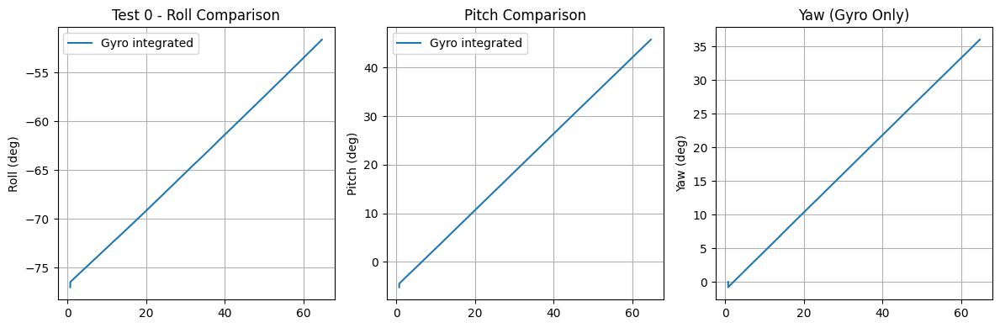

Test 0 - Gyro drift over 64.0s:
  Roll drift: 25.35 deg
  Pitch drift: 51.00 deg
  Yaw drift: 35.99 deg


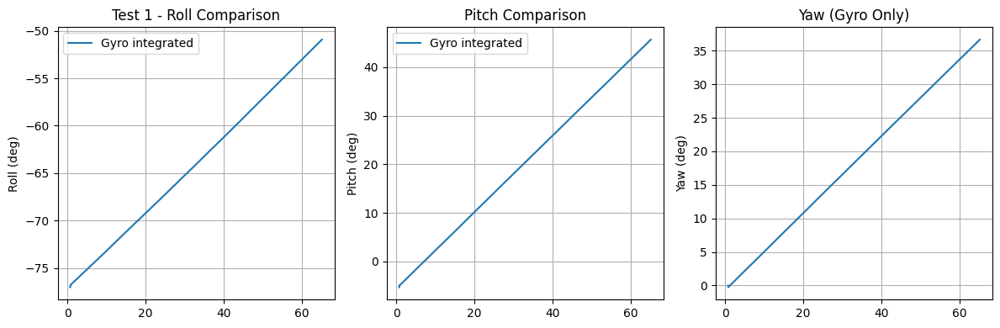

Test 1 - Gyro drift over 64.4s:
  Roll drift: 26.12 deg
  Pitch drift: 50.98 deg
  Yaw drift: 36.66 deg


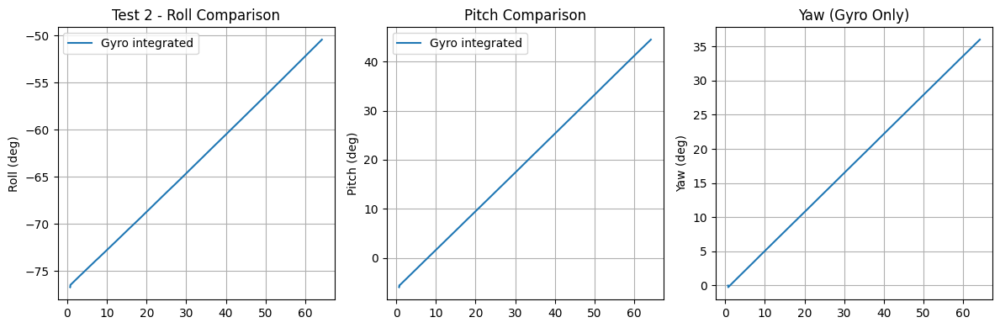

Test 2 - Gyro drift over 63.5s:
  Roll drift: 26.30 deg
  Pitch drift: 50.38 deg
  Yaw drift: 36.02 deg


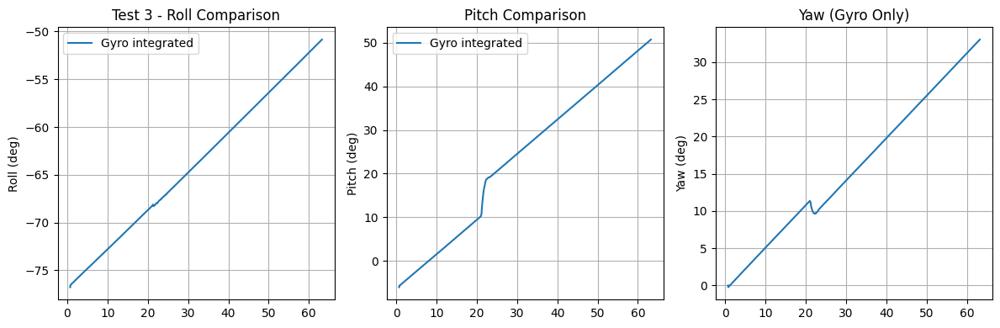

Test 3 - Gyro drift over 62.5s:
  Roll drift: 25.92 deg
  Pitch drift: 56.81 deg
  Yaw drift: 33.02 deg


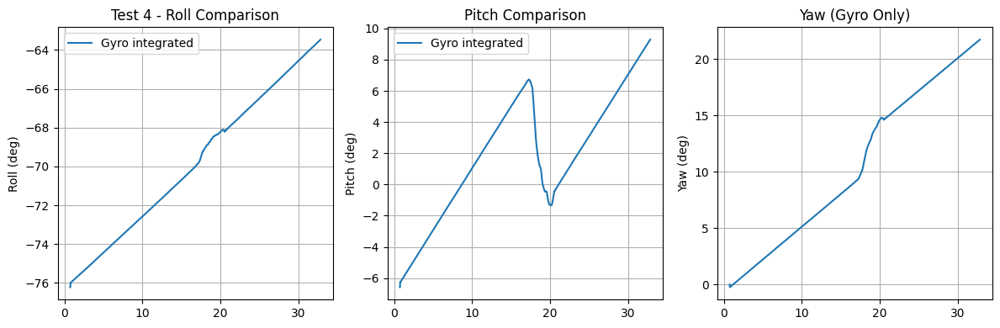

Test 4 - Gyro drift over 32.1s:
  Roll drift: 12.76 deg
  Pitch drift: 15.87 deg
  Yaw drift: 21.72 deg


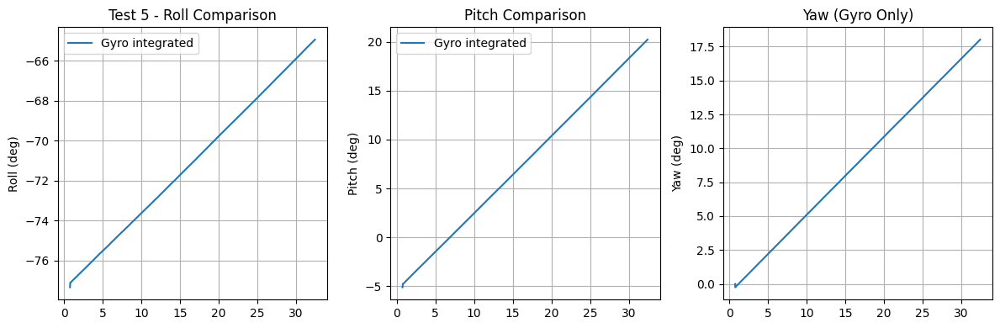

Test 5 - Gyro drift over 31.7s:
  Roll drift: 12.39 deg
  Pitch drift: 25.35 deg
  Yaw drift: 18.02 deg


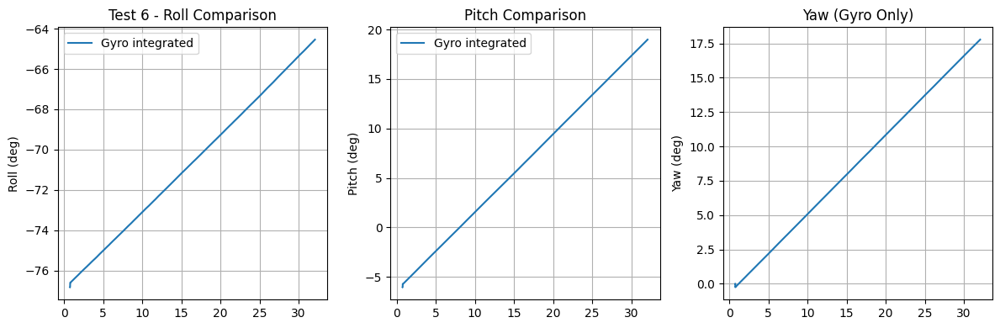

Test 6 - Gyro drift over 31.3s:
  Roll drift: 12.30 deg
  Pitch drift: 25.05 deg
  Yaw drift: 17.77 deg


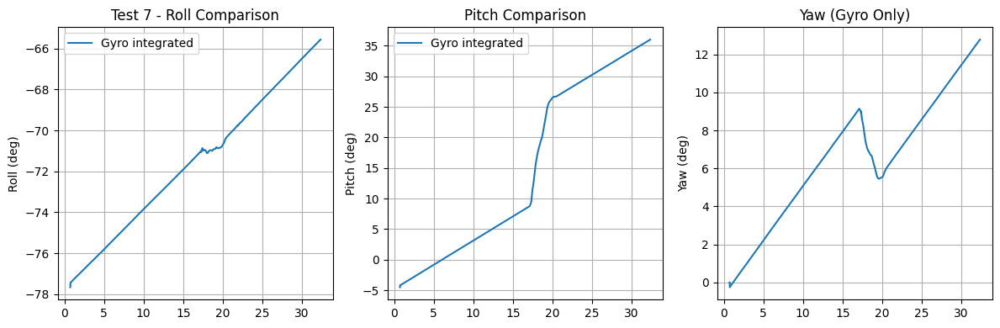

Test 7 - Gyro drift over 31.6s:
  Roll drift: 12.10 deg
  Pitch drift: 40.53 deg
  Yaw drift: 12.78 deg


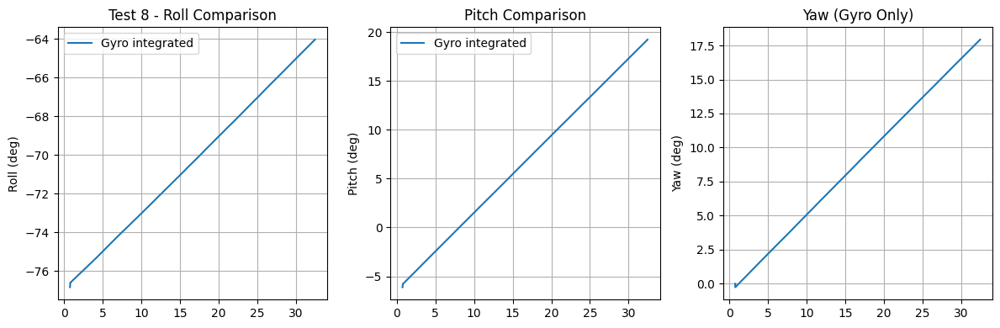

Test 8 - Gyro drift over 31.7s:
  Roll drift: 12.81 deg
  Pitch drift: 25.34 deg
  Yaw drift: 17.93 deg


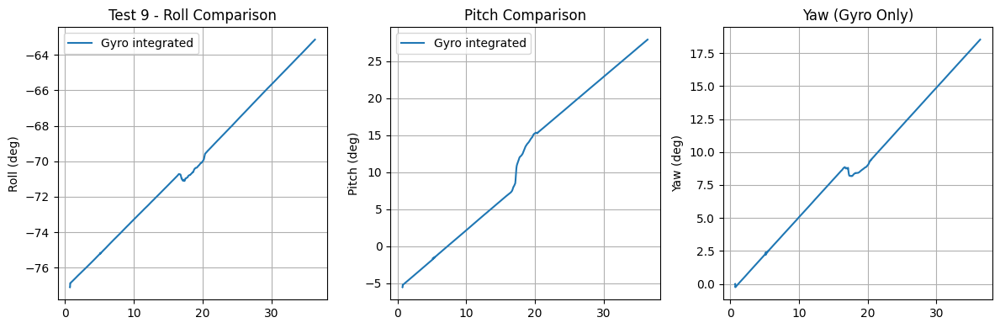

Test 9 - Gyro drift over 35.6s:
  Roll drift: 13.94 deg
  Pitch drift: 33.43 deg
  Yaw drift: 18.53 deg


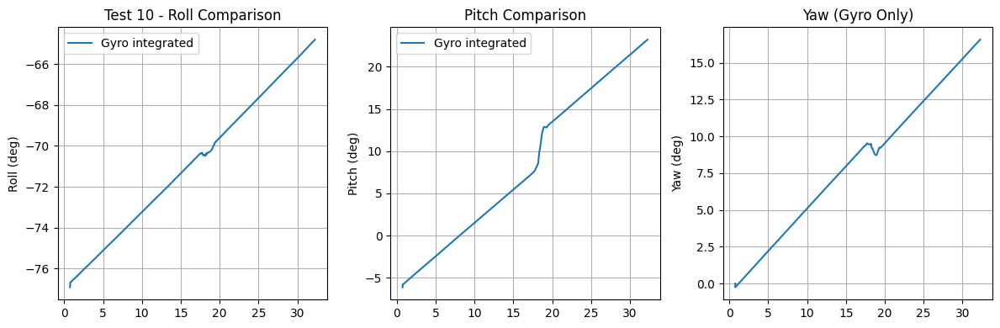

Test 10 - Gyro drift over 31.5s:
  Roll drift: 12.10 deg
  Pitch drift: 29.33 deg
  Yaw drift: 16.57 deg


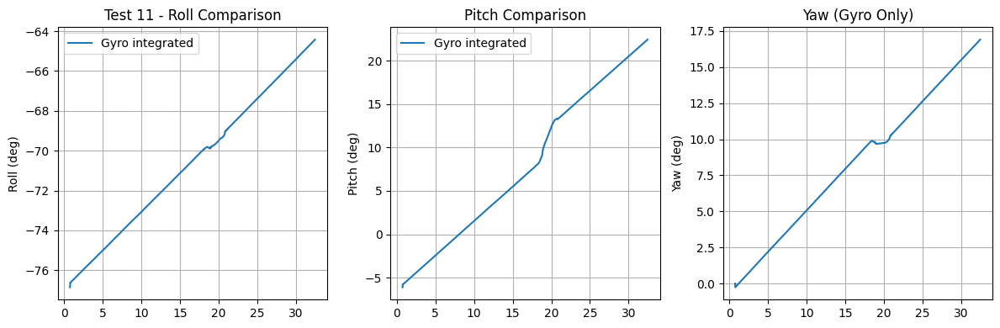

Test 11 - Gyro drift over 31.7s:
  Roll drift: 12.43 deg
  Pitch drift: 28.56 deg
  Yaw drift: 16.91 deg


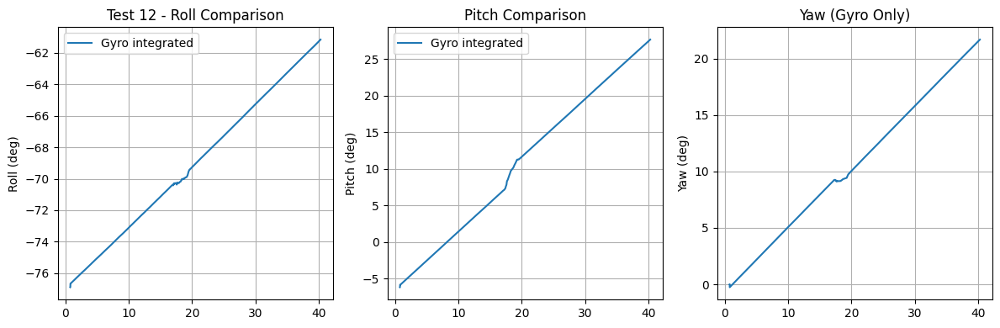

Test 12 - Gyro drift over 39.5s:
  Roll drift: 15.73 deg
  Pitch drift: 33.85 deg
  Yaw drift: 21.67 deg


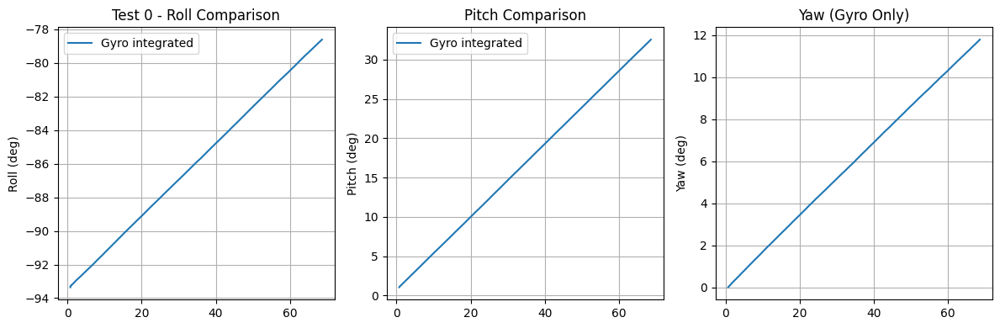

Test 0 - Gyro drift over 68.0s:
  Roll drift: 14.74 deg
  Pitch drift: 31.52 deg
  Yaw drift: 11.80 deg


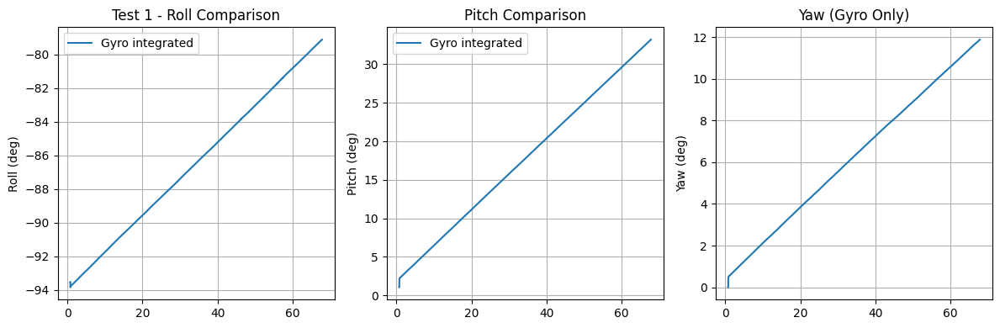

Test 1 - Gyro drift over 67.1s:
  Roll drift: 14.42 deg
  Pitch drift: 32.17 deg
  Yaw drift: 11.89 deg


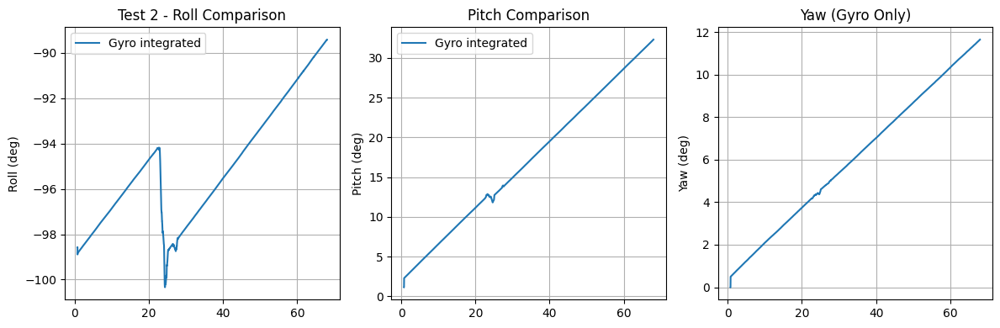

Test 2 - Gyro drift over 67.3s:
  Roll drift: 9.16 deg
  Pitch drift: 31.17 deg
  Yaw drift: 11.65 deg


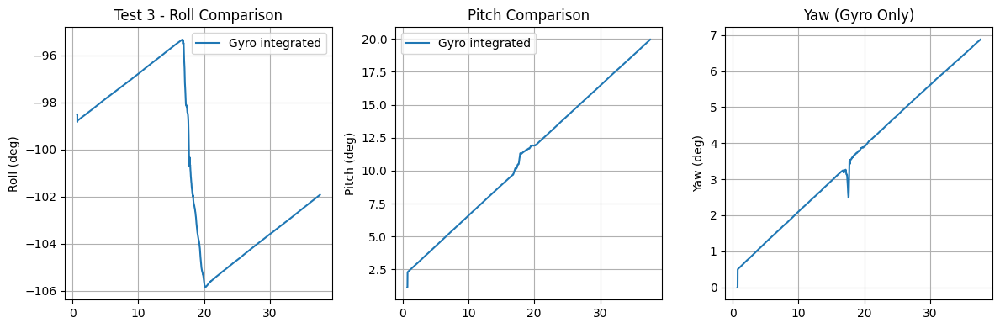

Test 3 - Gyro drift over 36.9s:
  Roll drift: -3.41 deg
  Pitch drift: 18.79 deg
  Yaw drift: 6.87 deg


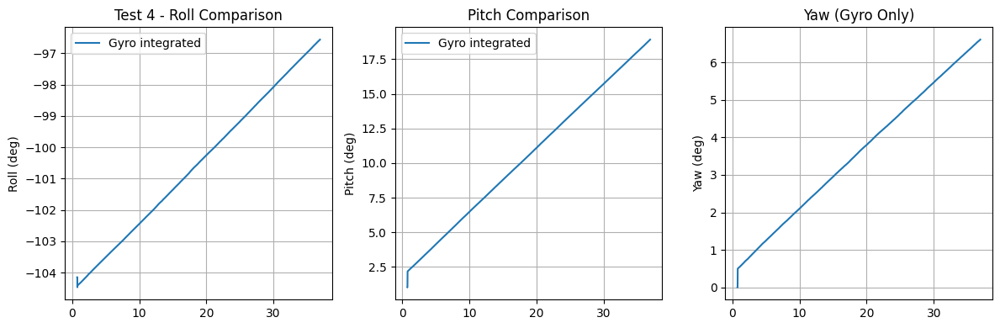

Test 4 - Gyro drift over 36.2s:
  Roll drift: 7.58 deg
  Pitch drift: 17.88 deg
  Yaw drift: 6.62 deg


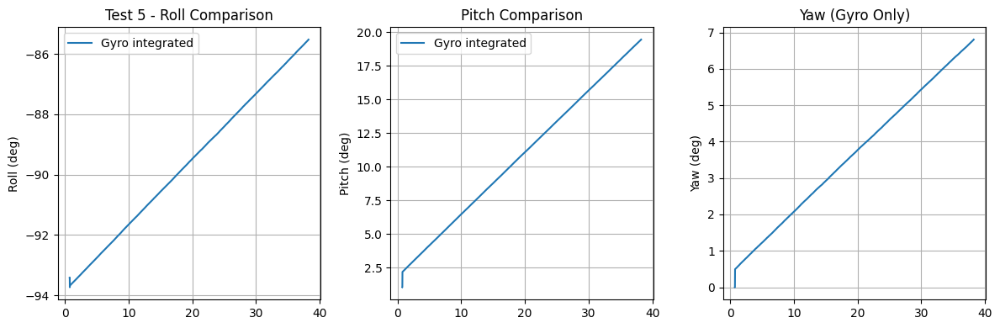

Test 5 - Gyro drift over 37.5s:
  Roll drift: 7.89 deg
  Pitch drift: 18.42 deg
  Yaw drift: 6.80 deg


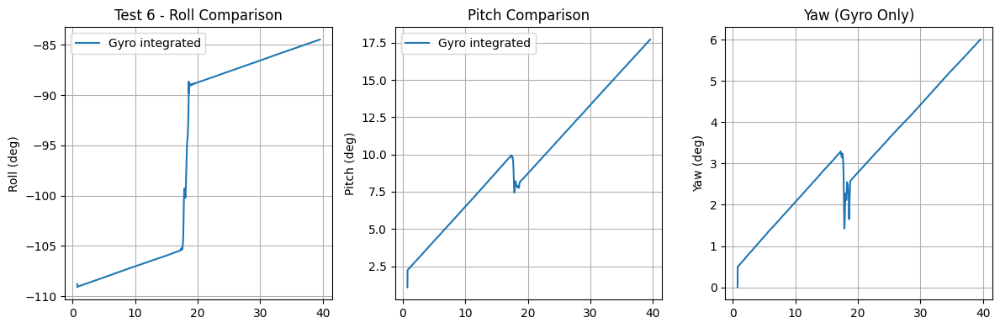

Test 6 - Gyro drift over 38.8s:
  Roll drift: 24.33 deg
  Pitch drift: 16.61 deg
  Yaw drift: 6.01 deg


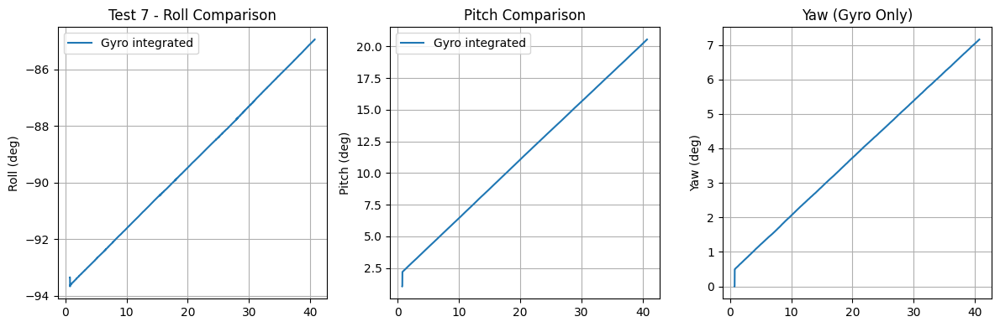

Test 7 - Gyro drift over 40.0s:
  Roll drift: 8.41 deg
  Pitch drift: 19.51 deg
  Yaw drift: 7.16 deg


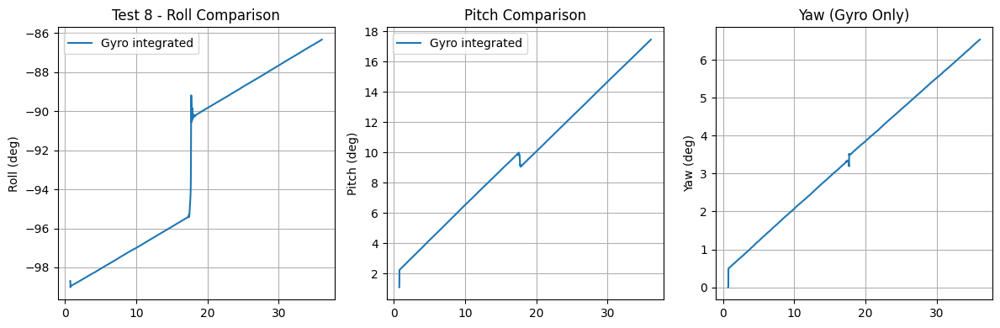

Test 8 - Gyro drift over 35.3s:
  Roll drift: 12.36 deg
  Pitch drift: 16.36 deg
  Yaw drift: 6.54 deg


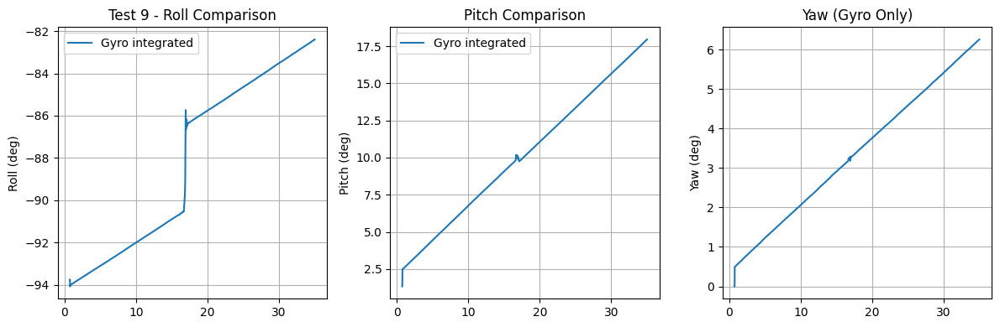

Test 9 - Gyro drift over 34.3s:
  Roll drift: 11.37 deg
  Pitch drift: 16.62 deg
  Yaw drift: 6.26 deg


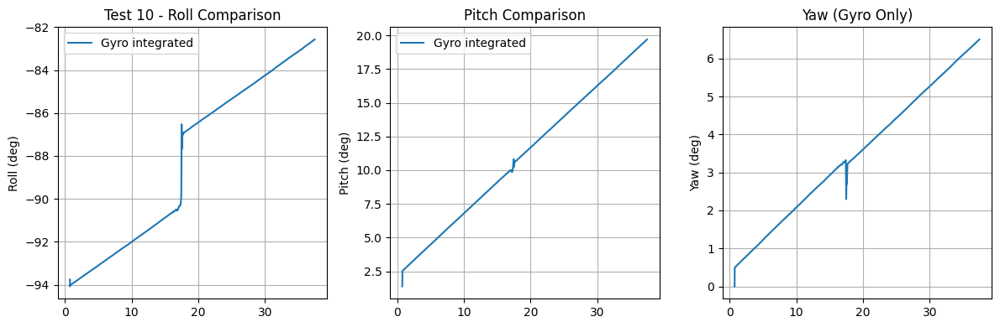

Test 10 - Gyro drift over 36.7s:
  Roll drift: 11.18 deg
  Pitch drift: 18.31 deg
  Yaw drift: 6.50 deg


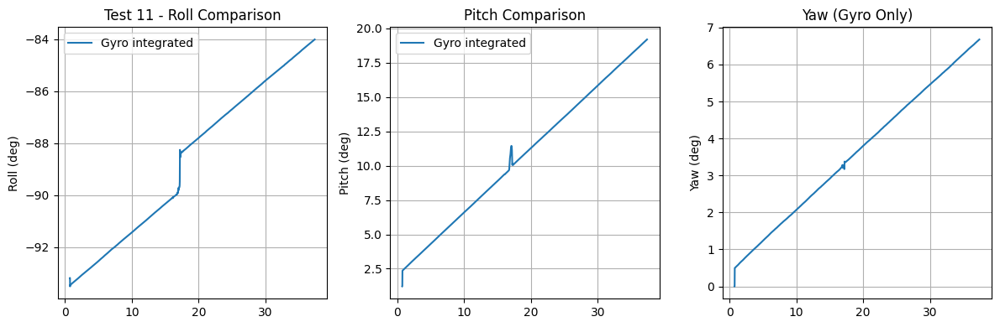

Test 11 - Gyro drift over 36.7s:
  Roll drift: 9.17 deg
  Pitch drift: 17.98 deg
  Yaw drift: 6.68 deg


In [27]:
def integrate_gyro_attitude(gyro_dps: np.ndarray, dt: float, 
                           initial_attitude: np.ndarray = np.zeros(3)) -> np.ndarray:
    """Integrate gyroscope data to get attitude
    
    Args:
        gyro_dps: Nx3 gyroscope data in degrees per second
        dt: Sample time interval
        initial_attitude: Initial [roll, pitch, yaw] in degrees
    Returns:
        Nx3 integrated attitude in degrees
    """
    attitude = np.zeros((len(gyro_dps), 3))
    attitude[0] = initial_attitude
    
    for i in range(1, len(gyro_dps)):
        # Simple Euler integration (for demonstration)
        attitude[i] = attitude[i-1] + gyro_dps[i-1] * dt
        
        # Wrap angles
        attitude[i, 0] = wrap_angle_deg(attitude[i, 0])  # Roll
        attitude[i, 1] = wrap_angle_deg(attitude[i, 1])  # Pitch
        attitude[i, 2] = wrap_angle_deg(attitude[i, 2])  # Yaw
    
    return attitude

for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    # Integrate gyroscope data for each segment
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        # Use first accelerometer reading as initial condition
        initial_accel_attitude = accel_to_attitude(analysis['accel_g'][:1])[0]
        
        dt = 1.0 / fs
        attitude_gyro = integrate_gyro_attitude(analysis['gyro_dps'], dt, initial_accel_attitude)
        
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 3, 1)
        plt.plot(segment['data']['timestamp'], attitude_gyro[:, 0], label='Gyro integrated')
        plt.title(f'Test {segment["test_id"]} - Roll Comparison')
        plt.ylabel('Roll (deg)')
        plt.legend()
        plt.grid(True)
        
        plt.subplot(1, 3, 2)
        plt.plot(segment['data']['timestamp'], attitude_gyro[:, 1], label='Gyro integrated')
        plt.title('Pitch Comparison')
        plt.ylabel('Pitch (deg)')
        plt.legend()
        plt.grid(True)
        
        plt.subplot(1, 3, 3)
        plt.plot(segment['data']['timestamp'], attitude_gyro[:, 2])
        plt.title('Yaw (Gyro Only)')
        plt.ylabel('Yaw (deg)')
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()
        
        # Show drift characteristics
        final_drift = attitude_gyro[-1] - attitude_gyro[0]
        print(f"Test {segment['test_id']} - Gyro drift over {len(attitude_gyro)/fs:.1f}s:")
        print(f"  Roll drift: {final_drift[0]:.2f} deg")
        print(f"  Pitch drift: {final_drift[1]:.2f} deg") 
        print(f"  Yaw drift: {final_drift[2]:.2f} deg")


## 6. Noise Characterization

**Objective**: Determine sensor noise characteristics for filter tuning
- **Allan Variance**: Standard method for gyroscope bias stability
- **Power Spectral Density**: Frequency content of noise
- **Static vs Dynamic**: Noise characteristics under different conditions


Evaluating performance for segments in raw_data_output_azimuth.csv...


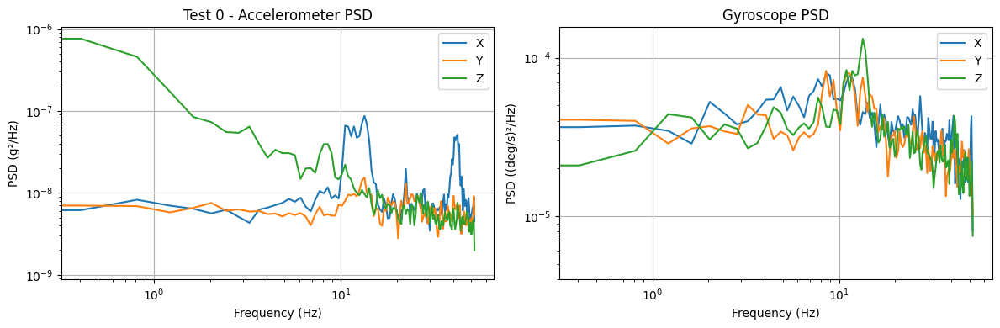

Test 0 - Noise characteristics:
  Accel RMS noise: [1.02126078 0.58941114 1.31529154] mg
  Gyro RMS noise: [0.6660629  0.91622159 1.02779646] deg/s


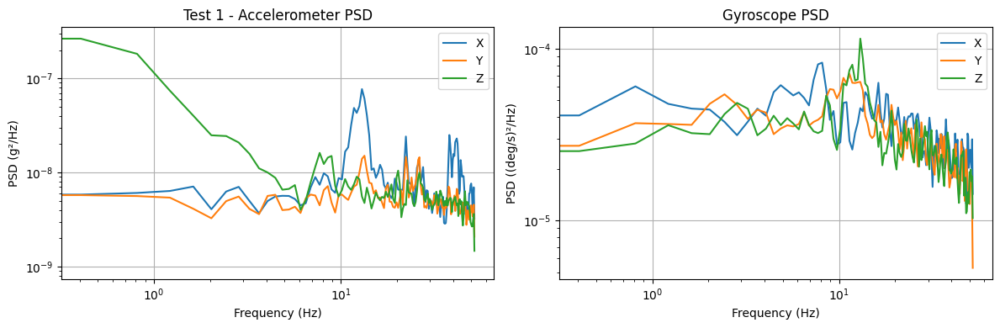

Test 1 - Noise characteristics:
  Accel RMS noise: [0.79065576 0.54803556 1.04545048] mg
  Gyro RMS noise: [0.28238634 0.41556833 0.34625762] deg/s


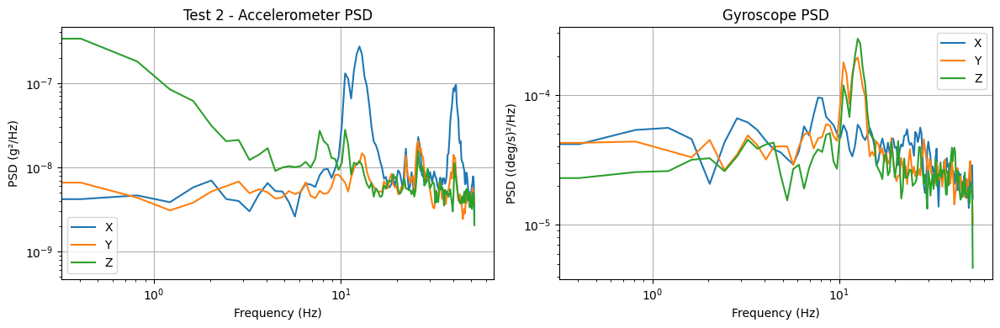

Test 2 - Noise characteristics:
  Accel RMS noise: [1.16495598 0.61065428 1.04258233] mg
  Gyro RMS noise: [0.29555592 0.43438276 0.37169446] deg/s


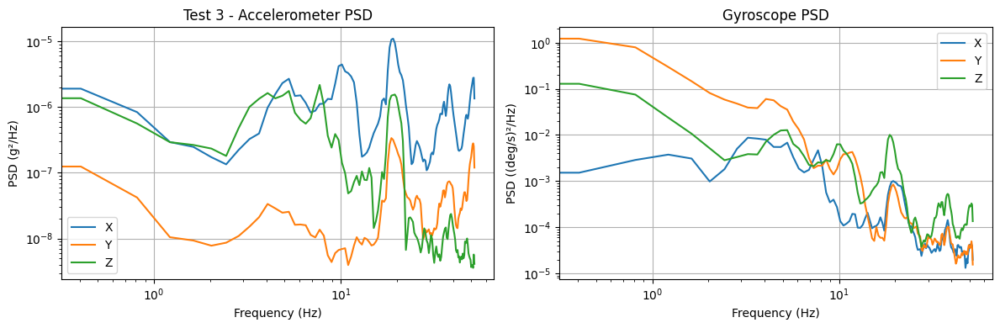

Test 3 - Noise characteristics:
  Accel RMS noise: [7.43172074 1.98152443 5.08149472] mg
  Gyro RMS noise: [0.30870893 1.04588985 0.49029794] deg/s


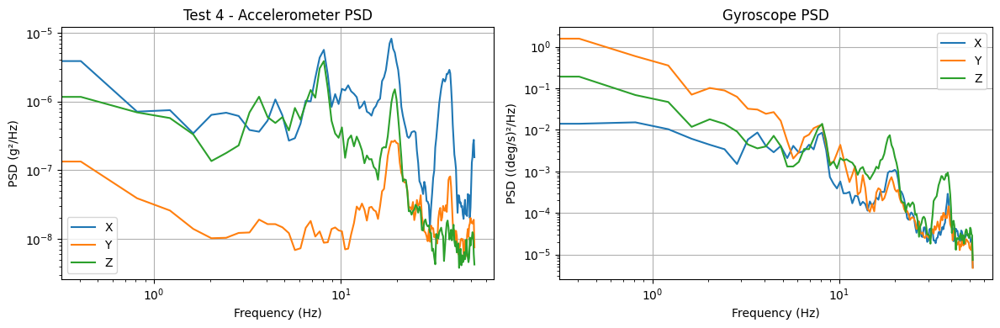

Test 4 - Noise characteristics:
  Accel RMS noise: [10.06824244  1.94241314  4.41285591] mg
  Gyro RMS noise: [0.42957645 1.40741911 0.67730554] deg/s


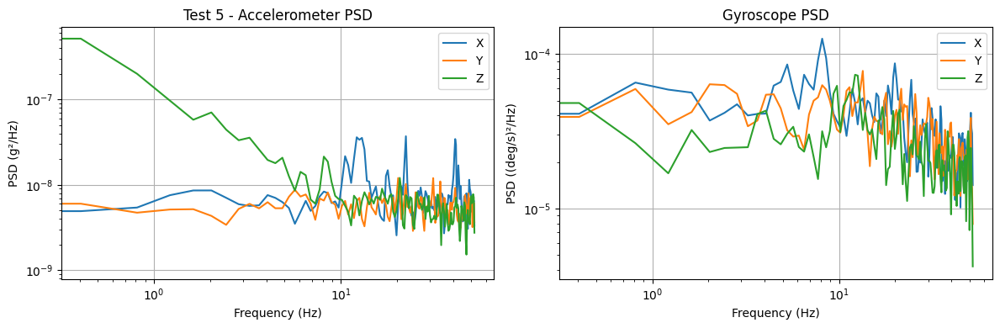

Test 5 - Noise characteristics:
  Accel RMS noise: [0.81183765 0.56600679 1.21256049] mg
  Gyro RMS noise: [0.39313154 0.58126356 0.4737265 ] deg/s


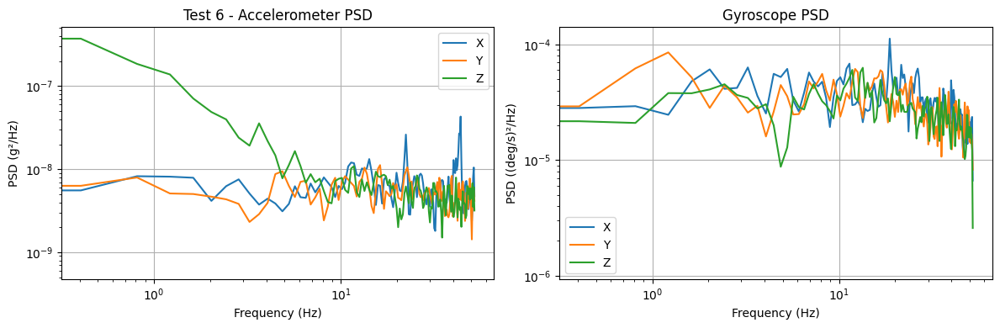

Test 6 - Noise characteristics:
  Accel RMS noise: [0.79746814 0.55552274 1.0965164 ] mg
  Gyro RMS noise: [0.40016492 0.58938326 0.48485797] deg/s


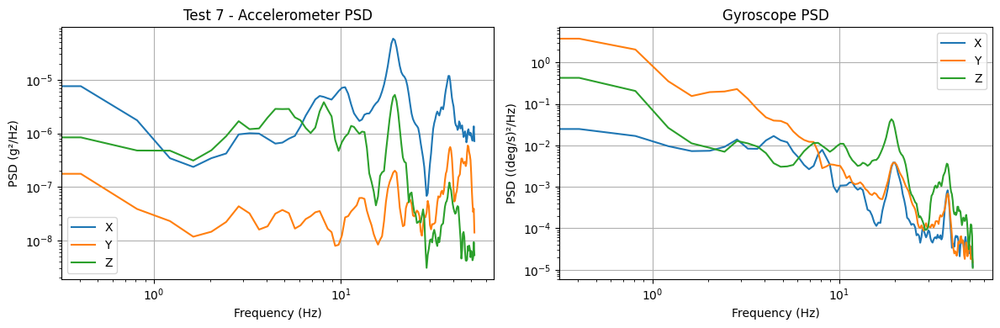

Test 7 - Noise characteristics:
  Accel RMS noise: [16.15443492  2.926098    7.11026152] mg
  Gyro RMS noise: [0.45232771 1.92000394 0.8187867 ] deg/s


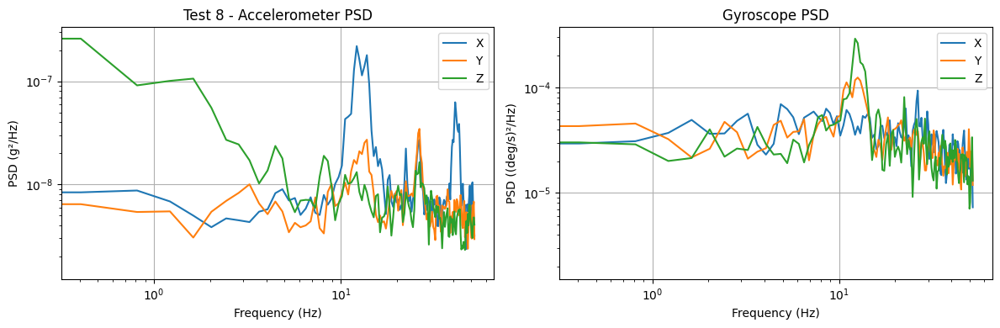

Test 8 - Noise characteristics:
  Accel RMS noise: [0.88580537 0.59503386 1.06331965] mg
  Gyro RMS noise: [0.40845037 0.60283968 0.50523234] deg/s


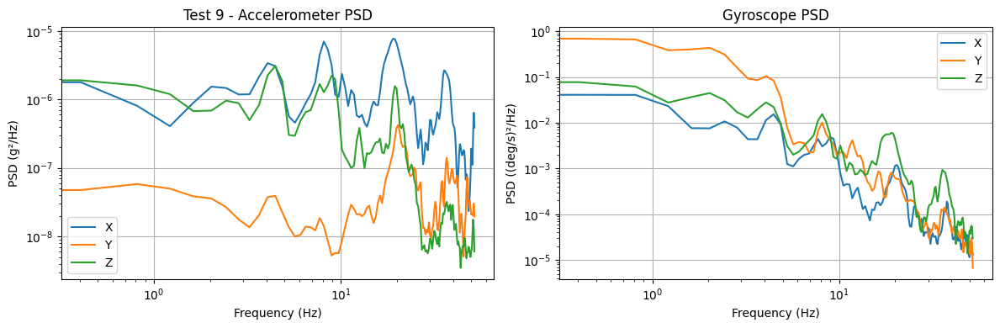

Test 9 - Noise characteristics:
  Accel RMS noise: [11.02656509  1.78456067  4.26463283] mg
  Gyro RMS noise: [0.44054527 1.08741552 0.6310547 ] deg/s


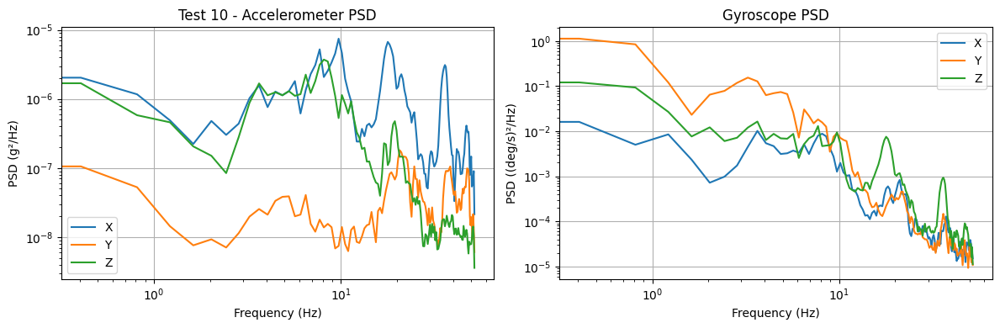

Test 10 - Noise characteristics:
  Accel RMS noise: [5.77011519 1.30843028 3.65274699] mg
  Gyro RMS noise: [0.43583072 1.06844143 0.59407255] deg/s


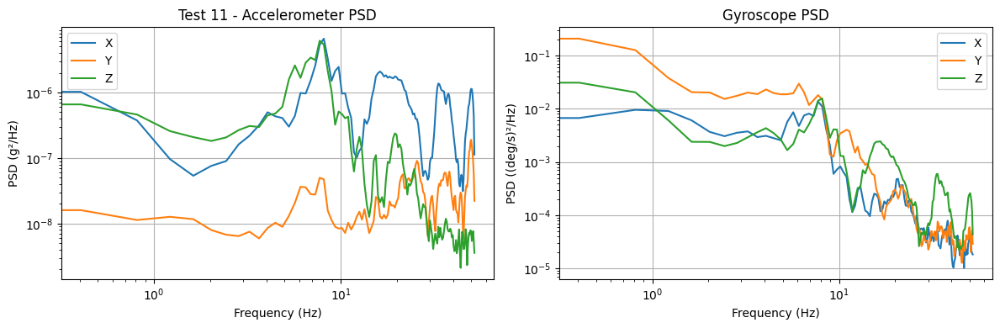

Test 11 - Noise characteristics:
  Accel RMS noise: [5.09363235 1.06673967 3.11433987] mg
  Gyro RMS noise: [0.43046224 0.77537463 0.54003515] deg/s


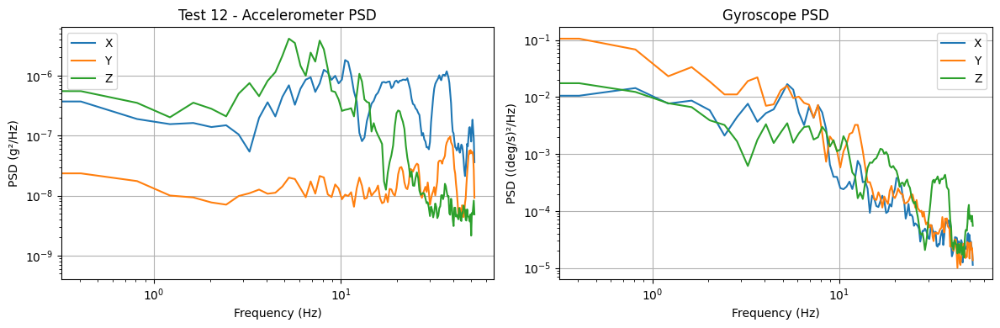

Test 12 - Noise characteristics:
  Accel RMS noise: [4.07316836 0.99884672 3.26583626] mg
  Gyro RMS noise: [0.4039235  0.65306126 0.47658001] deg/s

Evaluating performance for segments in raw_data_output_altitude.csv...


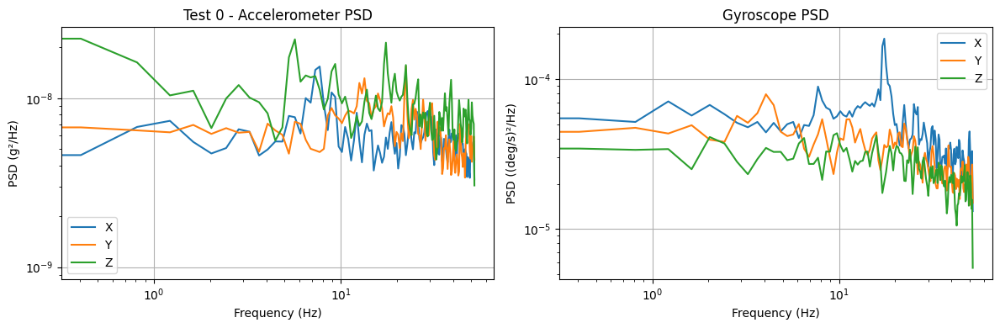

Test 0 - Noise characteristics:
  Accel RMS noise: [0.61133176 0.8154655  0.9532361 ] mg
  Gyro RMS noise: [0.08697599 0.06154203 0.03676989] deg/s


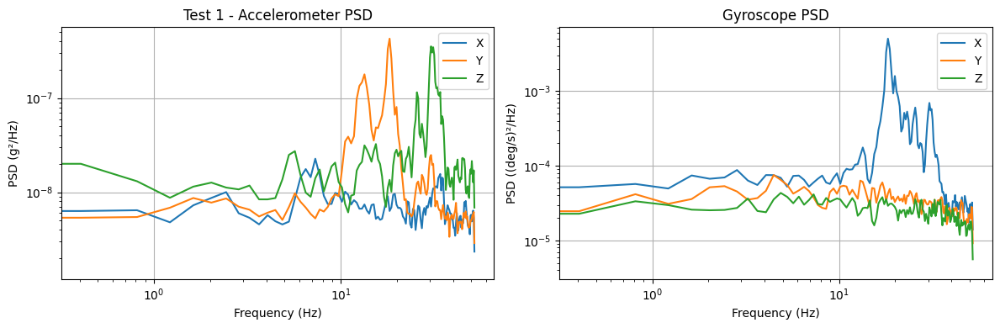

Test 1 - Noise characteristics:
  Accel RMS noise: [0.61391723 1.22219299 1.81514825] mg
  Gyro RMS noise: [0.42807251 1.35814147 0.60731574] deg/s


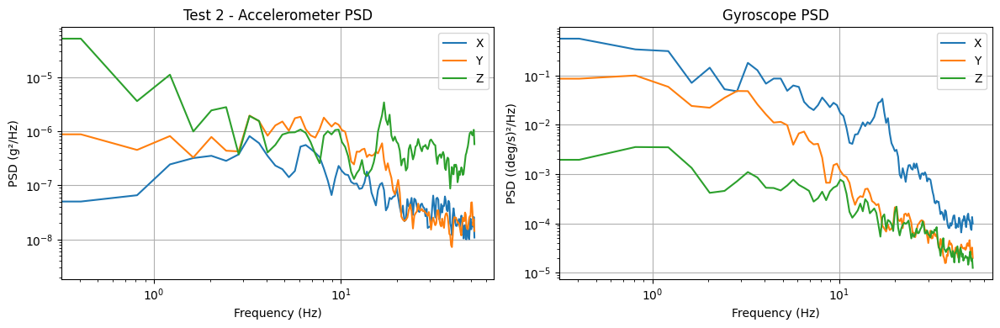

Test 2 - Noise characteristics:
  Accel RMS noise: [ 1.81209274  4.66157876 40.39099286] mg
  Gyro RMS noise: [1.0132564  1.39759855 0.61147295] deg/s


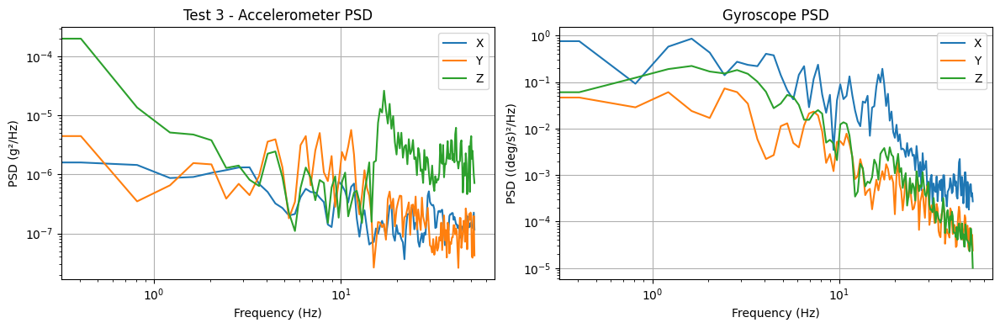

Test 3 - Noise characteristics:
  Accel RMS noise: [ 2.59683936 13.34583952 89.0439958 ] mg
  Gyro RMS noise: [1.58878761 1.87057844 0.99811397] deg/s


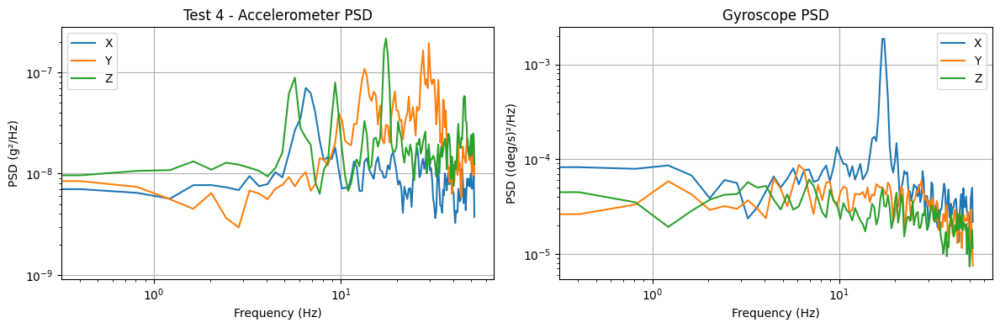

Test 4 - Noise characteristics:
  Accel RMS noise: [0.74057907 1.31795525 3.27040815] mg
  Gyro RMS noise: [0.56351564 1.85190697 0.82722437] deg/s


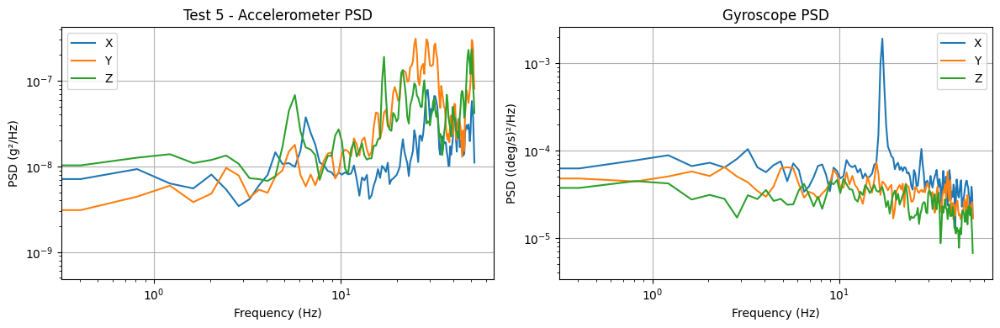

Test 5 - Noise characteristics:
  Accel RMS noise: [1.04254342 2.15103638 4.46498496] mg
  Gyro RMS noise: [0.55403608 1.81986914 0.81293526] deg/s


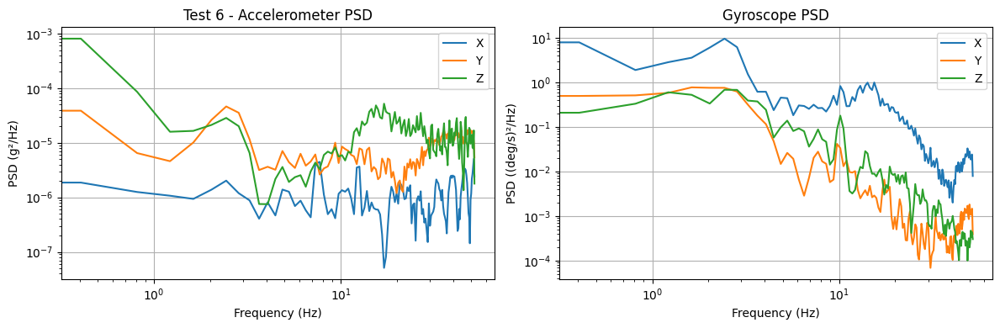

Test 6 - Noise characteristics:
  Accel RMS noise: [  6.02795435  28.77632362 129.34693111] mg
  Gyro RMS noise: [3.90009076 2.02846065 1.28345211] deg/s


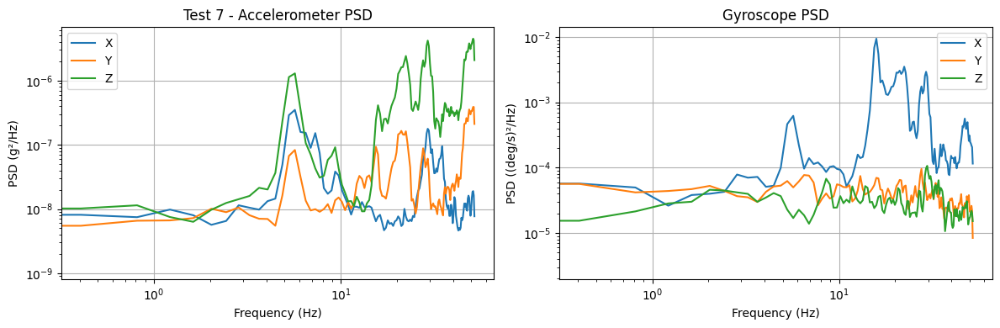

Test 7 - Noise characteristics:
  Accel RMS noise: [1.25931439 1.5957134  6.1364771 ] mg
  Gyro RMS noise: [0.55901672 1.76211689 0.78847639] deg/s


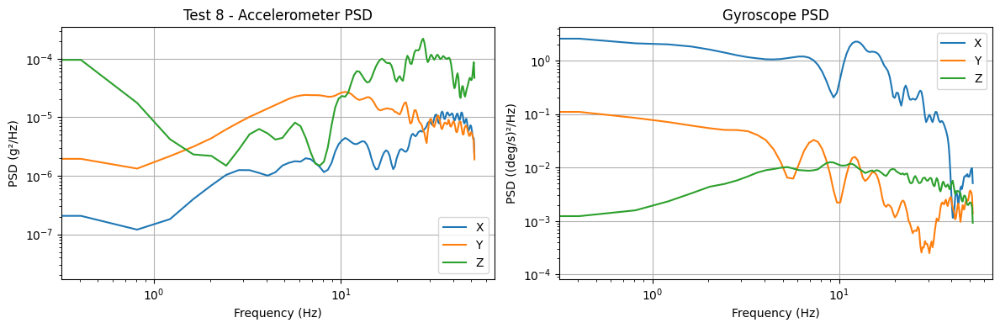

Test 8 - Noise characteristics:
  Accel RMS noise: [13.48501763 19.59173516 60.10870411] mg
  Gyro RMS noise: [4.05230744 1.94901472 0.94636716] deg/s


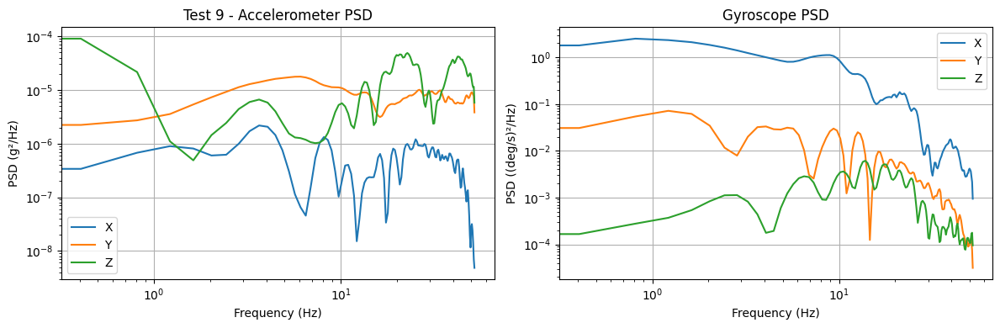

Test 9 - Noise characteristics:
  Accel RMS noise: [ 3.28277345 13.0174105  38.02205025] mg
  Gyro RMS noise: [2.60205738 1.93777083 0.86398997] deg/s


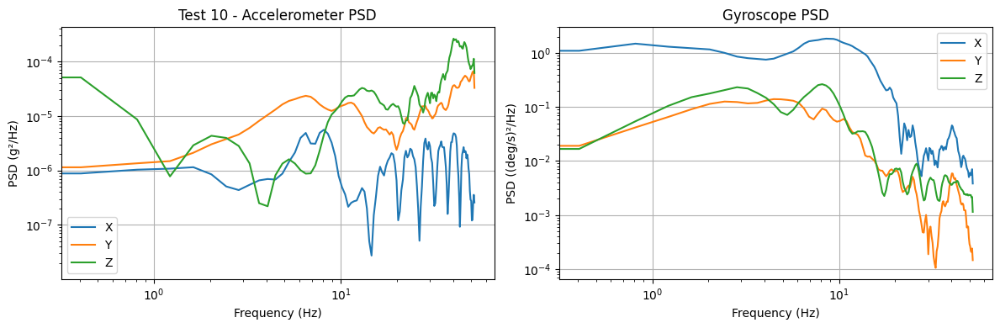

Test 10 - Noise characteristics:
  Accel RMS noise: [ 5.91682999 19.26626174 43.05836741] mg
  Gyro RMS noise: [2.82489085 1.95020142 1.17449202] deg/s


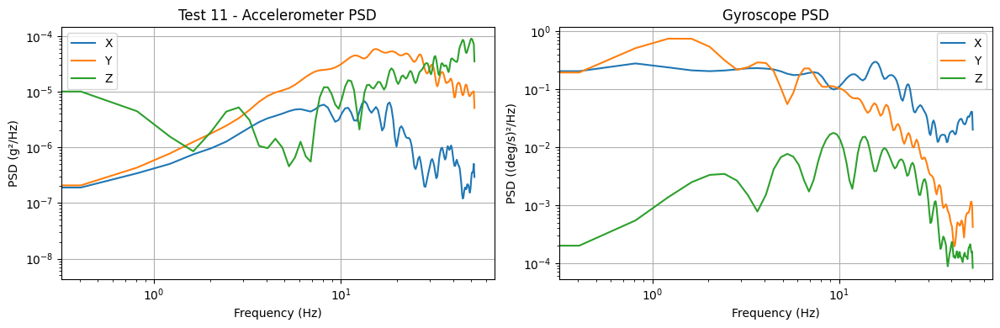

Test 11 - Noise characteristics:
  Accel RMS noise: [ 5.77000022 21.10190489 25.05178944] mg
  Gyro RMS noise: [1.4191914  2.13447968 0.8599011 ] deg/s


In [28]:
def characterize_noise(accel_g: np.ndarray, gyro_dps: np.ndarray, fs: float):
    """Characterize sensor noise properties"""
    
    # Time domain statistics
    accel_noise_rms = np.std(accel_g, axis=0)
    gyro_noise_rms = np.std(gyro_dps, axis=0)
    
    # Frequency domain analysis (using middle segment to avoid transients)
    n = len(accel_g)
    mid_start = n // 4
    mid_end = 3 * n // 4
    
    freqs, accel_psd = signal.welch(accel_g[mid_start:mid_end], fs=fs, axis=0)
    _, gyro_psd = signal.welch(gyro_dps[mid_start:mid_end], fs=fs, axis=0)
    
    return {
        'accel_noise_rms': accel_noise_rms,
        'gyro_noise_rms': gyro_noise_rms,
        'freqs': freqs,
        'accel_psd': accel_psd,
        'gyro_psd': gyro_psd
    }

# Analyze noise for each segment
all_noise_analyses = {}
for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    print(f"\nEvaluating performance for segments in {file_path}...")
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        noise = characterize_noise(analysis['accel_g'], analysis['gyro_dps'], fs)
        all_noise_analyses.setdefault(file_path, []).append(noise)
        
        # Plot noise characteristics
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 2, 1)
        plt.loglog(noise['freqs'], noise['accel_psd'])
        plt.title(f'Test {segment["test_id"]} - Accelerometer PSD')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('PSD (g²/Hz)')
        plt.legend(['X', 'Y', 'Z'])
        plt.grid(True)
        
        plt.subplot(1, 2, 2)
        plt.loglog(noise['freqs'], noise['gyro_psd'])
        plt.title('Gyroscope PSD')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('PSD ((deg/s)²/Hz)')
        plt.legend(['X', 'Y', 'Z'])
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()
        
        print(f"Test {segment['test_id']} - Noise characteristics:")
        print(f"  Accel RMS noise: {noise['accel_noise_rms']*1000} mg")
        print(f"  Gyro RMS noise: {noise['gyro_noise_rms']} deg/s")


## 7. Simple Complementary Filter

**Principle**: Combine low-frequency accelerometer with high-frequency gyroscope
- φ_fused = α * φ_gyro + (1-α) * φ_accel
- **Parameter**: α (typically 0.95-0.99) determines trust balance
- **Advantage**: Simple, computationally efficient
- **Limitation**: Fixed time constant

In [ ]:
def complementary_filter(accel_g: np.ndarray, gyro_dps: np.ndarray, dt: float, alpha: float = 0.98) -> np.ndarray:
    """Simple complementary filter for attitude estimation"""
    
    attitude = np.zeros((len(accel_g), 3))
    
    # Initialize with accelerometer
    attitude[0] = accel_to_attitude(accel_g[:1])[0]
    
    for i in range(1, len(accel_g)):
        # Gyroscope integration
        gyro_attitude = attitude[i-1] + gyro_dps[i-1] * dt
        
        # Accelerometer measurement
        accel_attitude = accel_to_attitude(accel_g[i:i+1])[0]
        
        # Complementary filter
        attitude[i, 0] = alpha * gyro_attitude[0] + (1-alpha) * accel_attitude[0]  # Roll
        attitude[i, 1] = alpha * gyro_attitude[1] + (1-alpha) * accel_attitude[1]  # Pitch  
        attitude[i, 2] = gyro_attitude[2]  # Yaw (gyro only)
        
        # Wrap angles
        for j in range(3):
            attitude[i, j] = wrap_angle_deg(attitude[i, j])
    
    return attitude

for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    # Apply complementary filter to all segments
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        dt = 1.0 / fs
        attitude_comp = complementary_filter(analysis['accel_g'], analysis['gyro_dps'], dt, alpha=0.98)
        attitude_accel = accel_to_attitude(analysis['accel_g'])
        
        plt.figure(figsize=(15, 4))
        
        plt.subplot(1, 3, 1)
        plt.plot(segment['data']['timestamp'], attitude_accel[:, 0], alpha=0.7, label='Accelerometer')
        plt.plot(segment['data']['timestamp'], attitude_comp[:, 0], label='Complementary Filter')
        plt.title(f'Test {segment["test_id"]} - Roll Estimation')
        plt.ylabel('Roll (deg)')
        plt.legend()
        plt.grid(True)
        
        plt.subplot(1, 3, 2)
        plt.plot(segment['data']['timestamp'], attitude_accel[:, 1], alpha=0.7, label='Accelerometer')
        plt.plot(segment['data']['timestamp'], attitude_comp[:, 1], label='Complementary Filter')
        plt.title('Pitch Estimation')
        plt.ylabel('Pitch (deg)')
        plt.legend()
        plt.grid(True)
        
        plt.subplot(1, 3, 3)
        plt.plot(segment['data']['timestamp'], attitude_comp[:, 2])
        plt.title('Yaw Estimation (Gyro Only)')
        plt.ylabel('Yaw (deg)')
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()


## 8. AHRS Filter Initialization

**Mathematical Framework**:
- **Madgwick**: β parameter controls convergence rate vs noise rejection
- **Mahony**: Kp (proportional) and Ki (integral) gains for complementary filter
- **EKF**: Process noise (Q) and measurement noise (R) covariance matrices
- **Quaternion Convention**: [w, x, y, z] scalar-first Hamilton convention

In [ ]:
from ahrs.filters import Madgwick, Mahony, EKF
from ahrs.common import Quaternion
def initialize_ahrs_filters(noise_params: dict, fs: float):
    """Initialize AHRS filters with tuned parameters based on noise analysis"""
    
    # Extract noise characteristics
    gyro_noise_std = np.mean(noise_params['gyro_noise_rms'])  # deg/s
    accel_noise_std = np.mean(noise_params['accel_noise_rms'])  # g
    
    # Madgwick filter - β controls filter convergence
    # Higher β = faster convergence, more noise
    # Typical range: 0.01 - 0.3
    beta = 0.041  # Madgwick recommended value for gyro noise ~3°/s
    madgwick = Madgwick(frequency=fs, beta=beta)
    
    # Mahony filter - PI controller gains
    # Kp: proportional gain (faster correction)  
    # Ki: integral gain (bias estimation)
    kp = 0.5   # Proportional gain
    ki = 0.0   # Integral gain (set to 0 without magnetometer)
    mahony = Mahony(frequency=fs, k_P=kp, k_I=ki)
    
    # EKF - Process and measurement noise covariances
    # Q: Process noise (gyroscope bias drift)
    # R: Measurement noise (accelerometer)
    ekf = EKF(frequency=fs)
    
    # Store noise parameters for reference
    filter_params = {
        'madgwick': {'beta': beta},
        'mahony': {'kp': kp, 'ki': ki},
        'ekf': {'gyro_noise': gyro_noise_std, 'accel_noise': accel_noise_std},
        'fs': fs
    }
    
    print("AHRS Filters initialized:")
    print(f"  Madgwick β: {beta}")
    print(f"  Mahony Kp: {kp}, Ki: {ki}")
    print(f"  EKF fs: {fs} Hz")
    print(f"  Noise params - Gyro: {gyro_noise_std:.3f}°/s, Accel: {accel_noise_std:.4f}g")
    
    return madgwick, mahony, ekf, filter_params

## 9. AHRS Filter Execution

**Implementation Details**:
- Convert sensor data to appropriate units (rad/s for gyro, g for accel)
- Apply filters sample-by-sample for realistic performance
- Extract Euler angles from quaternion output
- Handle angle wrapping and discontinuities

In [ ]:
def run_ahrs_filters(accel_g: np.ndarray, gyro_dps: np.ndarray, filters: tuple) -> dict:
    """Run AHRS filters on sensor data"""
    
    madgwick, mahony, ekf, params = filters
    n_samples = len(accel_g)
    
    # Convert units
    gyro_rad_s = np.radians(gyro_dps)  # Convert to rad/s
    
    # Initialize output arrays (quaternions)
    q_madgwick = np.zeros((n_samples, 4))
    q_mahony = np.zeros((n_samples, 4))
    q_ekf = np.zeros((n_samples, 4))
    
    # Initialize quaternions (identity)
    madgwick.Q = np.array([1.0, 0.0, 0.0, 0.0])  # [w, x, y, z]
    mahony.Q = np.array([1.0, 0.0, 0.0, 0.0])
    ekf.Q = np.array([1.0, 0.0, 0.0, 0.0])
    
    print(f"Processing {n_samples} samples...")
    
    # Process each sample
    for i in range(n_samples):
        # Madgwick filter update
        madgwick.updateIMU(q=madgwick.Q, gyr=gyro_rad_s[i], acc=accel_g[i])
        q_madgwick[i] = madgwick.Q.copy()
        
        # Mahony filter update  
        mahony.updateIMU(q=mahony.Q, gyr=gyro_rad_s[i], acc=accel_g[i])
        q_mahony[i] = mahony.Q.copy()
        
        # EKF filter update
        ekf.update(q=ekf.Q, gyr=gyro_rad_s[i], acc=accel_g[i])
        q_ekf[i] = ekf.Q.copy()
    
    # Convert quaternions to Euler angles
    def quat_to_euler(quaternions):
        """Convert quaternion array to Euler angles (roll, pitch, yaw) in degrees"""
        rotations = R.from_quat(quaternions[:, [1, 2, 3, 0]])  # Convert to [x,y,z,w] for scipy
        euler_rad = rotations.as_euler('xyz', degrees=False)
        return np.degrees(euler_rad)
    
    euler_madgwick = quat_to_euler(q_madgwick)
    euler_mahony = quat_to_euler(q_mahony) 
    euler_ekf = quat_to_euler(q_ekf)
    
    results = {
        'quaternions': {
            'madgwick': q_madgwick,
            'mahony': q_mahony, 
            'ekf': q_ekf
        },
        'euler': {
            'madgwick': euler_madgwick,
            'mahony': euler_mahony,
            'ekf': euler_ekf
        },
        'parameters': params
    }

    return results

for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        dt = 1.0 / fs
        filters = initialize_ahrs_filters(all_noise_analyses[file_path][i], fs)
        attitude_ahrs = run_ahrs_filters(analysis['accel_g'], analysis['gyro_dps'], filters)
        attitude_accel = accel_to_attitude(analysis['accel_g'])

        plt.figure(figsize=(15, 4))
        plt.subplot(1, 3, 1)
        plt.plot(segment['data']['timestamp'], attitude_accel[:, 0], alpha=0.7, label='Accelerometer')
        for name, euler in attitude_ahrs['euler'].items():
            plt.plot(segment['data']['timestamp'], euler[:, 0], label=f'{name.capitalize()} Filter')
        plt.title(f'Test {segment["test_id"]} - Roll Estimation')
        plt.ylabel('Roll (deg)')
        plt.legend()
        plt.grid(True)
        
        plt.subplot(1, 3, 2)
        plt.plot(segment['data']['timestamp'], attitude_accel[:, 1], alpha=0.7, label='Accelerometer')
        for name, euler in attitude_ahrs['euler'].items():
            plt.plot(segment['data']['timestamp'], euler[:, 1], label=f'{name.capitalize()} Filter')
        plt.title('Pitch Estimation')
        plt.ylabel('Pitch (deg)')
        plt.legend()
        plt.grid(True)
        
        plt.subplot(1, 3, 3)
        plt.plot(segment['data']['timestamp'], attitude_accel[:, 2], alpha=0.7, label='Accelerometer')
        for name, euler in attitude_ahrs['euler'].items():
            plt.plot(segment['data']['timestamp'], euler[:, 2], label=f'{name.capitalize()} Filter')
        plt.title('Yaw Estimation (Gyro Only)')
        plt.ylabel('Yaw (deg)')
        plt.legend()
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()


## 10. Performance Evaluation

Compare filter performance and prepare for advanced AHRS implementation.
Key metrics: stability, drift, response time, noise rejection.

In [ ]:
def evaluate_attitude_performance(attitude_data: np.ndarray, timestamps: np.ndarray, 
                                 title: str = "") -> dict:
    """Evaluate attitude estimation performance"""
    
    dt = timestamps[-1] - timestamps[0]
    
    # Stability metrics
    roll_stability = np.std(attitude_data[:, 0])
    pitch_stability = np.std(attitude_data[:, 1])
    yaw_stability = np.std(attitude_data[:, 2])
    
    # Drift metrics (linear trend)
    roll_drift_rate = (attitude_data[-1, 0] - attitude_data[0, 0]) / dt
    pitch_drift_rate = (attitude_data[-1, 1] - attitude_data[0, 1]) / dt
    yaw_drift_rate = (attitude_data[-1, 2] - attitude_data[0, 2]) / dt
    
    results = {
        'stability': [roll_stability, pitch_stability, yaw_stability],
        'drift_rate_deg_per_s': [roll_drift_rate, pitch_drift_rate, yaw_drift_rate],
        'total_drift_deg': [(attitude_data[-1, j] - attitude_data[0, j]) for j in range(3)]
    }
    
    print(f"{title} Performance:")
    print(f"  Stability (std): Roll {roll_stability:.3f}°, Pitch {pitch_stability:.3f}°, Yaw {yaw_stability:.3f}°")
    print(f"  Drift rate: Roll {roll_drift_rate:.4f}°/s, Pitch {pitch_drift_rate:.4f}°/s, Yaw {yaw_drift_rate:.4f}°/s")
    
    return results

# Evaluate performance for each segment
print("=== ATTITUDE ESTIMATION PERFORMANCE SUMMARY ===")

for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    print(f"\nEvaluating performance for segments in {file_path}...")
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        print(f"\nTest {segment['test_id']}:")
        
        # Compare accelerometer vs complementary filter
        attitude_accel = accel_to_attitude(analysis['accel_g'])
        dt = 1.0 / fs
        attitude_comp = complementary_filter(analysis['accel_g'], analysis['gyro_dps'], dt)

        filters = initialize_ahrs_filters(all_noise_analyses[file_path][i], fs)
        attitude_ahrs = run_ahrs_filters(analysis['accel_g'], analysis['gyro_dps'], filters)
        
        
        timestamps = segment['data']['timestamp'].values
        
        accel_perf = evaluate_attitude_performance(attitude_accel, timestamps, "Accelerometer")
        comp_perf = evaluate_attitude_performance(attitude_comp, timestamps, "Complementary Filter")
        for name, euler in attitude_ahrs['euler'].items():
            ahrs_perf = evaluate_attitude_performance(euler, timestamps, f"{name.capitalize()} Filter")

    # Key parameters to tune based on noise analysis:
    # - Process noise covariance (gyroscope bias instability)
    # - Measurement noise covariance (accelerometer noise)
    # - Filter gain/time constants

# 11. Filter Optimization and Analysis
This section implements proper parameter optimization and Allan variance analysis
for more rigorous AHRS filter tuning.


In [ ]:
from scipy.optimize import minimize_scalar, differential_evolution
from scipy.stats import chi2

def allan_variance(data: np.ndarray, fs: float, max_clusters: int = None) -> tuple:
    """
    Calculate Allan variance for gyroscope bias stability analysis
    
    Args:
        data: 1D array of gyroscope data (deg/s)
        fs: Sampling frequency (Hz)
        max_clusters: Maximum number of clusters to analyze
        
    Returns:
        tau: Array of averaging times (seconds)
        avar: Array of Allan variance values
    """
    n = len(data)
    if max_clusters is None:
        max_clusters = n // 10
    
    # Cluster sizes (tau in samples)
    clusters = np.logspace(0, np.log10(max_clusters), 50, dtype=int)
    clusters = np.unique(clusters)
    clusters = clusters[clusters < n//3]  # Ensure enough data for averaging
    
    tau = clusters / fs  # Convert to time
    avar = np.zeros(len(clusters))
    
    for i, m in enumerate(clusters):
        # Calculate overlapping Allan deviation
        if n < 3 * m:
            continue
            
        # Cluster averages
        n_clusters = (n - 1) // m
        cluster_avgs = []
        
        for j in range(n_clusters):
            start_idx = j * m
            end_idx = start_idx + m
            cluster_avgs.append(np.mean(data[start_idx:end_idx]))
        
        cluster_avgs = np.array(cluster_avgs)
        
        # Allan variance calculation
        if len(cluster_avgs) > 1:
            diff_squared = np.diff(cluster_avgs) ** 2
            avar[i] = 0.5 * np.mean(diff_squared)
    
    # Remove zero entries
    valid = avar > 0
    return tau[valid], avar[valid]

def plot_allan_variance(gyro_data: np.ndarray, fs: float, title: str = ""):
    """Plot Allan variance for all three gyroscope axes"""
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    axis_names = ['X', 'Y', 'Z']
    
    for i in range(3):
        tau, avar = allan_variance(gyro_data[:, i], fs)
        axes[i].loglog(tau, np.sqrt(avar), 'b.-', linewidth=2, markersize=4)
        axes[i].set_xlabel('Averaging Time τ (s)')
        axes[i].set_ylabel('Allan Deviation (deg/s)')
        axes[i].set_title(f'{title} - Gyro {axis_names[i]} Allan Variance')
        axes[i].grid(True, alpha=0.3)
        
        # Add theoretical slope lines for reference
        if len(tau) > 10:
            mid_tau = tau[len(tau)//2]
            mid_avar = np.sqrt(avar[len(avar)//2])
            
            # White noise slope (-1/2)
            white_noise = mid_avar * (tau / mid_tau) ** (-0.5)
            axes[i].loglog(tau, white_noise, 'r--', alpha=0.7, label='White Noise (-1/2)')
            
            # Bias instability slope (0)
            bias_instability = np.full_like(tau, mid_avar)
            axes[i].loglog(tau, bias_instability, 'g--', alpha=0.7, label='Bias Instability (0)')
            
            # Random walk slope (+1/2)
            random_walk = mid_avar * (tau / mid_tau) ** (0.5)
            axes[i].loglog(tau, random_walk, 'm--', alpha=0.7, label='Random Walk (+1/2)')
            
            axes[i].legend(fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    return tau, avar

def optimize_madgwick_beta(accel_g: np.ndarray, gyro_dps: np.ndarray, fs: float, 
                          reference_attitude: np.ndarray = None) -> dict:
    """
    Optimize Madgwick filter beta parameter using different criteria
    
    Args:
        accel_g: Accelerometer data in g
        gyro_dps: Gyroscope data in deg/s  
        fs: Sampling frequency
        reference_attitude: Ground truth attitude for comparison (optional)
        
    Returns:
        Dictionary with optimal parameters and metrics
    """
    from ahrs.filters import Madgwick
    
    def objective_function(beta):
        """Objective function for beta optimization"""
        madgwick = Madgwick(frequency=fs, beta=beta)
        madgwick.Q = np.array([1.0, 0.0, 0.0, 0.0])
        
        gyro_rad_s = np.radians(gyro_dps)
        n_samples = len(accel_g)
        quaternions = np.zeros((n_samples, 4))
        
        for i in range(n_samples):
            madgwick.updateIMU(q=madgwick.Q, gyr=gyro_rad_s[i], acc=accel_g[i])
            quaternions[i] = madgwick.Q.copy()
        
        # Convert to Euler angles
        rotations = R.from_quat(quaternions[:, [1, 2, 3, 0]])
        euler_angles = rotations.as_euler('xyz', degrees=True)
        
        # Optimization criteria
        if reference_attitude is not None:
            # Use RMSE against reference if available
            rmse = np.sqrt(np.mean((euler_angles - reference_attitude) ** 2))
            return rmse
        else:
            # Use combination of stability and responsiveness
            # Stability: minimize variance in steady-state regions
            stability_cost = np.sum(np.var(euler_angles, axis=0))
            
            # Responsiveness: penalize excessive smoothing (measured by lag)
            accel_attitude = accel_to_attitude(accel_g)
            lag_cost = np.sum(np.var(euler_angles[:, :2] - accel_attitude[:, :2], axis=0))
            
            return stability_cost + 0.1 * lag_cost
    
    # Optimize beta in reasonable range
    result = minimize_scalar(objective_function, bounds=(0.001, 1.0), method='bounded')
    
    optimal_beta = result.x
    optimal_cost = result.fun
    
    print(f"Optimal Madgwick β: {optimal_beta:.4f}")
    print(f"Optimization cost: {optimal_cost:.4f}")
    
    return {
        'optimal_beta': optimal_beta,
        'cost': optimal_cost,
        'convergence': result.success
    }

def adaptive_complementary_filter(accel_g: np.ndarray, gyro_dps: np.ndarray, 
                                dt: float) -> np.ndarray:
    """
    Adaptive complementary filter that adjusts alpha based on acceleration magnitude
    
    The idea is to trust accelerometer more when |a| ≈ 1g (static conditions)
    and trust gyroscope more during dynamic motion (|a| >> 1g)
    """
    attitude = np.zeros((len(accel_g), 3))
    attitude[0] = accel_to_attitude(accel_g[:1])[0]
    
    # Adaptive parameters
    alpha_static = 0.98   # High gyro trust during static conditions
    alpha_dynamic = 0.995 # Very high gyro trust during dynamic conditions
    accel_threshold = 0.1 # Threshold for detecting dynamic motion (g)
    
    for i in range(1, len(accel_g)):
        # Calculate acceleration magnitude deviation from 1g
        accel_mag = np.linalg.norm(accel_g[i])
        accel_error = abs(accel_mag - 1.0)
        
        # Adapt alpha based on motion detection
        if accel_error < accel_threshold:
            alpha = alpha_static  # Trust accelerometer more during static conditions
        else:
            # Dynamic motion detected - trust gyroscope more
            alpha = alpha_dynamic
        
        # Gyroscope integration
        gyro_attitude = attitude[i-1] + gyro_dps[i-1] * dt
        
        # Accelerometer measurement
        accel_attitude = accel_to_attitude(accel_g[i:i+1])[0]
        
        # Adaptive complementary filter
        attitude[i, 0] = alpha * gyro_attitude[0] + (1-alpha) * accel_attitude[0]  # Roll
        attitude[i, 1] = alpha * gyro_attitude[1] + (1-alpha) * accel_attitude[1]  # Pitch  
        attitude[i, 2] = gyro_attitude[2]  # Yaw (gyro only)
        
        # Wrap angles
        for j in range(3):
            attitude[i, j] = wrap_angle_deg(attitude[i, j])
    
    return attitude

def confidence_intervals(attitude_estimates: dict, confidence_level: float = 0.95) -> dict:
    """
    Calculate confidence intervals for attitude estimates using bootstrap method
    """
    n_bootstrap = 1000
    alpha = 1 - confidence_level
    
    confidence_intervals = {}
    
    for filter_name, attitude in attitude_estimates.items():
        n_samples = len(attitude)
        bootstrap_means = np.zeros((n_bootstrap, 3))
        
        for i in range(n_bootstrap):
            # Bootstrap sample
            indices = np.random.choice(n_samples, n_samples, replace=True)
            bootstrap_sample = attitude[indices]
            bootstrap_means[i] = np.mean(bootstrap_sample, axis=0)
        
        # Calculate confidence intervals
        lower_percentile = (alpha/2) * 100
        upper_percentile = (1 - alpha/2) * 100
        
        lower_bounds = np.percentile(bootstrap_means, lower_percentile, axis=0)
        upper_bounds = np.percentile(bootstrap_means, upper_percentile, axis=0)
        
        confidence_intervals[filter_name] = {
            'lower': lower_bounds,
            'upper': upper_bounds,
            'mean': np.mean(attitude, axis=0)
        }
    
    return confidence_intervals

# %% Apply Advanced Analysis to Test Data

print("=== ADVANCED FILTER OPTIMIZATION ANALYSIS ===")

# Run advanced analysis on each test file
for file_path, sensor_analyses in test_sensor_analyses.items():
    segments = segmented[file_path]
    noise_analyses = all_noise_analyses[file_path]
    
    print(f"\nAnalyzing {file_path}...")
    
    for i, (segment, analysis) in enumerate(zip(segments, sensor_analyses)):
        print(f"\n--- Test {segment['test_id']} ---")
        
        # Allan variance analysis
        print("Calculating Allan variance...")
        tau, avar = plot_allan_variance(analysis['gyro_dps'], fs, 
                                       f"{file_path} - Test {segment['test_id']}")
        
        # Optimize Madgwick beta parameter
        print("Optimizing Madgwick β parameter...")
        beta_opt = optimize_madgwick_beta(analysis['accel_g'], analysis['gyro_dps'], fs)
        
        # Compare different filter approaches
        dt = 1.0 / fs
        attitude_accel = accel_to_attitude(analysis['accel_g'])
        attitude_comp_fixed = complementary_filter(analysis['accel_g'], analysis['gyro_dps'], dt, alpha=0.98)
        attitude_comp_adaptive = adaptive_complementary_filter(analysis['accel_g'], analysis['gyro_dps'], dt)
        
        # Run optimized Madgwick
        madgwick_opt = Madgwick(frequency=fs, beta=beta_opt['optimal_beta'])
        madgwick_opt.Q = np.array([1.0, 0.0, 0.0, 0.0])
        
        gyro_rad_s = np.radians(analysis['gyro_dps'])
        n_samples = len(analysis['accel_g'])
        q_madgwick_opt = np.zeros((n_samples, 4))
        
        for j in range(n_samples):
            madgwick_opt.updateIMU(q=madgwick_opt.Q, gyr=gyro_rad_s[j], acc=analysis['accel_g'][j])
            q_madgwick_opt[j] = madgwick_opt.Q.copy()
        
        rotations = R.from_quat(q_madgwick_opt[:, [1, 2, 3, 0]])
        attitude_madgwick_opt = rotations.as_euler('xyz', degrees=True)
        
        # Calculate confidence intervals
        attitude_estimates = {
            'Accelerometer': attitude_accel,
            'Complementary (Fixed)': attitude_comp_fixed,
            'Complementary (Adaptive)': attitude_comp_adaptive,
            'Madgwick (Optimized)': attitude_madgwick_opt
        }
        
        ci = confidence_intervals(attitude_estimates)
        
        # Plot comparison
        timestamps = segment['data']['timestamp'].values
        fig, axes = plt.subplots(2, 3, figsize=(18, 8))
        
        # Roll comparison
        for name, attitude in attitude_estimates.items():
            axes[0, 0].plot(timestamps, attitude[:, 0], label=name, alpha=0.8)
        axes[0, 0].set_title(f'Test {segment["test_id"]} - Roll Comparison')
        axes[0, 0].set_ylabel('Roll (deg)')
        axes[0, 0].legend()
        axes[0, 0].grid(True)
        
        # Pitch comparison
        for name, attitude in attitude_estimates.items():
            axes[0, 1].plot(timestamps, attitude[:, 1], label=name, alpha=0.8)
        axes[0, 1].set_title('Pitch Comparison')
        axes[0, 1].set_ylabel('Pitch (deg)')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
        
        # Yaw comparison
        for name, attitude in attitude_estimates.items():
            axes[0, 2].plot(timestamps, attitude[:, 2], label=name, alpha=0.8)
        axes[0, 2].set_title('Yaw Comparison')
        axes[0, 2].set_ylabel('Yaw (deg)')
        axes[0, 2].legend()
        axes[0, 2].grid(True)
        
        # Performance metrics
        axis_names = ['Roll', 'Pitch', 'Yaw']
        metrics = ['Stability (std)', 'Mean', 'Range']
        
        for j, axis_name in enumerate(axis_names):
            stabilities = []
            means = []
            ranges = []
            filter_names = list(attitude_estimates.keys())
            
            for name, attitude in attitude_estimates.items():
                stabilities.append(np.std(attitude[:, j]))
                means.append(np.mean(attitude[:, j]))
                ranges.append(np.ptp(attitude[:, j]))
            
            x = np.arange(len(filter_names))
            width = 0.25
            
            axes[1, j].bar(x - width, stabilities, width, label='Stability (std)', alpha=0.7)
            axes[1, j].bar(x, np.abs(means), width, label='|Mean|', alpha=0.7)
            axes[1, j].bar(x + width, ranges, width, label='Range', alpha=0.7)
            
            axes[1, j].set_title(f'{axis_name} - Performance Metrics')
            axes[1, j].set_ylabel('Degrees')
            axes[1, j].set_xticks(x)
            axes[1, j].set_xticklabels(filter_names, rotation=45, ha='right')
            axes[1, j].legend()
            axes[1, j].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Print confidence intervals
        # print("\nConfidence Intervals (